In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
from typing import Tuple, Dict, Any
import torch.optim as optim
import matplotlib.pyplot as plt
import json
import os
from datetime import datetime
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
from pathlib import Path
from typing import Tuple, Dict, List, Optional, Union
import random
from torchvision import transforms
import torchvision.transforms.functional as TF

In [2]:
import psutil
print(f"Memory usage: {psutil.virtual_memory().percent}%")
print(f"CPU usage: {psutil.cpu_percent()}%")

Memory usage: 12.8%
CPU usage: 9.0%


In [3]:
print(torch.version.cuda)
print(torch.__version__)

12.1
2.5.1+cu121


In [4]:
torch.cuda.empty_cache()

In [5]:
if torch.cuda.is_available():
    num_gpus = torch.cuda.device_count()
    print(f"Number of GPUs available: {num_gpus}")
    if num_gpus > 0:
        for i in range(num_gpus):
            print(f"GPU {i}: {torch.cuda.get_device_name(i)}")
            print(f"GPU {i} Memory: {torch.cuda.get_device_properties(i).total_memory / 1024**3:.1f} GB")
    # Set the device to the first GPU by default, DataParallel will handle distribution
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
else:
    device = torch.device('cpu')
    print("CUDA not available. Training on CPU.")

print(f"Using device: {device}")

Number of GPUs available: 2
GPU 0: NVIDIA RTX A5000
GPU 0 Memory: 23.6 GB
GPU 1: NVIDIA RTX A5000
GPU 1 Memory: 23.5 GB
Using device: cuda:0


In [6]:
from DatasetsLoader import PyTorchDatasetLoader, DatasetLoaderWrapper

# train_loader = DatasetLoaderWrapper(
#     working_path="train",
#     batch_size=16,
#     export_type="NDVI", # RGB, RGBN
#     outputs_type="both",
#     shuffle=True,
#     augmentation=True
# )

# for x_batch, y_batch in train_loader:
#     print("Input batch shape:", x_batch.shape)
#     print("Segmentation output batch shape:", y_batch['segmentation_output'].shape)
#     print("Classification output batch shape:", y_batch['classification_output'].shape)
#     break

In [7]:
def create_pytorch_datasets(
    working_path: str, 
    batch_size: int, 
    export_type: str, 
    input_shape: Optional[Tuple[int, int, int]] = None,
    augmentation: bool = False,
    num_workers: int = 4
) -> Tuple[DataLoader, DataLoader]:
    
    # Training dataset with augmentation
    train_dataset = PyTorchDatasetLoader(
        working_path=f"{working_path}/train",
        export_type=export_type,
        outputs_type="both",
        augmentation=augmentation,
        shuffle=True
    )
    
    # Validation dataset without augmentation
    val_dataset = PyTorchDatasetLoader(
        working_path=f"{working_path}/val",
        export_type=export_type,
        outputs_type="both",
        augmentation=False,
        shuffle=False
    )
    
    # Create DataLoaders
    train_dataloader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
        drop_last=True  # Drop last incomplete batch for consistent training
    )
    
    val_dataloader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True,
        drop_last=False
    )
    
    return train_dataloader, val_dataloader

spliting only train folder

In [8]:
from DatasetsLoaderSplits import PyTorchDatasetLoader, DatasetLoaderWrapper
import torch

def create_pytorch_datasets(
    working_path: str, 
    batch_size: int, 
    export_type: str, 
    input_shape: Optional[Tuple[int, int, int]] = None,
    augmentation: bool = False,
    num_workers: int = 4,
    test_size: float = 0.15,
    val_size: float = 0.15
) -> Tuple[DataLoader, DataLoader, DataLoader]:
    
    # Training dataset with augmentation
    train_dataset = PyTorchDatasetLoader(
        working_path=working_path,
        export_type=export_type,
        outputs_type="both",
        augmentation=augmentation,
        shuffle=True,
        test_size=test_size,
        val_size=val_size,
        split_type="train"
    )
    
    # Validation dataset without augmentation
    val_dataset = PyTorchDatasetLoader(
        working_path=working_path,
        export_type=export_type,
        outputs_type="both",
        augmentation=False,
        shuffle=False,
        test_size=test_size,
        val_size=val_size,
        split_type="val"
    )
    
    # Test dataset without augmentation
    test_dataset = PyTorchDatasetLoader(
        working_path=working_path,
        export_type=export_type,
        outputs_type="both",
        augmentation=False,
        shuffle=False,
        test_size=test_size,
        val_size=val_size,
        split_type="test"
    )
    
    # Create DataLoaders
    train_dataloader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
        drop_last=True 
    )
    
    val_dataloader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True,
        drop_last=False
    )
    
    test_dataloader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True,
        drop_last=False
    )
    
    return train_dataloader, val_dataloader, test_dataloader

## Model Architecture

In [9]:

class SeparableConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, padding=0):
        super(SeparableConv2d, self).__init__()
        self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size, 
                                 padding=padding, groups=in_channels, bias=False)
        self.pointwise = nn.Conv2d(in_channels, out_channels, 1, bias=False)
    
    def forward(self, x):
        x = self.depthwise(x)
        x = self.pointwise(x)
        return x

class SeparableResidualBlock(nn.Module):
    def __init__(self, in_channels, num_filters, kernel_size=3):
        super(SeparableResidualBlock, self).__init__()
        padding = kernel_size // 2
        
        self.sep_conv1 = SeparableConv2d(in_channels, num_filters, kernel_size, padding)
        self.bn1 = nn.BatchNorm2d(num_filters)
        self.sep_conv2 = SeparableConv2d(num_filters, num_filters, kernel_size, padding)
        self.bn2 = nn.BatchNorm2d(num_filters)
        
        self.skip_conv = None
        if in_channels != num_filters:
            self.skip_conv = nn.Conv2d(in_channels, num_filters, 1, bias=False)
    
    def forward(self, x):
        residual = x
        
        out = self.sep_conv1(x)
        out = self.bn1(out)
        out = F.relu(out)
        out = self.sep_conv2(out)
        out = self.bn2(out)
        
        if self.skip_conv is not None:
            residual = self.skip_conv(residual)
        
        out = out + residual
        out = F.relu(out)
        return out

class LiteEncoderBlock(nn.Module):
    def __init__(self, in_channels, num_filters, dropout_rate=0.1):
        super(LiteEncoderBlock, self).__init__()
        self.sep_conv = SeparableConv2d(in_channels, num_filters, 3, padding=1)
        self.bn = nn.BatchNorm2d(num_filters)
        self.dropout = nn.Dropout2d(dropout_rate) if dropout_rate > 0 else None
        self.pool = nn.MaxPool2d(2, 2)
    
    def forward(self, x):
        x = self.sep_conv(x)
        x = self.bn(x)
        x = F.relu(x)
        
        if self.dropout is not None:
            x = self.dropout(x)
        
        skip = x
        pooled = self.pool(x)
        return skip, pooled

class LiteDecoderBlock(nn.Module):
    def __init__(self, in_channels, skip_channels, num_filters, dropout_rate=0.1):
        super(LiteDecoderBlock, self).__init__()
        self.upsample = nn.ConvTranspose2d(in_channels, num_filters, 3, stride=2, padding=1, output_padding=1)
        self.sep_conv = SeparableConv2d(num_filters + skip_channels, num_filters, 3, padding=1)
        self.bn = nn.BatchNorm2d(num_filters)
        self.dropout = nn.Dropout2d(dropout_rate) if dropout_rate > 0 else None
    
    def forward(self, x, skip_features):
        x = self.upsample(x)
        
        # Handle size mismatch
        if x.shape[2:] != skip_features.shape[2:]:
            x = F.interpolate(x, size=skip_features.shape[2:], mode='bilinear', align_corners=False)
        
        x = torch.cat([x, skip_features], dim=1)
        x = self.sep_conv(x)
        x = self.bn(x)
        x = F.relu(x)
        
        if self.dropout is not None:
            x = self.dropout(x)
        
        return x

class OptimizedMultiTaskUNet512(nn.Module):
    def __init__(self, input_channels, num_classes, filters_base=16, dropout_rate=0.1):
        super(OptimizedMultiTaskUNet512, self).__init__()
        
        # Initial convolution
        self.initial_conv = nn.Sequential(
            nn.Conv2d(input_channels, filters_base, 3, padding=1, bias=False),
            nn.BatchNorm2d(filters_base),
            nn.ReLU(inplace=True)
        )
        
        # Encoder blocks
        self.encoder1 = LiteEncoderBlock(filters_base, filters_base, dropout_rate)
        self.encoder2 = LiteEncoderBlock(filters_base, filters_base*2, dropout_rate)
        self.encoder3 = LiteEncoderBlock(filters_base*2, filters_base*4, dropout_rate)
        self.encoder4 = LiteEncoderBlock(filters_base*4, filters_base*8, dropout_rate)
        self.encoder5 = LiteEncoderBlock(filters_base*8, filters_base*16, dropout_rate)
        
        # Bottleneck
        self.bottleneck = nn.Sequential(
            SeparableResidualBlock(filters_base*16, filters_base*32),
            nn.Dropout2d(dropout_rate*2)
        )
        
        # Decoder blocks
        self.decoder1 = LiteDecoderBlock(filters_base*32, filters_base*16, filters_base*16, dropout_rate)
        self.decoder2 = LiteDecoderBlock(filters_base*16, filters_base*8, filters_base*8, dropout_rate)
        self.decoder3 = LiteDecoderBlock(filters_base*8, filters_base*4, filters_base*4, dropout_rate)
        self.decoder4 = LiteDecoderBlock(filters_base*4, filters_base*2, filters_base*2, dropout_rate)
        self.decoder5 = LiteDecoderBlock(filters_base*2, filters_base, filters_base, dropout_rate)
        
        # Segmentation output
        self.segmentation_head = nn.Conv2d(filters_base, 1, 1)
        
        # Classification branch
        self.global_avg_pool = nn.AdaptiveAvgPool2d(1)
        self.global_max_pool = nn.AdaptiveMaxPool2d(1)
        
        self.classification_head = nn.Sequential(
            nn.Linear(filters_base*32*2, 128),  # *2 for avg and max pooling concat
            nn.BatchNorm1d(128),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(128, num_classes)
        )
    
    def forward(self, x):
        # Initial convolution
        x = self.initial_conv(x)
        
        # Encoder path
        s1, p1 = self.encoder1(x)
        s2, p2 = self.encoder2(p1)
        s3, p3 = self.encoder3(p2)
        s4, p4 = self.encoder4(p3)
        s5, p5 = self.encoder5(p4)
        
        # Bottleneck
        bottleneck = self.bottleneck(p5)
        
        # Decoder path
        d1 = self.decoder1(bottleneck, s5)
        d2 = self.decoder2(d1, s4)
        d3 = self.decoder3(d2, s3)
        d4 = self.decoder4(d3, s2)
        d5 = self.decoder5(d4, s1)
        
        # Segmentation output
        segmentation_output = torch.sigmoid(self.segmentation_head(d5))
        
        # Classification branch
        avg_pool = self.global_avg_pool(bottleneck).view(bottleneck.size(0), -1)
        max_pool = self.global_max_pool(bottleneck).view(bottleneck.size(0), -1)
        pooled_features = torch.cat([avg_pool, max_pool], dim=1)
        
        classification_output = torch.softmax(self.classification_head(pooled_features), dim=1)
        
        return {
            'classification_output': classification_output,
            'segmentation_output': segmentation_output
        }


### Define loss, metrics

In [10]:

# Loss Functions
def binary_dice_coefficient(y_pred, y_true, smooth=1e-6):
    y_true_f = y_true.view(-1)
    y_pred_f = y_pred.view(-1)
    intersection = torch.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (torch.sum(y_true_f) + torch.sum(y_pred_f) + smooth)

def binary_dice_loss(y_pred, y_true):
    return 1 - binary_dice_coefficient(y_pred, y_true)

def weighted_binary_crossentropy(y_pred, y_true, pos_weight=1.0):
    y_pred = torch.clamp(y_pred, 1e-7, 1 - 1e-7)
    pos_loss = pos_weight * y_true * torch.log(y_pred)
    neg_loss = (1 - y_true) * torch.log(1 - y_pred)
    return -torch.mean(pos_loss + neg_loss)

def combined_segmentation_loss(y_pred, y_true, pos_weight=2.0):
    bce_loss = weighted_binary_crossentropy(y_pred, y_true, pos_weight)
    dice_loss = binary_dice_loss(y_pred, y_true)
    return bce_loss + dice_loss


In [11]:

class MultiTaskLoss(nn.Module):
    def __init__(self, seg_weight=1.0, cls_weight=0.5, pos_weight=2.0):
        super(MultiTaskLoss, self).__init__()
        self.seg_weight = seg_weight
        self.cls_weight = cls_weight
        self.pos_weight = pos_weight
        self.cls_criterion = nn.BCELoss()  # or nn.CrossEntropyLoss() depending on your classification task
    
    def forward(self, predictions, targets):
        seg_pred = predictions['segmentation_output']
        cls_pred = predictions['classification_output']
        seg_target = targets['segmentation_output']
        cls_target = targets['classification_output']
        
        # Segmentation loss
        seg_loss = combined_segmentation_loss(seg_pred, seg_target, self.pos_weight)
        
        # Classification loss
        cls_loss = self.cls_criterion(cls_pred, cls_target)
        
        # Combined loss
        total_loss = self.seg_weight * seg_loss + self.cls_weight * cls_loss
        
        return {
            'total_loss': total_loss,
            'segmentation_loss': seg_loss,
            'classification_loss': cls_loss
        }


In [12]:

# model = OptimizedMultiTaskUNet512(
#     input_channels=1,  # for NDVI
#     num_classes=6,
#     filters_base=16,
#     dropout_rate=0.1
# )

# # Move to GPU if available
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# model = model.to(device)

# # Create data loaders
# train_dataloader, val_dataloader = create_pytorch_datasets(
#     working_path=".", 
#     batch_size=32, 
#     export_type="NDVI", 
#     input_shape=(512, 512, 1)
# )

## Model Trainer class

In [13]:

class ModelTrainer:
    def __init__(
        self,
        model,
        train_dataloader,
        val_dataloader,
        device,
        learning_rate=0.001,
        seg_weight=1.0,
        cls_weight=0.5,
        pos_weight=2.0,
        model_name="model_ndvi",
        lr_sch=False,
    ):
        self.model = model.to(device)
        self.train_dataloader = train_dataloader
        self.val_dataloader = val_dataloader
        self.model_name = model_name
        self.device = device
        self.lr_sch = lr_sch
        # Setup optimizer and criterion
        self.optimizer = optim.Adam(self.model.parameters(), lr=learning_rate)
        if lr_sch :
            self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(
                self.optimizer, mode='min', factor=0.5, patience=10, verbose=True
            )
        else :
            self.scheduler = None
        self.learning_rate = learning_rate
        self.criterion = MultiTaskLoss(seg_weight, cls_weight, pos_weight).to(device)
        
        # History tracking
        self.history = {
            'train_loss': [],
            'train_seg_loss': [],
            'train_cls_loss': [],
            'train_dice': [],
            'train_cls_acc': [],
            'val_loss': [],
            'val_seg_loss': [],
            'val_cls_loss': [],
            'val_dice': [],
            'val_cls_acc': [],
            'learning_rate': []
        }
        
        self.best_val_loss = float('inf')
        self.best_model_state = None
    
    def calculate_dice_score(self, pred, target, smooth=1e-6):
        """Calculate Dice coefficient"""
        pred = (pred > 0.5).float()
        intersection = (pred * target).sum()
        union = pred.sum() + target.sum()
        dice = (2. * intersection + smooth) / (union + smooth)
        return dice.item()
    
    def calculate_accuracy(self, pred, target):
        """Calculate classification accuracy"""
        pred_classes = (pred > 0.5).float()
        correct = (pred_classes == target).float().sum()
        total = target.numel()
        return (correct / total).item()
    
    def train_epoch(self):
        """Train for one epoch"""
        self.model.train()
        running_loss = 0.0
        running_seg_loss = 0.0
        running_cls_loss = 0.0
        running_dice = 0.0
        running_cls_acc = 0.0
        num_batches = 0
        
        pbar = tqdm(self.train_dataloader, desc='Training')
        for batch_idx, (inputs, targets) in enumerate(pbar):
            inputs = inputs.to(self.device)
            targets = {k: v.to(self.device) for k, v in targets.items()}
            
            # Zero gradients
            self.optimizer.zero_grad()
            
            # Forward pass
            outputs = self.model(inputs)
            
            # Calculate loss
            loss_dict = self.criterion(outputs, targets)
            total_loss = loss_dict['total_loss']
            
            # Backward pass
            total_loss.backward()
            self.optimizer.step()
            
            # Calculate metrics
            dice_score = self.calculate_dice_score(
                outputs['segmentation_output'], 
                targets['segmentation_output']
            )
            cls_acc = self.calculate_accuracy(
                outputs['classification_output'], 
                targets['classification_output']
            )
            
            # Update running metrics
            running_loss += total_loss.item()
            running_seg_loss += loss_dict['segmentation_loss'].item()
            running_cls_loss += loss_dict['classification_loss'].item()
            running_dice += dice_score
            running_cls_acc += cls_acc
            num_batches += 1
            
            # Update progress bar
            pbar.set_postfix({
                'Loss': f'{total_loss.item():.4f}',
                'Dice': f'{dice_score:.4f}',
                'Acc': f'{cls_acc:.4f}'
            })
        
        # Calculate average metrics
        avg_loss = running_loss / num_batches
        avg_seg_loss = running_seg_loss / num_batches
        avg_cls_loss = running_cls_loss / num_batches
        avg_dice = running_dice / num_batches
        avg_cls_acc = running_cls_acc / num_batches
        
        return avg_loss, avg_seg_loss, avg_cls_loss, avg_dice, avg_cls_acc
    
    def validate_epoch(self):
        """Validate for one epoch"""
        self.model.eval()
        running_loss = 0.0
        running_seg_loss = 0.0
        running_cls_loss = 0.0
        running_dice = 0.0
        running_cls_acc = 0.0
        num_batches = 0
        
        with torch.no_grad():
            pbar = tqdm(self.val_dataloader, desc='Validation')
            for inputs, targets in pbar:
                inputs = inputs.to(self.device)
                targets = {k: v.to(self.device) for k, v in targets.items()}
                
                # Forward pass
                outputs = self.model(inputs)
                
                # Calculate loss
                loss_dict = self.criterion(outputs, targets)
                total_loss = loss_dict['total_loss']
                
                # Calculate metrics
                dice_score = self.calculate_dice_score(
                    outputs['segmentation_output'], 
                    targets['segmentation_output']
                )
                cls_acc = self.calculate_accuracy(
                    outputs['classification_output'], 
                    targets['classification_output']
                )
                
                # Update running metrics
                running_loss += total_loss.item()
                running_seg_loss += loss_dict['segmentation_loss'].item()
                running_cls_loss += loss_dict['classification_loss'].item()
                running_dice += dice_score
                running_cls_acc += cls_acc
                num_batches += 1
                
                # Update progress bar
                pbar.set_postfix({
                    'Loss': f'{total_loss.item():.4f}',
                    'Dice': f'{dice_score:.4f}',
                    'Acc': f'{cls_acc:.4f}'
                })
        
        # Calculate average metrics
        avg_loss = running_loss / num_batches
        avg_seg_loss = running_seg_loss / num_batches
        avg_cls_loss = running_cls_loss / num_batches
        avg_dice = running_dice / num_batches
        avg_cls_acc = running_cls_acc / num_batches
        
        return avg_loss, avg_seg_loss, avg_cls_loss, avg_dice, avg_cls_acc
    
    def save_checkpoint(self, epoch, save_dir='checkpoints'):
        """Save model checkpoint"""
        os.makedirs(save_dir, exist_ok=True)
        
        checkpoint = {
            'epoch': epoch,
            'model_state_dict': self.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'scheduler_state_dict': self.scheduler.state_dict() if self.lr_sch else self.learning_rate,
            'best_val_loss': self.best_val_loss,
            'history': self.history
        }
        
        # Save latest checkpoint
        torch.save(checkpoint, os.path.join(save_dir, 'latest_checkpoint.pth'))
        
        # Save best model
        if self.best_model_state is not None:
            best_checkpoint = checkpoint.copy()
            best_checkpoint['model_state_dict'] = self.best_model_state
            torch.save(best_checkpoint, os.path.join(save_dir, 'best_model.pth'))
    
    def save_history(self, save_dir='results'):
        """Save training history"""
        os.makedirs(save_dir, exist_ok=True)
        
        # Save as JSON
        with open(os.path.join(save_dir,f'{self.model_name}_training_history.json'), 'w') as f:
            json.dump(self.history, f, indent=2)
        
        # Save as numpy
        np.save(os.path.join(save_dir, f'{self.model_name}_training_history.npy'), self.history)

        # save model

        torch.save(self.model, f'./results/{self.model_name}_multitask.pth')

        
    
    def plot_history(self, save_dir='results'):
        """Plot and save training history"""
        os.makedirs(save_dir, exist_ok=True)
        
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        
        # Plot losses
        axes[0, 0].plot(self.history['train_loss'], label='Train Loss', color='blue')
        axes[0, 0].plot(self.history['val_loss'], label='Validation Loss', color='red')
        axes[0, 0].set_title('Total Loss')
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].set_ylabel('Loss')
        axes[0, 0].legend()
        axes[0, 0].grid(True)
        
        # Plot segmentation loss
        axes[0, 1].plot(self.history['train_seg_loss'], label='Train Seg Loss', color='blue')
        axes[0, 1].plot(self.history['val_seg_loss'], label='Val Seg Loss', color='red')
        axes[0, 1].set_title('Segmentation Loss')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('Loss')
        axes[0, 1].legend()
        axes[0, 1].grid(True)
        
        # Plot classification loss
        axes[0, 2].plot(self.history['train_cls_loss'], label='Train Cls Loss', color='blue')
        axes[0, 2].plot(self.history['val_cls_loss'], label='Val Cls Loss', color='red')
        axes[0, 2].set_title('Classification Loss')
        axes[0, 2].set_xlabel('Epoch')
        axes[0, 2].set_ylabel('Loss')
        axes[0, 2].legend()
        axes[0, 2].grid(True)
        
        # Plot Dice score
        axes[1, 0].plot(self.history['train_dice'], label='Train Dice', color='blue')
        axes[1, 0].plot(self.history['val_dice'], label='Validation Dice', color='red')
        axes[1, 0].set_title('Dice Coefficient')
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].set_ylabel('Dice Score')
        axes[1, 0].legend()
        axes[1, 0].grid(True)
        
        # Plot classification accuracy
        axes[1, 1].plot(self.history['train_cls_acc'], label='Train Accuracy', color='blue')
        axes[1, 1].plot(self.history['val_cls_acc'], label='Val Accuracy', color='red')
        axes[1, 1].set_title('Classification Accuracy')
        axes[1, 1].set_xlabel('Epoch')
        axes[1, 1].set_ylabel('Accuracy')
        axes[1, 1].legend()
        axes[1, 1].grid(True)
        
        # Plot learning rate
        axes[1, 2].plot(self.history['learning_rate'], color='green')
        axes[1, 2].set_title('Learning Rate')
        axes[1, 2].set_xlabel('Epoch')
        axes[1, 2].set_ylabel('Learning Rate')
        axes[1, 2].grid(True)
        
        plt.tight_layout()
        plt.savefig(os.path.join(save_dir, f'{self.model_name}_training_history.png'), dpi=300, bbox_inches='tight')
        plt.show()
    
    def train(self, num_epochs, save_every=10):
        """Main training loop"""
        print(f"Starting training for {num_epochs} epochs...")
        print(f"Device: {self.device}")
        print(f"Model parameters: {sum(p.numel() for p in self.model.parameters()):,}")
        
        for epoch in range(num_epochs):
            print(f"\nEpoch {epoch+1}/{num_epochs}")
            print("-" * 50)
            
            # Train
            train_loss, train_seg_loss, train_cls_loss, train_dice, train_cls_acc = self.train_epoch()
            
            # Validate
            val_loss, val_seg_loss, val_cls_loss, val_dice, val_cls_acc = self.validate_epoch()
            
            # Update learning rate scheduler
            if self.lr_sch:
                self.scheduler.step(val_loss)

            current_lr = self.optimizer.param_groups[0]['lr']
            
            # Update history
            self.history['train_loss'].append(train_loss)
            self.history['train_seg_loss'].append(train_seg_loss)
            self.history['train_cls_loss'].append(train_cls_loss)
            self.history['train_dice'].append(train_dice)
            self.history['train_cls_acc'].append(train_cls_acc)
            self.history['val_loss'].append(val_loss)
            self.history['val_seg_loss'].append(val_seg_loss)
            self.history['val_cls_loss'].append(val_cls_loss)
            self.history['val_dice'].append(val_dice)
            self.history['val_cls_acc'].append(val_cls_acc)
            self.history['learning_rate'].append(current_lr)
            
            # Save best model
            if val_loss < self.best_val_loss:
                self.best_val_loss = val_loss
                self.best_model_state = self.model.state_dict().copy()
                print(f"New best model! Validation loss: {val_loss:.6f}")
            
            # Print epoch summary
            print(f"Train Loss: {train_loss:.6f} | Val Loss: {val_loss:.6f}")
            print(f"Train Dice: {train_dice:.4f} | Val Dice: {val_dice:.4f}")
            print(f"Train Acc: {train_cls_acc:.4f} | Val Acc: {val_cls_acc:.4f}")
            print(f"Learning Rate: {current_lr:.8f}")
            
            # Save checkpoint periodically
            if (epoch + 1) % save_every == 0:
                self.save_checkpoint(epoch + 1)
                self.save_history()
                print(f"Checkpoint saved at epoch {epoch + 1}")
        
        # Final save
        self.save_checkpoint(num_epochs)
        self.save_history()
        self.plot_history()
        
        print("\nTraining completed!")
        print(f"Best validation loss: {self.best_val_loss:.6f}")
        
        return self.history

# 512, 512

## NDVI inputs with shape (512, 512, 1)

Using device: cuda
GPU: NVIDIA RTX A5000
GPU Memory: 23.6 GB
Creating datasets...
Split 'train': 4369 samples (Total: 5824, Train: 4369, Val: 291, Test: 1164)
Split 'val': 291 samples (Total: 5824, Train: 4369, Val: 291, Test: 1164)
Split 'test': 1164 samples (Total: 5824, Train: 4369, Val: 291, Test: 1164)
Training samples: 4369
Validation samples: 291
Training batches: 273
Validation batches: 19
Creating model...
Starting training for 200 epochs...
Device: cuda
Model parameters: 2,469,079

Epoch 1/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.19it/s, Loss=1.3052, Dice=0.5231, Acc=0.8889]


New best model! Validation loss: 1.636652
Train Loss: 1.700471 | Val Loss: 1.636652
Train Dice: 0.2265 | Val Dice: 0.4025
Train Acc: 0.8314 | Val Acc: 0.8560
Learning Rate: 0.00100000

Epoch 2/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.54it/s, Loss=1.2358, Dice=0.5875, Acc=0.8889]


New best model! Validation loss: 1.618031
Train Loss: 1.673226 | Val Loss: 1.618031
Train Dice: 0.3162 | Val Dice: 0.3928
Train Acc: 0.8355 | Val Acc: 0.8434
Learning Rate: 0.00100000

Epoch 3/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.81it/s, Loss=1.2612, Dice=0.6131, Acc=0.7778]


New best model! Validation loss: 1.587866
Train Loss: 1.661352 | Val Loss: 1.587866
Train Dice: 0.3306 | Val Dice: 0.4102
Train Acc: 0.8363 | Val Acc: 0.8523
Learning Rate: 0.00100000

Epoch 4/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.33it/s, Loss=1.1946, Dice=0.8680, Acc=0.8889]


New best model! Validation loss: 1.573899
Train Loss: 1.641237 | Val Loss: 1.573899
Train Dice: 0.3545 | Val Dice: 0.3957
Train Acc: 0.8379 | Val Acc: 0.8368
Learning Rate: 0.00100000

Epoch 5/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.91it/s, Loss=1.1784, Dice=0.8115, Acc=0.8889]


New best model! Validation loss: 1.553355
Train Loss: 1.634998 | Val Loss: 1.553355
Train Dice: 0.3559 | Val Dice: 0.4344
Train Acc: 0.8411 | Val Acc: 0.8637
Learning Rate: 0.00100000

Epoch 6/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.32it/s, Loss=1.1864, Dice=0.6781, Acc=0.8333]


New best model! Validation loss: 1.550876
Train Loss: 1.626777 | Val Loss: 1.550876
Train Dice: 0.3713 | Val Dice: 0.4309
Train Acc: 0.8407 | Val Acc: 0.8717
Learning Rate: 0.00100000

Epoch 7/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.09it/s, Loss=1.1762, Dice=0.7701, Acc=0.8889]


New best model! Validation loss: 1.521921
Train Loss: 1.626545 | Val Loss: 1.521921
Train Dice: 0.3684 | Val Dice: 0.4448
Train Acc: 0.8404 | Val Acc: 0.8708
Learning Rate: 0.00100000

Epoch 8/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.97it/s, Loss=0.9817, Dice=0.8171, Acc=0.9444]


New best model! Validation loss: 1.512194
Train Loss: 1.610542 | Val Loss: 1.512194
Train Dice: 0.3832 | Val Dice: 0.4437
Train Acc: 0.8447 | Val Acc: 0.8732
Learning Rate: 0.00100000

Epoch 9/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.63it/s, Loss=1.0512, Dice=0.7093, Acc=1.0000]


New best model! Validation loss: 1.511229
Train Loss: 1.607772 | Val Loss: 1.511229
Train Dice: 0.3868 | Val Dice: 0.4295
Train Acc: 0.8443 | Val Acc: 0.8728
Learning Rate: 0.00100000

Epoch 10/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.38it/s, Loss=0.9439, Dice=0.8390, Acc=1.0000]


Train Loss: 1.593939 | Val Loss: 1.521083
Train Dice: 0.3945 | Val Dice: 0.4247
Train Acc: 0.8485 | Val Acc: 0.8640
Learning Rate: 0.00100000
Checkpoint saved at epoch 10

Epoch 11/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.67it/s, Loss=0.9622, Dice=0.8192, Acc=1.0000]


New best model! Validation loss: 1.510232
Train Loss: 1.591500 | Val Loss: 1.510232
Train Dice: 0.3964 | Val Dice: 0.4352
Train Acc: 0.8511 | Val Acc: 0.8646
Learning Rate: 0.00100000

Epoch 12/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.23it/s, Loss=0.9288, Dice=0.8300, Acc=1.0000]


New best model! Validation loss: 1.476210
Train Loss: 1.581090 | Val Loss: 1.476210
Train Dice: 0.4044 | Val Dice: 0.4546
Train Acc: 0.8510 | Val Acc: 0.8799
Learning Rate: 0.00100000

Epoch 13/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.64it/s, Loss=0.9422, Dice=0.7987, Acc=1.0000]


New best model! Validation loss: 1.474545
Train Loss: 1.584358 | Val Loss: 1.474545
Train Dice: 0.3925 | Val Dice: 0.4646
Train Acc: 0.8537 | Val Acc: 0.8772
Learning Rate: 0.00100000

Epoch 14/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.71it/s, Loss=0.8878, Dice=0.7015, Acc=1.0000]


New best model! Validation loss: 1.467315
Train Loss: 1.571734 | Val Loss: 1.467315
Train Dice: 0.4066 | Val Dice: 0.4546
Train Acc: 0.8563 | Val Acc: 0.8761
Learning Rate: 0.00100000

Epoch 15/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.66it/s, Loss=0.7803, Dice=0.8258, Acc=1.0000]


Train Loss: 1.566461 | Val Loss: 1.484256
Train Dice: 0.4087 | Val Dice: 0.4262
Train Acc: 0.8535 | Val Acc: 0.8761
Learning Rate: 0.00100000

Epoch 16/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.70it/s, Loss=0.9031, Dice=0.7142, Acc=1.0000]


New best model! Validation loss: 1.454188
Train Loss: 1.560577 | Val Loss: 1.454188
Train Dice: 0.4148 | Val Dice: 0.4536
Train Acc: 0.8575 | Val Acc: 0.8860
Learning Rate: 0.00100000

Epoch 17/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.18it/s, Loss=0.9163, Dice=0.6751, Acc=1.0000]


Train Loss: 1.567935 | Val Loss: 1.457920
Train Dice: 0.4069 | Val Dice: 0.4541
Train Acc: 0.8587 | Val Acc: 0.8810
Learning Rate: 0.00100000

Epoch 18/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.37it/s, Loss=0.8246, Dice=0.7116, Acc=1.0000]


New best model! Validation loss: 1.444072
Train Loss: 1.556320 | Val Loss: 1.444072
Train Dice: 0.4155 | Val Dice: 0.4590
Train Acc: 0.8587 | Val Acc: 0.8799
Learning Rate: 0.00100000

Epoch 19/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.00it/s, Loss=0.8422, Dice=0.7586, Acc=1.0000]


Train Loss: 1.545618 | Val Loss: 1.446510
Train Dice: 0.4217 | Val Dice: 0.4660
Train Acc: 0.8575 | Val Acc: 0.8772
Learning Rate: 0.00100000

Epoch 20/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.22it/s, Loss=0.7502, Dice=0.6961, Acc=1.0000]


Train Loss: 1.545490 | Val Loss: 1.457493
Train Dice: 0.4209 | Val Dice: 0.4596
Train Acc: 0.8616 | Val Acc: 0.8871
Learning Rate: 0.00100000
Checkpoint saved at epoch 20

Epoch 21/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.15it/s, Loss=0.8104, Dice=0.7279, Acc=1.0000]


New best model! Validation loss: 1.431513
Train Loss: 1.540615 | Val Loss: 1.431513
Train Dice: 0.4225 | Val Dice: 0.4648
Train Acc: 0.8626 | Val Acc: 0.8893
Learning Rate: 0.00100000

Epoch 22/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.63it/s, Loss=0.7757, Dice=0.7616, Acc=1.0000]


New best model! Validation loss: 1.424156
Train Loss: 1.538837 | Val Loss: 1.424156
Train Dice: 0.4249 | Val Dice: 0.4670
Train Acc: 0.8644 | Val Acc: 0.8832
Learning Rate: 0.00100000

Epoch 23/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.70it/s, Loss=0.7480, Dice=0.8252, Acc=1.0000]


Train Loss: 1.538365 | Val Loss: 1.427644
Train Dice: 0.4282 | Val Dice: 0.4601
Train Acc: 0.8636 | Val Acc: 0.8914
Learning Rate: 0.00100000

Epoch 24/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.96it/s, Loss=0.7381, Dice=0.7853, Acc=1.0000]


New best model! Validation loss: 1.412693
Train Loss: 1.532439 | Val Loss: 1.412693
Train Dice: 0.4288 | Val Dice: 0.4811
Train Acc: 0.8647 | Val Acc: 0.8909
Learning Rate: 0.00100000

Epoch 25/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.52it/s, Loss=0.7190, Dice=0.8536, Acc=1.0000]


New best model! Validation loss: 1.395697
Train Loss: 1.531660 | Val Loss: 1.395697
Train Dice: 0.4292 | Val Dice: 0.4909
Train Acc: 0.8657 | Val Acc: 0.8893
Learning Rate: 0.00100000

Epoch 26/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.62it/s, Loss=0.7127, Dice=0.7473, Acc=1.0000]


Train Loss: 1.520264 | Val Loss: 1.414724
Train Dice: 0.4339 | Val Dice: 0.4720
Train Acc: 0.8649 | Val Acc: 0.8914
Learning Rate: 0.00100000

Epoch 27/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.99it/s, Loss=0.6574, Dice=0.8018, Acc=1.0000]


Train Loss: 1.512325 | Val Loss: 1.423176
Train Dice: 0.4432 | Val Dice: 0.4646
Train Acc: 0.8666 | Val Acc: 0.8904
Learning Rate: 0.00100000

Epoch 28/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.26it/s, Loss=0.7695, Dice=0.7029, Acc=1.0000]


Train Loss: 1.518360 | Val Loss: 1.413973
Train Dice: 0.4364 | Val Dice: 0.4688
Train Acc: 0.8682 | Val Acc: 0.8936
Learning Rate: 0.00100000

Epoch 29/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.38it/s, Loss=0.8199, Dice=0.8135, Acc=1.0000]


New best model! Validation loss: 1.394801
Train Loss: 1.517408 | Val Loss: 1.394801
Train Dice: 0.4377 | Val Dice: 0.4851
Train Acc: 0.8666 | Val Acc: 0.9095
Learning Rate: 0.00100000

Epoch 30/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.64it/s, Loss=0.6462, Dice=0.8577, Acc=1.0000]


New best model! Validation loss: 1.394678
Train Loss: 1.513649 | Val Loss: 1.394678
Train Dice: 0.4368 | Val Dice: 0.4803
Train Acc: 0.8693 | Val Acc: 0.8997
Learning Rate: 0.00100000
Checkpoint saved at epoch 30

Epoch 31/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.35it/s, Loss=0.7283, Dice=0.7860, Acc=1.0000]


New best model! Validation loss: 1.384827
Train Loss: 1.515014 | Val Loss: 1.384827
Train Dice: 0.4394 | Val Dice: 0.4908
Train Acc: 0.8685 | Val Acc: 0.9041
Learning Rate: 0.00100000

Epoch 32/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.09it/s, Loss=0.6908, Dice=0.7281, Acc=1.0000]


Train Loss: 1.507516 | Val Loss: 1.392200
Train Dice: 0.4402 | Val Dice: 0.4849
Train Acc: 0.8702 | Val Acc: 0.8975
Learning Rate: 0.00100000

Epoch 33/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.92it/s, Loss=0.8182, Dice=0.7179, Acc=1.0000]


Train Loss: 1.502070 | Val Loss: 1.403450
Train Dice: 0.4480 | Val Dice: 0.4900
Train Acc: 0.8707 | Val Acc: 0.8969
Learning Rate: 0.00100000

Epoch 34/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.31it/s, Loss=0.6814, Dice=0.8788, Acc=1.0000]


Train Loss: 1.504281 | Val Loss: 1.385461
Train Dice: 0.4403 | Val Dice: 0.4880
Train Acc: 0.8715 | Val Acc: 0.9008
Learning Rate: 0.00100000

Epoch 35/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.71it/s, Loss=0.6867, Dice=0.7309, Acc=1.0000]


Train Loss: 1.496967 | Val Loss: 1.393509
Train Dice: 0.4442 | Val Dice: 0.4864
Train Acc: 0.8727 | Val Acc: 0.8936
Learning Rate: 0.00100000

Epoch 36/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.95it/s, Loss=0.6808, Dice=0.8500, Acc=1.0000]


New best model! Validation loss: 1.371154
Train Loss: 1.495599 | Val Loss: 1.371154
Train Dice: 0.4490 | Val Dice: 0.5014
Train Acc: 0.8714 | Val Acc: 0.9123
Learning Rate: 0.00100000

Epoch 37/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.49it/s, Loss=0.6255, Dice=0.8299, Acc=1.0000]


Train Loss: 1.496854 | Val Loss: 1.377667
Train Dice: 0.4433 | Val Dice: 0.4867
Train Acc: 0.8725 | Val Acc: 0.9024
Learning Rate: 0.00100000

Epoch 38/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.38it/s, Loss=0.5345, Dice=0.8915, Acc=1.0000]


Train Loss: 1.484817 | Val Loss: 1.379061
Train Dice: 0.4544 | Val Dice: 0.4782
Train Acc: 0.8707 | Val Acc: 0.8980
Learning Rate: 0.00100000

Epoch 39/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.35it/s, Loss=0.6032, Dice=0.8438, Acc=1.0000]


New best model! Validation loss: 1.367712
Train Loss: 1.496012 | Val Loss: 1.367712
Train Dice: 0.4439 | Val Dice: 0.4919
Train Acc: 0.8727 | Val Acc: 0.9002
Learning Rate: 0.00100000

Epoch 40/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.30it/s, Loss=0.7093, Dice=0.7779, Acc=1.0000]


New best model! Validation loss: 1.365561
Train Loss: 1.485374 | Val Loss: 1.365561
Train Dice: 0.4533 | Val Dice: 0.4922
Train Acc: 0.8726 | Val Acc: 0.9112
Learning Rate: 0.00100000
Checkpoint saved at epoch 40

Epoch 41/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.31it/s, Loss=0.6649, Dice=0.8725, Acc=1.0000]


New best model! Validation loss: 1.361650
Train Loss: 1.482605 | Val Loss: 1.361650
Train Dice: 0.4494 | Val Dice: 0.5060
Train Acc: 0.8775 | Val Acc: 0.9046
Learning Rate: 0.00100000

Epoch 42/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.25it/s, Loss=0.5112, Dice=0.8880, Acc=1.0000]


New best model! Validation loss: 1.355863
Train Loss: 1.487682 | Val Loss: 1.355863
Train Dice: 0.4452 | Val Dice: 0.4935
Train Acc: 0.8759 | Val Acc: 0.9084
Learning Rate: 0.00100000

Epoch 43/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.09it/s, Loss=0.6096, Dice=0.8671, Acc=1.0000]


New best model! Validation loss: 1.350715
Train Loss: 1.486287 | Val Loss: 1.350715
Train Dice: 0.4530 | Val Dice: 0.4944
Train Acc: 0.8740 | Val Acc: 0.9073
Learning Rate: 0.00100000

Epoch 44/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.28it/s, Loss=0.6396, Dice=0.8560, Acc=1.0000]


Train Loss: 1.479486 | Val Loss: 1.377656
Train Dice: 0.4509 | Val Dice: 0.5107
Train Acc: 0.8734 | Val Acc: 0.8947
Learning Rate: 0.00100000

Epoch 45/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 12.85it/s, Loss=0.7343, Dice=0.8858, Acc=1.0000]


New best model! Validation loss: 1.341164
Train Loss: 1.480779 | Val Loss: 1.341164
Train Dice: 0.4548 | Val Dice: 0.5210
Train Acc: 0.8736 | Val Acc: 0.9139
Learning Rate: 0.00100000

Epoch 46/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.26it/s, Loss=0.6002, Dice=0.8496, Acc=1.0000]


Train Loss: 1.479278 | Val Loss: 1.344134
Train Dice: 0.4533 | Val Dice: 0.5088
Train Acc: 0.8768 | Val Acc: 0.9073
Learning Rate: 0.00100000

Epoch 47/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.87it/s, Loss=0.6972, Dice=0.8130, Acc=1.0000]


Train Loss: 1.479763 | Val Loss: 1.360618
Train Dice: 0.4512 | Val Dice: 0.5052
Train Acc: 0.8762 | Val Acc: 0.9090
Learning Rate: 0.00100000

Epoch 48/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.95it/s, Loss=0.6993, Dice=0.8722, Acc=1.0000]


Train Loss: 1.474925 | Val Loss: 1.356986
Train Dice: 0.4581 | Val Dice: 0.5140
Train Acc: 0.8778 | Val Acc: 0.9019
Learning Rate: 0.00100000

Epoch 49/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.52it/s, Loss=0.6271, Dice=0.8799, Acc=1.0000]


Train Loss: 1.474204 | Val Loss: 1.356464
Train Dice: 0.4534 | Val Dice: 0.5009
Train Acc: 0.8776 | Val Acc: 0.9019
Learning Rate: 0.00100000

Epoch 50/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.15it/s, Loss=0.6767, Dice=0.7504, Acc=1.0000]


Train Loss: 1.466943 | Val Loss: 1.352427
Train Dice: 0.4579 | Val Dice: 0.5058
Train Acc: 0.8797 | Val Acc: 0.9073
Learning Rate: 0.00100000
Checkpoint saved at epoch 50

Epoch 51/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.16it/s, Loss=0.6487, Dice=0.9077, Acc=1.0000]


New best model! Validation loss: 1.335722
Train Loss: 1.473005 | Val Loss: 1.335722
Train Dice: 0.4598 | Val Dice: 0.5102
Train Acc: 0.8765 | Val Acc: 0.9117
Learning Rate: 0.00100000

Epoch 52/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.39it/s, Loss=0.6639, Dice=0.8803, Acc=1.0000]


Train Loss: 1.465543 | Val Loss: 1.350350
Train Dice: 0.4619 | Val Dice: 0.5136
Train Acc: 0.8786 | Val Acc: 0.9090
Learning Rate: 0.00100000

Epoch 53/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.86it/s, Loss=0.5779, Dice=0.8422, Acc=1.0000]


Train Loss: 1.457672 | Val Loss: 1.340571
Train Dice: 0.4651 | Val Dice: 0.5169
Train Acc: 0.8787 | Val Acc: 0.9095
Learning Rate: 0.00100000

Epoch 54/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.15it/s, Loss=0.4831, Dice=0.8961, Acc=1.0000]


New best model! Validation loss: 1.335185
Train Loss: 1.464824 | Val Loss: 1.335185
Train Dice: 0.4594 | Val Dice: 0.5013
Train Acc: 0.8797 | Val Acc: 0.9057
Learning Rate: 0.00100000

Epoch 55/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.63it/s, Loss=0.4707, Dice=0.9161, Acc=1.0000]


New best model! Validation loss: 1.319397
Train Loss: 1.456148 | Val Loss: 1.319397
Train Dice: 0.4689 | Val Dice: 0.5123
Train Acc: 0.8784 | Val Acc: 0.9167
Learning Rate: 0.00100000

Epoch 56/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.69it/s, Loss=0.5152, Dice=0.9037, Acc=1.0000]


Train Loss: 1.455778 | Val Loss: 1.338139
Train Dice: 0.4671 | Val Dice: 0.5108
Train Acc: 0.8821 | Val Acc: 0.9073
Learning Rate: 0.00100000

Epoch 57/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.86it/s, Loss=0.5349, Dice=0.8163, Acc=1.0000]


Train Loss: 1.452127 | Val Loss: 1.343227
Train Dice: 0.4692 | Val Dice: 0.4931
Train Acc: 0.8811 | Val Acc: 0.9084
Learning Rate: 0.00100000

Epoch 58/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.05it/s, Loss=0.5892, Dice=0.8334, Acc=1.0000]


New best model! Validation loss: 1.307934
Train Loss: 1.454253 | Val Loss: 1.307934
Train Dice: 0.4669 | Val Dice: 0.5312
Train Acc: 0.8783 | Val Acc: 0.9128
Learning Rate: 0.00100000

Epoch 59/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.14it/s, Loss=0.6295, Dice=0.8042, Acc=1.0000]


Train Loss: 1.456293 | Val Loss: 1.329335
Train Dice: 0.4643 | Val Dice: 0.5093
Train Acc: 0.8816 | Val Acc: 0.9183
Learning Rate: 0.00100000

Epoch 60/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.71it/s, Loss=0.6863, Dice=0.7615, Acc=1.0000]


Train Loss: 1.451363 | Val Loss: 1.343189
Train Dice: 0.4690 | Val Dice: 0.5125
Train Acc: 0.8825 | Val Acc: 0.9041
Learning Rate: 0.00100000
Checkpoint saved at epoch 60

Epoch 61/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.85it/s, Loss=0.5543, Dice=0.8658, Acc=1.0000]


Train Loss: 1.451883 | Val Loss: 1.341706
Train Dice: 0.4623 | Val Dice: 0.5147
Train Acc: 0.8813 | Val Acc: 0.9189
Learning Rate: 0.00100000

Epoch 62/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.17it/s, Loss=0.5553, Dice=0.8602, Acc=1.0000]


Train Loss: 1.454713 | Val Loss: 1.325000
Train Dice: 0.4658 | Val Dice: 0.5100
Train Acc: 0.8830 | Val Acc: 0.9123
Learning Rate: 0.00100000

Epoch 63/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.64it/s, Loss=0.4498, Dice=0.9229, Acc=1.0000]


New best model! Validation loss: 1.304540
Train Loss: 1.443047 | Val Loss: 1.304540
Train Dice: 0.4722 | Val Dice: 0.5246
Train Acc: 0.8822 | Val Acc: 0.9112
Learning Rate: 0.00100000

Epoch 64/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.91it/s, Loss=0.5355, Dice=0.9158, Acc=1.0000]


Train Loss: 1.445849 | Val Loss: 1.316061
Train Dice: 0.4677 | Val Dice: 0.5262
Train Acc: 0.8846 | Val Acc: 0.9161
Learning Rate: 0.00100000

Epoch 65/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.51it/s, Loss=0.5821, Dice=0.8259, Acc=1.0000]


New best model! Validation loss: 1.290051
Train Loss: 1.444475 | Val Loss: 1.290051
Train Dice: 0.4695 | Val Dice: 0.5268
Train Acc: 0.8827 | Val Acc: 0.9216
Learning Rate: 0.00100000

Epoch 66/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.63it/s, Loss=0.4822, Dice=0.8701, Acc=1.0000]


Train Loss: 1.439603 | Val Loss: 1.308954
Train Dice: 0.4754 | Val Dice: 0.5195
Train Acc: 0.8837 | Val Acc: 0.9095
Learning Rate: 0.00100000

Epoch 67/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.75it/s, Loss=0.5009, Dice=0.8950, Acc=1.0000]


Train Loss: 1.436499 | Val Loss: 1.290725
Train Dice: 0.4750 | Val Dice: 0.5256
Train Acc: 0.8807 | Val Acc: 0.9156
Learning Rate: 0.00100000

Epoch 68/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.60it/s, Loss=0.5127, Dice=0.8724, Acc=1.0000]


Train Loss: 1.444761 | Val Loss: 1.309921
Train Dice: 0.4680 | Val Dice: 0.5289
Train Acc: 0.8853 | Val Acc: 0.9134
Learning Rate: 0.00100000

Epoch 69/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.45it/s, Loss=0.4196, Dice=0.9067, Acc=1.0000]


Train Loss: 1.444927 | Val Loss: 1.339738
Train Dice: 0.4714 | Val Dice: 0.5029
Train Acc: 0.8830 | Val Acc: 0.9046
Learning Rate: 0.00100000

Epoch 70/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.37it/s, Loss=0.4605, Dice=0.8969, Acc=1.0000]


Train Loss: 1.441278 | Val Loss: 1.290954
Train Dice: 0.4701 | Val Dice: 0.5218
Train Acc: 0.8860 | Val Acc: 0.9211
Learning Rate: 0.00100000
Checkpoint saved at epoch 70

Epoch 71/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.65it/s, Loss=0.5126, Dice=0.8680, Acc=1.0000]


Train Loss: 1.431053 | Val Loss: 1.295452
Train Dice: 0.4746 | Val Dice: 0.5220
Train Acc: 0.8852 | Val Acc: 0.9227
Learning Rate: 0.00100000

Epoch 72/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.51it/s, Loss=0.4832, Dice=0.8864, Acc=1.0000]


New best model! Validation loss: 1.284808
Train Loss: 1.439380 | Val Loss: 1.284808
Train Dice: 0.4711 | Val Dice: 0.5371
Train Acc: 0.8850 | Val Acc: 0.9128
Learning Rate: 0.00100000

Epoch 73/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.99it/s, Loss=0.5371, Dice=0.8559, Acc=1.0000]


Train Loss: 1.433703 | Val Loss: 1.302202
Train Dice: 0.4734 | Val Dice: 0.5364
Train Acc: 0.8846 | Val Acc: 0.9123
Learning Rate: 0.00100000

Epoch 74/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.24it/s, Loss=0.5574, Dice=0.8152, Acc=1.0000]


Train Loss: 1.429784 | Val Loss: 1.306736
Train Dice: 0.4750 | Val Dice: 0.5206
Train Acc: 0.8872 | Val Acc: 0.9128
Learning Rate: 0.00100000

Epoch 75/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.36it/s, Loss=0.4694, Dice=0.8800, Acc=1.0000]


Train Loss: 1.436294 | Val Loss: 1.291641
Train Dice: 0.4700 | Val Dice: 0.5301
Train Acc: 0.8872 | Val Acc: 0.9194
Learning Rate: 0.00100000

Epoch 76/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.50it/s, Loss=0.4667, Dice=0.8558, Acc=1.0000]


Train Loss: 1.438980 | Val Loss: 1.302985
Train Dice: 0.4713 | Val Dice: 0.5280
Train Acc: 0.8845 | Val Acc: 0.9095
Learning Rate: 0.00100000

Epoch 77/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.29it/s, Loss=0.4792, Dice=0.8904, Acc=1.0000]


New best model! Validation loss: 1.283808
Train Loss: 1.436170 | Val Loss: 1.283808
Train Dice: 0.4751 | Val Dice: 0.5333
Train Acc: 0.8839 | Val Acc: 0.9194
Learning Rate: 0.00100000

Epoch 78/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 18.76it/s, Loss=0.4657, Dice=0.8940, Acc=1.0000]


New best model! Validation loss: 1.278659
Train Loss: 1.432586 | Val Loss: 1.278659
Train Dice: 0.4765 | Val Dice: 0.5377
Train Acc: 0.8877 | Val Acc: 0.9156
Learning Rate: 0.00100000

Epoch 79/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.73it/s, Loss=0.5391, Dice=0.8219, Acc=1.0000]


Train Loss: 1.428064 | Val Loss: 1.305463
Train Dice: 0.4772 | Val Dice: 0.5168
Train Acc: 0.8846 | Val Acc: 0.9161
Learning Rate: 0.00100000

Epoch 80/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.71it/s, Loss=0.4032, Dice=0.9199, Acc=1.0000]


Train Loss: 1.424605 | Val Loss: 1.283391
Train Dice: 0.4785 | Val Dice: 0.5248
Train Acc: 0.8889 | Val Acc: 0.9227
Learning Rate: 0.00100000
Checkpoint saved at epoch 80

Epoch 81/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.63it/s, Loss=0.5094, Dice=0.8788, Acc=1.0000]


Train Loss: 1.422156 | Val Loss: 1.279167
Train Dice: 0.4783 | Val Dice: 0.5415
Train Acc: 0.8895 | Val Acc: 0.9079
Learning Rate: 0.00100000

Epoch 82/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.40it/s, Loss=0.5173, Dice=0.9092, Acc=1.0000]


Train Loss: 1.425357 | Val Loss: 1.307609
Train Dice: 0.4774 | Val Dice: 0.5265
Train Acc: 0.8898 | Val Acc: 0.9172
Learning Rate: 0.00100000

Epoch 83/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.09it/s, Loss=0.4599, Dice=0.8757, Acc=1.0000]


Train Loss: 1.429403 | Val Loss: 1.290323
Train Dice: 0.4744 | Val Dice: 0.5309
Train Acc: 0.8872 | Val Acc: 0.9200
Learning Rate: 0.00100000

Epoch 84/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 18.07it/s, Loss=0.4937, Dice=0.9107, Acc=1.0000]


Train Loss: 1.424466 | Val Loss: 1.305932
Train Dice: 0.4806 | Val Dice: 0.5207
Train Acc: 0.8872 | Val Acc: 0.9128
Learning Rate: 0.00100000

Epoch 85/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.11it/s, Loss=0.5143, Dice=0.8338, Acc=1.0000]


Train Loss: 1.417408 | Val Loss: 1.281970
Train Dice: 0.4782 | Val Dice: 0.5335
Train Acc: 0.8897 | Val Acc: 0.9167
Learning Rate: 0.00100000

Epoch 86/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.30it/s, Loss=0.4916, Dice=0.7868, Acc=1.0000]


Train Loss: 1.422137 | Val Loss: 1.291224
Train Dice: 0.4780 | Val Dice: 0.5266
Train Acc: 0.8895 | Val Acc: 0.9150
Learning Rate: 0.00100000

Epoch 87/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.61it/s, Loss=0.4596, Dice=0.9024, Acc=1.0000]


New best model! Validation loss: 1.270497
Train Loss: 1.431225 | Val Loss: 1.270497
Train Dice: 0.4702 | Val Dice: 0.5454
Train Acc: 0.8887 | Val Acc: 0.9117
Learning Rate: 0.00100000

Epoch 88/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.59it/s, Loss=0.4758, Dice=0.8776, Acc=1.0000]


Train Loss: 1.422421 | Val Loss: 1.291353
Train Dice: 0.4797 | Val Dice: 0.5273
Train Acc: 0.8901 | Val Acc: 0.9172
Learning Rate: 0.00100000

Epoch 89/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.27it/s, Loss=0.5508, Dice=0.8189, Acc=1.0000]


Train Loss: 1.423885 | Val Loss: 1.305955
Train Dice: 0.4790 | Val Dice: 0.5212
Train Acc: 0.8891 | Val Acc: 0.9200
Learning Rate: 0.00100000

Epoch 90/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.63it/s, Loss=0.5267, Dice=0.8637, Acc=1.0000]


Train Loss: 1.420334 | Val Loss: 1.274832
Train Dice: 0.4792 | Val Dice: 0.5390
Train Acc: 0.8895 | Val Acc: 0.9227
Learning Rate: 0.00100000
Checkpoint saved at epoch 90

Epoch 91/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.81it/s, Loss=0.4503, Dice=0.9068, Acc=1.0000]


Train Loss: 1.415593 | Val Loss: 1.274182
Train Dice: 0.4840 | Val Dice: 0.5421
Train Acc: 0.8905 | Val Acc: 0.9167
Learning Rate: 0.00100000

Epoch 92/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 18.17it/s, Loss=0.4600, Dice=0.9248, Acc=1.0000]


Train Loss: 1.410440 | Val Loss: 1.280106
Train Dice: 0.4839 | Val Dice: 0.5435
Train Acc: 0.8916 | Val Acc: 0.9139
Learning Rate: 0.00100000

Epoch 93/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.08it/s, Loss=0.3923, Dice=0.9373, Acc=1.0000]


New best model! Validation loss: 1.257010
Train Loss: 1.413134 | Val Loss: 1.257010
Train Dice: 0.4821 | Val Dice: 0.5481
Train Acc: 0.8929 | Val Acc: 0.9205
Learning Rate: 0.00100000

Epoch 94/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.47it/s, Loss=0.3843, Dice=0.9377, Acc=1.0000]


Train Loss: 1.418393 | Val Loss: 1.262954
Train Dice: 0.4780 | Val Dice: 0.5365
Train Acc: 0.8924 | Val Acc: 0.9238
Learning Rate: 0.00100000

Epoch 95/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.26it/s, Loss=0.5041, Dice=0.8573, Acc=1.0000]


New best model! Validation loss: 1.256145
Train Loss: 1.412725 | Val Loss: 1.256145
Train Dice: 0.4852 | Val Dice: 0.5546
Train Acc: 0.8901 | Val Acc: 0.9232
Learning Rate: 0.00100000

Epoch 96/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 18.03it/s, Loss=0.4105, Dice=0.8906, Acc=1.0000]


New best model! Validation loss: 1.244356
Train Loss: 1.403092 | Val Loss: 1.244356
Train Dice: 0.4861 | Val Dice: 0.5542
Train Acc: 0.8935 | Val Acc: 0.9183
Learning Rate: 0.00100000

Epoch 97/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.70it/s, Loss=0.3885, Dice=0.9310, Acc=1.0000]


Train Loss: 1.408937 | Val Loss: 1.279942
Train Dice: 0.4834 | Val Dice: 0.5354
Train Acc: 0.8895 | Val Acc: 0.9156
Learning Rate: 0.00100000

Epoch 98/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.47it/s, Loss=0.4199, Dice=0.9430, Acc=1.0000]


Train Loss: 1.408508 | Val Loss: 1.281983
Train Dice: 0.4844 | Val Dice: 0.5347
Train Acc: 0.8896 | Val Acc: 0.9216
Learning Rate: 0.00100000

Epoch 99/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 18.07it/s, Loss=0.4414, Dice=0.8547, Acc=1.0000]


Train Loss: 1.408909 | Val Loss: 1.275252
Train Dice: 0.4857 | Val Dice: 0.5342
Train Acc: 0.8934 | Val Acc: 0.9205
Learning Rate: 0.00100000

Epoch 100/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.16it/s, Loss=0.4173, Dice=0.9482, Acc=1.0000]


Train Loss: 1.410997 | Val Loss: 1.281241
Train Dice: 0.4821 | Val Dice: 0.5315
Train Acc: 0.8930 | Val Acc: 0.9205
Learning Rate: 0.00100000
Checkpoint saved at epoch 100

Epoch 101/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.66it/s, Loss=0.5434, Dice=0.7718, Acc=1.0000]


Train Loss: 1.413503 | Val Loss: 1.278892
Train Dice: 0.4829 | Val Dice: 0.5237
Train Acc: 0.8897 | Val Acc: 0.9205
Learning Rate: 0.00100000

Epoch 102/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 18.47it/s, Loss=0.5083, Dice=0.8312, Acc=1.0000]


Train Loss: 1.405022 | Val Loss: 1.294445
Train Dice: 0.4874 | Val Dice: 0.5400
Train Acc: 0.8938 | Val Acc: 0.9123
Learning Rate: 0.00100000

Epoch 103/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.74it/s, Loss=0.4591, Dice=0.8992, Acc=1.0000]


Train Loss: 1.409883 | Val Loss: 1.256666
Train Dice: 0.4785 | Val Dice: 0.5490
Train Acc: 0.8934 | Val Acc: 0.9227
Learning Rate: 0.00100000

Epoch 104/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.14it/s, Loss=0.4636, Dice=0.8604, Acc=1.0000]


Train Loss: 1.398827 | Val Loss: 1.247853
Train Dice: 0.4930 | Val Dice: 0.5573
Train Acc: 0.8926 | Val Acc: 0.9238
Learning Rate: 0.00100000

Epoch 105/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.69it/s, Loss=0.4684, Dice=0.8661, Acc=1.0000]


Train Loss: 1.408630 | Val Loss: 1.287295
Train Dice: 0.4830 | Val Dice: 0.5231
Train Acc: 0.8928 | Val Acc: 0.9156
Learning Rate: 0.00100000

Epoch 106/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.48it/s, Loss=0.4501, Dice=0.8634, Acc=1.0000]


Train Loss: 1.399433 | Val Loss: 1.273835
Train Dice: 0.4852 | Val Dice: 0.5430
Train Acc: 0.8930 | Val Acc: 0.9216
Learning Rate: 0.00100000

Epoch 107/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.08it/s, Loss=0.4501, Dice=0.8429, Acc=1.0000]


Train Loss: 1.390238 | Val Loss: 1.260297
Train Dice: 0.4930 | Val Dice: 0.5429
Train Acc: 0.8951 | Val Acc: 0.9194
Learning Rate: 0.00100000

Epoch 108/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.57it/s, Loss=0.4605, Dice=0.8347, Acc=1.0000]


Train Loss: 1.398489 | Val Loss: 1.258232
Train Dice: 0.4844 | Val Dice: 0.5454
Train Acc: 0.8934 | Val Acc: 0.9194
Learning Rate: 0.00100000

Epoch 109/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 18.31it/s, Loss=0.4837, Dice=0.8776, Acc=1.0000]


Train Loss: 1.400862 | Val Loss: 1.278709
Train Dice: 0.4850 | Val Dice: 0.5372
Train Acc: 0.8962 | Val Acc: 0.9150
Learning Rate: 0.00100000

Epoch 110/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.97it/s, Loss=0.3585, Dice=0.9454, Acc=1.0000]


New best model! Validation loss: 1.239581
Train Loss: 1.392382 | Val Loss: 1.239581
Train Dice: 0.4930 | Val Dice: 0.5560
Train Acc: 0.8933 | Val Acc: 0.9189
Learning Rate: 0.00100000
Checkpoint saved at epoch 110

Epoch 111/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.31it/s, Loss=0.4704, Dice=0.8923, Acc=1.0000]


Train Loss: 1.404243 | Val Loss: 1.271755
Train Dice: 0.4842 | Val Dice: 0.5447
Train Acc: 0.8967 | Val Acc: 0.9227
Learning Rate: 0.00100000

Epoch 112/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.77it/s, Loss=0.4307, Dice=0.8921, Acc=1.0000]


Train Loss: 1.394951 | Val Loss: 1.262301
Train Dice: 0.4934 | Val Dice: 0.5491
Train Acc: 0.8922 | Val Acc: 0.9238
Learning Rate: 0.00100000

Epoch 113/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.59it/s, Loss=0.3911, Dice=0.9429, Acc=1.0000]


Train Loss: 1.394160 | Val Loss: 1.264801
Train Dice: 0.4886 | Val Dice: 0.5520
Train Acc: 0.8945 | Val Acc: 0.9156
Learning Rate: 0.00100000

Epoch 114/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.72it/s, Loss=0.4821, Dice=0.9114, Acc=1.0000]


Train Loss: 1.400475 | Val Loss: 1.267400
Train Dice: 0.4883 | Val Dice: 0.5452
Train Acc: 0.8947 | Val Acc: 0.9249
Learning Rate: 0.00100000

Epoch 115/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.41it/s, Loss=0.4516, Dice=0.8964, Acc=1.0000]


Train Loss: 1.389327 | Val Loss: 1.260251
Train Dice: 0.4945 | Val Dice: 0.5521
Train Acc: 0.8964 | Val Acc: 0.9254
Learning Rate: 0.00100000

Epoch 116/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.41it/s, Loss=0.4411, Dice=0.8854, Acc=1.0000]


Train Loss: 1.399541 | Val Loss: 1.274730
Train Dice: 0.4912 | Val Dice: 0.5332
Train Acc: 0.8964 | Val Acc: 0.9194
Learning Rate: 0.00100000

Epoch 117/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.74it/s, Loss=0.5145, Dice=0.7709, Acc=1.0000]


Train Loss: 1.388555 | Val Loss: 1.263751
Train Dice: 0.4957 | Val Dice: 0.5468
Train Acc: 0.8941 | Val Acc: 0.9265
Learning Rate: 0.00100000

Epoch 118/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.23it/s, Loss=0.3926, Dice=0.9175, Acc=1.0000]


Train Loss: 1.397042 | Val Loss: 1.259072
Train Dice: 0.4827 | Val Dice: 0.5421
Train Acc: 0.8948 | Val Acc: 0.9243
Learning Rate: 0.00100000

Epoch 119/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 12.85it/s, Loss=0.4376, Dice=0.8530, Acc=1.0000]


Train Loss: 1.391877 | Val Loss: 1.252689
Train Dice: 0.4922 | Val Dice: 0.5484
Train Acc: 0.8938 | Val Acc: 0.9216
Learning Rate: 0.00100000

Epoch 120/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.98it/s, Loss=0.5257, Dice=0.8245, Acc=1.0000]


Train Loss: 1.388397 | Val Loss: 1.248611
Train Dice: 0.4945 | Val Dice: 0.5502
Train Acc: 0.8974 | Val Acc: 0.9276
Learning Rate: 0.00100000
Checkpoint saved at epoch 120

Epoch 121/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.41it/s, Loss=0.4459, Dice=0.8664, Acc=1.0000]


New best model! Validation loss: 1.219738
Train Loss: 1.391900 | Val Loss: 1.219738
Train Dice: 0.4913 | Val Dice: 0.5616
Train Acc: 0.8961 | Val Acc: 0.9254
Learning Rate: 0.00100000

Epoch 122/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.43it/s, Loss=0.4511, Dice=0.8557, Acc=1.0000]


Train Loss: 1.391579 | Val Loss: 1.253879
Train Dice: 0.4903 | Val Dice: 0.5452
Train Acc: 0.8969 | Val Acc: 0.9249
Learning Rate: 0.00100000

Epoch 123/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.70it/s, Loss=0.2870, Dice=0.9471, Acc=1.0000]


Train Loss: 1.388850 | Val Loss: 1.270890
Train Dice: 0.4912 | Val Dice: 0.5558
Train Acc: 0.8945 | Val Acc: 0.9095
Learning Rate: 0.00100000

Epoch 124/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.31it/s, Loss=0.4792, Dice=0.8415, Acc=1.0000]


Train Loss: 1.394680 | Val Loss: 1.271073
Train Dice: 0.4853 | Val Dice: 0.5388
Train Acc: 0.8976 | Val Acc: 0.9200
Learning Rate: 0.00100000

Epoch 125/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 18.85it/s, Loss=0.4673, Dice=0.8345, Acc=1.0000]


Train Loss: 1.387888 | Val Loss: 1.251638
Train Dice: 0.4951 | Val Dice: 0.5465
Train Acc: 0.8954 | Val Acc: 0.9205
Learning Rate: 0.00100000

Epoch 126/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.42it/s, Loss=0.4124, Dice=0.8654, Acc=1.0000]


Train Loss: 1.387427 | Val Loss: 1.258501
Train Dice: 0.4945 | Val Dice: 0.5556
Train Acc: 0.8975 | Val Acc: 0.9161
Learning Rate: 0.00100000

Epoch 127/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 18.24it/s, Loss=0.4834, Dice=0.7973, Acc=1.0000]


Train Loss: 1.388884 | Val Loss: 1.222336
Train Dice: 0.4950 | Val Dice: 0.5622
Train Acc: 0.8945 | Val Acc: 0.9227
Learning Rate: 0.00100000

Epoch 128/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.90it/s, Loss=0.3652, Dice=0.9187, Acc=1.0000]


Train Loss: 1.383425 | Val Loss: 1.250885
Train Dice: 0.4900 | Val Dice: 0.5515
Train Acc: 0.8963 | Val Acc: 0.9172
Learning Rate: 0.00100000

Epoch 129/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.68it/s, Loss=0.4877, Dice=0.8248, Acc=1.0000]


Train Loss: 1.382409 | Val Loss: 1.241002
Train Dice: 0.4959 | Val Dice: 0.5506
Train Acc: 0.8978 | Val Acc: 0.9265
Learning Rate: 0.00100000

Epoch 130/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.93it/s, Loss=0.4020, Dice=0.8947, Acc=1.0000]


New best model! Validation loss: 1.217206
Train Loss: 1.384107 | Val Loss: 1.217206
Train Dice: 0.4984 | Val Dice: 0.5717
Train Acc: 0.8950 | Val Acc: 0.9249
Learning Rate: 0.00100000
Checkpoint saved at epoch 130

Epoch 131/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 18.53it/s, Loss=0.4574, Dice=0.8312, Acc=1.0000]


Train Loss: 1.381243 | Val Loss: 1.243134
Train Dice: 0.4943 | Val Dice: 0.5466
Train Acc: 0.8983 | Val Acc: 0.9194
Learning Rate: 0.00100000

Epoch 132/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.43it/s, Loss=0.4249, Dice=0.8754, Acc=1.0000]


Train Loss: 1.378413 | Val Loss: 1.237452
Train Dice: 0.4915 | Val Dice: 0.5553
Train Acc: 0.8986 | Val Acc: 0.9243
Learning Rate: 0.00100000

Epoch 133/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.21it/s, Loss=0.3845, Dice=0.9215, Acc=1.0000]


Train Loss: 1.381645 | Val Loss: 1.231795
Train Dice: 0.4957 | Val Dice: 0.5503
Train Acc: 0.8997 | Val Acc: 0.9315
Learning Rate: 0.00100000

Epoch 134/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.78it/s, Loss=0.4537, Dice=0.8264, Acc=1.0000]


Train Loss: 1.381694 | Val Loss: 1.238394
Train Dice: 0.4921 | Val Dice: 0.5522
Train Acc: 0.8998 | Val Acc: 0.9309
Learning Rate: 0.00100000

Epoch 135/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.80it/s, Loss=0.3585, Dice=0.9406, Acc=1.0000]


Train Loss: 1.380625 | Val Loss: 1.229554
Train Dice: 0.4967 | Val Dice: 0.5606
Train Acc: 0.8979 | Val Acc: 0.9243
Learning Rate: 0.00100000

Epoch 136/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.40it/s, Loss=0.4636, Dice=0.8413, Acc=1.0000]


Train Loss: 1.380771 | Val Loss: 1.222107
Train Dice: 0.4952 | Val Dice: 0.5591
Train Acc: 0.8987 | Val Acc: 0.9287
Learning Rate: 0.00100000

Epoch 137/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 18.38it/s, Loss=0.4618, Dice=0.9081, Acc=1.0000]


Train Loss: 1.376374 | Val Loss: 1.239010
Train Dice: 0.4952 | Val Dice: 0.5544
Train Acc: 0.8980 | Val Acc: 0.9315
Learning Rate: 0.00100000

Epoch 138/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.66it/s, Loss=0.4075, Dice=0.9055, Acc=1.0000]


Train Loss: 1.381092 | Val Loss: 1.226020
Train Dice: 0.4981 | Val Dice: 0.5630
Train Acc: 0.8978 | Val Acc: 0.9238
Learning Rate: 0.00100000

Epoch 139/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.00it/s, Loss=0.3215, Dice=0.9237, Acc=1.0000]


Train Loss: 1.374758 | Val Loss: 1.224368
Train Dice: 0.4978 | Val Dice: 0.5603
Train Acc: 0.8992 | Val Acc: 0.9249
Learning Rate: 0.00100000

Epoch 140/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.61it/s, Loss=0.2869, Dice=0.9539, Acc=1.0000]


Train Loss: 1.377746 | Val Loss: 1.236612
Train Dice: 0.4980 | Val Dice: 0.5600
Train Acc: 0.8970 | Val Acc: 0.9172
Learning Rate: 0.00100000
Checkpoint saved at epoch 140

Epoch 141/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.93it/s, Loss=0.4425, Dice=0.8681, Acc=1.0000]


Train Loss: 1.374877 | Val Loss: 1.245800
Train Dice: 0.4979 | Val Dice: 0.5493
Train Acc: 0.8973 | Val Acc: 0.9315
Learning Rate: 0.00100000

Epoch 142/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.45it/s, Loss=0.4369, Dice=0.8517, Acc=1.0000]


Train Loss: 1.374041 | Val Loss: 1.251611
Train Dice: 0.4967 | Val Dice: 0.5475
Train Acc: 0.8989 | Val Acc: 0.9216
Learning Rate: 0.00100000

Epoch 143/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.63it/s, Loss=0.4484, Dice=0.8323, Acc=1.0000]


Train Loss: 1.374863 | Val Loss: 1.229760
Train Dice: 0.4946 | Val Dice: 0.5569
Train Acc: 0.9005 | Val Acc: 0.9254
Learning Rate: 0.00100000

Epoch 144/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.94it/s, Loss=0.4490, Dice=0.8522, Acc=1.0000]


Train Loss: 1.364817 | Val Loss: 1.254802
Train Dice: 0.5009 | Val Dice: 0.5391
Train Acc: 0.8983 | Val Acc: 0.9265
Learning Rate: 0.00100000

Epoch 145/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.76it/s, Loss=0.4213, Dice=0.8670, Acc=1.0000]


Train Loss: 1.386330 | Val Loss: 1.272288
Train Dice: 0.4913 | Val Dice: 0.5280
Train Acc: 0.8980 | Val Acc: 0.9243
Learning Rate: 0.00100000

Epoch 146/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.15it/s, Loss=0.3903, Dice=0.8932, Acc=1.0000]


Train Loss: 1.371922 | Val Loss: 1.228443
Train Dice: 0.4978 | Val Dice: 0.5610
Train Acc: 0.8999 | Val Acc: 0.9221
Learning Rate: 0.00100000

Epoch 147/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.96it/s, Loss=0.4167, Dice=0.8839, Acc=1.0000]


Train Loss: 1.366345 | Val Loss: 1.226640
Train Dice: 0.5004 | Val Dice: 0.5587
Train Acc: 0.9005 | Val Acc: 0.9298
Learning Rate: 0.00100000

Epoch 148/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.89it/s, Loss=0.3614, Dice=0.8974, Acc=1.0000]


Train Loss: 1.369672 | Val Loss: 1.231699
Train Dice: 0.4978 | Val Dice: 0.5498
Train Acc: 0.9000 | Val Acc: 0.9238
Learning Rate: 0.00100000

Epoch 149/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.01it/s, Loss=0.4611, Dice=0.8535, Acc=1.0000]


Train Loss: 1.374378 | Val Loss: 1.230000
Train Dice: 0.4987 | Val Dice: 0.5559
Train Acc: 0.8992 | Val Acc: 0.9243
Learning Rate: 0.00100000

Epoch 150/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.81it/s, Loss=0.4907, Dice=0.9315, Acc=1.0000]


Train Loss: 1.372407 | Val Loss: 1.236646
Train Dice: 0.5006 | Val Dice: 0.5597
Train Acc: 0.9002 | Val Acc: 0.9282
Learning Rate: 0.00100000
Checkpoint saved at epoch 150

Epoch 151/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.09it/s, Loss=0.5278, Dice=0.7845, Acc=1.0000]


Train Loss: 1.367883 | Val Loss: 1.244819
Train Dice: 0.4978 | Val Dice: 0.5476
Train Acc: 0.9013 | Val Acc: 0.9315
Learning Rate: 0.00100000

Epoch 152/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.09it/s, Loss=0.3807, Dice=0.9156, Acc=1.0000]


Train Loss: 1.363550 | Val Loss: 1.227432
Train Dice: 0.5054 | Val Dice: 0.5682
Train Acc: 0.9002 | Val Acc: 0.9232
Learning Rate: 0.00100000

Epoch 153/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.39it/s, Loss=0.3751, Dice=0.9430, Acc=1.0000]


Train Loss: 1.367698 | Val Loss: 1.232166
Train Dice: 0.5042 | Val Dice: 0.5550
Train Acc: 0.9007 | Val Acc: 0.9276
Learning Rate: 0.00100000

Epoch 154/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.86it/s, Loss=0.4649, Dice=0.8520, Acc=1.0000]


Train Loss: 1.371711 | Val Loss: 1.246214
Train Dice: 0.4974 | Val Dice: 0.5486
Train Acc: 0.8997 | Val Acc: 0.9265
Learning Rate: 0.00100000

Epoch 155/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.75it/s, Loss=0.4548, Dice=0.8800, Acc=1.0000]


Train Loss: 1.368985 | Val Loss: 1.228171
Train Dice: 0.5011 | Val Dice: 0.5539
Train Acc: 0.9003 | Val Acc: 0.9309
Learning Rate: 0.00100000

Epoch 156/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.08it/s, Loss=0.4840, Dice=0.8290, Acc=1.0000]


Train Loss: 1.368398 | Val Loss: 1.239657
Train Dice: 0.4971 | Val Dice: 0.5642
Train Acc: 0.9039 | Val Acc: 0.9238
Learning Rate: 0.00100000

Epoch 157/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.39it/s, Loss=0.2884, Dice=0.9426, Acc=1.0000]


Train Loss: 1.357526 | Val Loss: 1.235697
Train Dice: 0.5035 | Val Dice: 0.5536
Train Acc: 0.9019 | Val Acc: 0.9211
Learning Rate: 0.00100000

Epoch 158/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.40it/s, Loss=0.3998, Dice=0.9187, Acc=1.0000]


Train Loss: 1.369863 | Val Loss: 1.230514
Train Dice: 0.5005 | Val Dice: 0.5615
Train Acc: 0.9007 | Val Acc: 0.9249
Learning Rate: 0.00100000

Epoch 159/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.95it/s, Loss=0.3890, Dice=0.9228, Acc=1.0000]


New best model! Validation loss: 1.207466
Train Loss: 1.365848 | Val Loss: 1.207466
Train Dice: 0.5001 | Val Dice: 0.5720
Train Acc: 0.9004 | Val Acc: 0.9287
Learning Rate: 0.00100000

Epoch 160/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.73it/s, Loss=0.4399, Dice=0.8280, Acc=1.0000]


Train Loss: 1.366089 | Val Loss: 1.242776
Train Dice: 0.5007 | Val Dice: 0.5509
Train Acc: 0.9015 | Val Acc: 0.9287
Learning Rate: 0.00100000
Checkpoint saved at epoch 160

Epoch 161/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.25it/s, Loss=0.3332, Dice=0.9129, Acc=1.0000]


Train Loss: 1.358589 | Val Loss: 1.223571
Train Dice: 0.5050 | Val Dice: 0.5519
Train Acc: 0.9047 | Val Acc: 0.9315
Learning Rate: 0.00100000

Epoch 162/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.11it/s, Loss=0.3167, Dice=0.9499, Acc=1.0000]


Train Loss: 1.364905 | Val Loss: 1.212311
Train Dice: 0.5009 | Val Dice: 0.5617
Train Acc: 0.9017 | Val Acc: 0.9364
Learning Rate: 0.00100000

Epoch 163/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.81it/s, Loss=0.3796, Dice=0.8949, Acc=1.0000]


Train Loss: 1.367773 | Val Loss: 1.211188
Train Dice: 0.5013 | Val Dice: 0.5644
Train Acc: 0.9017 | Val Acc: 0.9331
Learning Rate: 0.00100000

Epoch 164/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.54it/s, Loss=0.3689, Dice=0.9096, Acc=1.0000]


New best model! Validation loss: 1.197163
Train Loss: 1.359941 | Val Loss: 1.197163
Train Dice: 0.5048 | Val Dice: 0.5773
Train Acc: 0.9019 | Val Acc: 0.9287
Learning Rate: 0.00100000

Epoch 165/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.21it/s, Loss=0.3567, Dice=0.9471, Acc=1.0000]


New best model! Validation loss: 1.194777
Train Loss: 1.361082 | Val Loss: 1.194777
Train Dice: 0.5025 | Val Dice: 0.5714
Train Acc: 0.9011 | Val Acc: 0.9326
Learning Rate: 0.00100000

Epoch 166/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.35it/s, Loss=0.4160, Dice=0.8919, Acc=1.0000]


Train Loss: 1.360214 | Val Loss: 1.209561
Train Dice: 0.5019 | Val Dice: 0.5606
Train Acc: 0.9038 | Val Acc: 0.9304
Learning Rate: 0.00100000

Epoch 167/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.24it/s, Loss=0.3358, Dice=0.9395, Acc=1.0000]


Train Loss: 1.356537 | Val Loss: 1.210847
Train Dice: 0.5031 | Val Dice: 0.5701
Train Acc: 0.9039 | Val Acc: 0.9254
Learning Rate: 0.00100000

Epoch 168/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.39it/s, Loss=0.4289, Dice=0.8518, Acc=1.0000]


Train Loss: 1.351476 | Val Loss: 1.216485
Train Dice: 0.5087 | Val Dice: 0.5589
Train Acc: 0.9018 | Val Acc: 0.9287
Learning Rate: 0.00100000

Epoch 169/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.45it/s, Loss=0.4162, Dice=0.8436, Acc=1.0000]


Train Loss: 1.354339 | Val Loss: 1.218456
Train Dice: 0.5044 | Val Dice: 0.5605
Train Acc: 0.9031 | Val Acc: 0.9315
Learning Rate: 0.00100000

Epoch 170/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.05it/s, Loss=0.3851, Dice=0.8708, Acc=1.0000]


Train Loss: 1.357982 | Val Loss: 1.216620
Train Dice: 0.5040 | Val Dice: 0.5594
Train Acc: 0.9008 | Val Acc: 0.9287
Learning Rate: 0.00100000
Checkpoint saved at epoch 170

Epoch 171/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.17it/s, Loss=0.4016, Dice=0.8393, Acc=1.0000]


Train Loss: 1.356162 | Val Loss: 1.239532
Train Dice: 0.5033 | Val Dice: 0.5410
Train Acc: 0.9027 | Val Acc: 0.9315
Learning Rate: 0.00100000

Epoch 172/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.49it/s, Loss=0.2857, Dice=0.9535, Acc=1.0000]


Train Loss: 1.354913 | Val Loss: 1.229563
Train Dice: 0.5063 | Val Dice: 0.5483
Train Acc: 0.9045 | Val Acc: 0.9271
Learning Rate: 0.00100000

Epoch 173/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.94it/s, Loss=0.3478, Dice=0.8824, Acc=1.0000]


Train Loss: 1.350845 | Val Loss: 1.226375
Train Dice: 0.5072 | Val Dice: 0.5683
Train Acc: 0.9030 | Val Acc: 0.9243
Learning Rate: 0.00100000

Epoch 174/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.85it/s, Loss=0.3108, Dice=0.9466, Acc=1.0000]


New best model! Validation loss: 1.190910
Train Loss: 1.352718 | Val Loss: 1.190910
Train Dice: 0.5058 | Val Dice: 0.5702
Train Acc: 0.9045 | Val Acc: 0.9293
Learning Rate: 0.00100000

Epoch 175/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.95it/s, Loss=0.2769, Dice=0.9587, Acc=1.0000]


Train Loss: 1.363675 | Val Loss: 1.198784
Train Dice: 0.5027 | Val Dice: 0.5669
Train Acc: 0.9040 | Val Acc: 0.9353
Learning Rate: 0.00100000

Epoch 176/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.42it/s, Loss=0.3499, Dice=0.9062, Acc=1.0000]


Train Loss: 1.356573 | Val Loss: 1.199509
Train Dice: 0.5060 | Val Dice: 0.5740
Train Acc: 0.9024 | Val Acc: 0.9260
Learning Rate: 0.00100000

Epoch 177/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.98it/s, Loss=0.3664, Dice=0.9084, Acc=1.0000]


Train Loss: 1.353904 | Val Loss: 1.194617
Train Dice: 0.5072 | Val Dice: 0.5768
Train Acc: 0.9004 | Val Acc: 0.9331
Learning Rate: 0.00100000

Epoch 178/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.94it/s, Loss=0.3909, Dice=0.8734, Acc=1.0000]


Train Loss: 1.351944 | Val Loss: 1.229257
Train Dice: 0.5081 | Val Dice: 0.5577
Train Acc: 0.9027 | Val Acc: 0.9304
Learning Rate: 0.00100000

Epoch 179/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.67it/s, Loss=0.3241, Dice=0.9304, Acc=1.0000]


New best model! Validation loss: 1.190577
Train Loss: 1.354508 | Val Loss: 1.190577
Train Dice: 0.5032 | Val Dice: 0.5729
Train Acc: 0.9041 | Val Acc: 0.9364
Learning Rate: 0.00100000

Epoch 180/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.01it/s, Loss=0.3224, Dice=0.9250, Acc=1.0000]


Train Loss: 1.353896 | Val Loss: 1.194061
Train Dice: 0.5042 | Val Dice: 0.5664
Train Acc: 0.9027 | Val Acc: 0.9309
Learning Rate: 0.00100000
Checkpoint saved at epoch 180

Epoch 181/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 18.43it/s, Loss=0.3736, Dice=0.8966, Acc=1.0000]


Train Loss: 1.350184 | Val Loss: 1.195820
Train Dice: 0.5098 | Val Dice: 0.5735
Train Acc: 0.9035 | Val Acc: 0.9304
Learning Rate: 0.00100000

Epoch 182/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.80it/s, Loss=0.3006, Dice=0.9251, Acc=1.0000]


Train Loss: 1.346085 | Val Loss: 1.202171
Train Dice: 0.5080 | Val Dice: 0.5661
Train Acc: 0.9038 | Val Acc: 0.9287
Learning Rate: 0.00100000

Epoch 183/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.18it/s, Loss=0.4991, Dice=0.7884, Acc=1.0000]


Train Loss: 1.346970 | Val Loss: 1.211397
Train Dice: 0.5096 | Val Dice: 0.5577
Train Acc: 0.9036 | Val Acc: 0.9380
Learning Rate: 0.00100000

Epoch 184/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.35it/s, Loss=0.3508, Dice=0.9011, Acc=1.0000]


Train Loss: 1.352036 | Val Loss: 1.191967
Train Dice: 0.5061 | Val Dice: 0.5731
Train Acc: 0.9031 | Val Acc: 0.9282
Learning Rate: 0.00100000

Epoch 185/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.77it/s, Loss=0.3012, Dice=0.9536, Acc=1.0000]


Train Loss: 1.348066 | Val Loss: 1.191073
Train Dice: 0.5089 | Val Dice: 0.5768
Train Acc: 0.9053 | Val Acc: 0.9271
Learning Rate: 0.00100000

Epoch 186/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.62it/s, Loss=0.3351, Dice=0.9445, Acc=1.0000]


Train Loss: 1.345263 | Val Loss: 1.197463
Train Dice: 0.5088 | Val Dice: 0.5732
Train Acc: 0.9073 | Val Acc: 0.9397
Learning Rate: 0.00100000

Epoch 187/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.17it/s, Loss=0.2977, Dice=0.9501, Acc=1.0000]


New best model! Validation loss: 1.168176
Train Loss: 1.348135 | Val Loss: 1.168176
Train Dice: 0.5099 | Val Dice: 0.5890
Train Acc: 0.9051 | Val Acc: 0.9309
Learning Rate: 0.00100000

Epoch 188/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.98it/s, Loss=0.4200, Dice=0.9287, Acc=1.0000]


Train Loss: 1.360564 | Val Loss: 1.197431
Train Dice: 0.5031 | Val Dice: 0.5751
Train Acc: 0.9030 | Val Acc: 0.9353
Learning Rate: 0.00100000

Epoch 189/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.10it/s, Loss=0.4392, Dice=0.8127, Acc=1.0000]


Train Loss: 1.342224 | Val Loss: 1.212421
Train Dice: 0.5088 | Val Dice: 0.5621
Train Acc: 0.9057 | Val Acc: 0.9364
Learning Rate: 0.00100000

Epoch 190/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.81it/s, Loss=0.4488, Dice=0.8525, Acc=1.0000]


Train Loss: 1.345606 | Val Loss: 1.215169
Train Dice: 0.5077 | Val Dice: 0.5634
Train Acc: 0.9048 | Val Acc: 0.9337
Learning Rate: 0.00100000
Checkpoint saved at epoch 190

Epoch 191/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.05it/s, Loss=0.4449, Dice=0.8546, Acc=1.0000]


Train Loss: 1.349126 | Val Loss: 1.208229
Train Dice: 0.5088 | Val Dice: 0.5807
Train Acc: 0.9040 | Val Acc: 0.9276
Learning Rate: 0.00100000

Epoch 192/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.51it/s, Loss=0.3767, Dice=0.9034, Acc=1.0000]


Train Loss: 1.353485 | Val Loss: 1.195402
Train Dice: 0.5058 | Val Dice: 0.5640
Train Acc: 0.9055 | Val Acc: 0.9391
Learning Rate: 0.00100000

Epoch 193/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.59it/s, Loss=0.3832, Dice=0.9156, Acc=1.0000]


Train Loss: 1.345276 | Val Loss: 1.202084
Train Dice: 0.5085 | Val Dice: 0.5693
Train Acc: 0.9039 | Val Acc: 0.9320
Learning Rate: 0.00100000

Epoch 194/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 15.79it/s, Loss=0.3463, Dice=0.9260, Acc=1.0000]


Train Loss: 1.350058 | Val Loss: 1.184458
Train Dice: 0.5074 | Val Dice: 0.5748
Train Acc: 0.9043 | Val Acc: 0.9430
Learning Rate: 0.00100000

Epoch 195/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 17.16it/s, Loss=0.3117, Dice=0.9407, Acc=1.0000]


Train Loss: 1.348361 | Val Loss: 1.191170
Train Dice: 0.5050 | Val Dice: 0.5720
Train Acc: 0.9058 | Val Acc: 0.9370
Learning Rate: 0.00100000

Epoch 196/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.65it/s, Loss=0.3574, Dice=0.8986, Acc=1.0000]


Train Loss: 1.344581 | Val Loss: 1.182254
Train Dice: 0.5106 | Val Dice: 0.5744
Train Acc: 0.9053 | Val Acc: 0.9298
Learning Rate: 0.00100000

Epoch 197/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 18.17it/s, Loss=0.4628, Dice=0.8304, Acc=1.0000]


Train Loss: 1.339443 | Val Loss: 1.206262
Train Dice: 0.5112 | Val Dice: 0.5598
Train Acc: 0.9039 | Val Acc: 0.9359
Learning Rate: 0.00100000

Epoch 198/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 14.14it/s, Loss=0.4080, Dice=0.8890, Acc=1.0000]


Train Loss: 1.353709 | Val Loss: 1.202395
Train Dice: 0.5055 | Val Dice: 0.5678
Train Acc: 0.9059 | Val Acc: 0.9326
Learning Rate: 0.00100000

Epoch 199/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 13.67it/s, Loss=0.4271, Dice=0.8737, Acc=1.0000]


Train Loss: 1.336594 | Val Loss: 1.170871
Train Dice: 0.5136 | Val Dice: 0.5908
Train Acc: 0.9059 | Val Acc: 0.9331
Learning Rate: 0.00100000

Epoch 200/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 16.00it/s, Loss=0.3353, Dice=0.9221, Acc=1.0000]


Train Loss: 1.336842 | Val Loss: 1.193507
Train Dice: 0.5156 | Val Dice: 0.5634
Train Acc: 0.9052 | Val Acc: 0.9408
Learning Rate: 0.00100000
Checkpoint saved at epoch 200


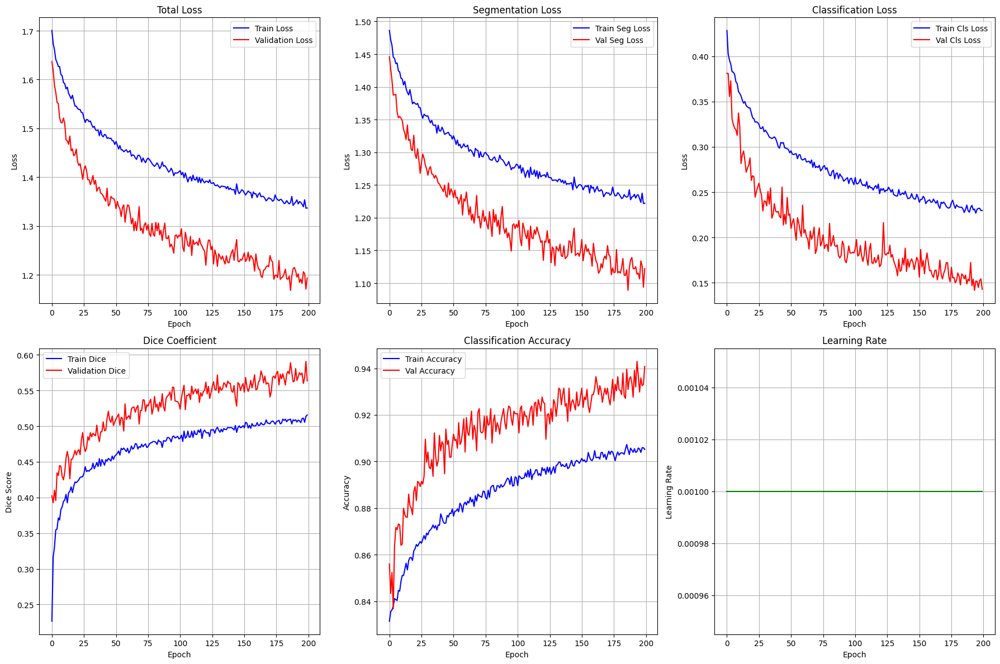


Training completed!
Best validation loss: 1.168176


Validation: 100%|██████████| 73/73 [00:03<00:00, 20.71it/s, Loss=1.3022, Dice=0.6228, Acc=0.8889]

loss: 1.2892121844095727, seg_loss: 1.2003011630006033, cls_loss: 0.1778220511105371, dice: 0.5057577586745563, cls_acc: 0.9277016961411254


In [14]:

    
CONFIG = {
    'working_path': 'train',  
    'batch_size': 16,     
    'export_type': 'NDVI',
    'input_channels': 1,  # 1 for NDVI, 3 for RGB, 4 for RGBN
    'num_classes': 6,
    'filters_base': 16,
    'dropout_rate': 0.2,
    'learning_rate': 0.001,
    'num_epochs': 200,
    'seg_weight': 1.0,
    'cls_weight': 0.5,
    'pos_weight': 2.0,
    'augmentation': True,
    'num_workers': 16
}

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB")

# Create datasets
print("Creating datasets...")
train_dataloader, val_dataloader, test_dataloader = create_pytorch_datasets(
    working_path=CONFIG['working_path'],
    batch_size=CONFIG['batch_size'],
    export_type=CONFIG['export_type'],
    augmentation=CONFIG['augmentation'],
    test_size=0.20,  # 20%
    val_size=0.05    # 5%
)

print(f"Training samples: {len(train_dataloader.dataset)}")
print(f"Validation samples: {len(val_dataloader.dataset)}")
print(f"Training batches: {len(train_dataloader)}")
print(f"Validation batches: {len(val_dataloader)}")

# Create model
print("Creating model...")
model = OptimizedMultiTaskUNet512(
    input_channels=CONFIG['input_channels'],
    num_classes=CONFIG['num_classes'],
    filters_base=CONFIG['filters_base'],
    dropout_rate=CONFIG['dropout_rate']
)

# Create trainer
trainer_ndvi_512 = ModelTrainer(
    model=model,
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    device=device,
    learning_rate=CONFIG['learning_rate'],
    seg_weight=CONFIG['seg_weight'],
    cls_weight=CONFIG['cls_weight'],
    pos_weight=CONFIG['pos_weight'],
    model_name="ndvi_512"
)

history = trainer_ndvi_512.train(CONFIG['num_epochs'])
trainer_ndvi_512.val_dataloader = test_dataloader
test_loss, test_seg_loss, test_cls_loss, test_dice, test_cls_acc = trainer_ndvi_512.validate_epoch()
print(f'loss: {test_loss}, seg_loss: {test_seg_loss}, cls_loss: {test_cls_loss}, dice: {test_dice}, cls_acc: {test_cls_acc}')

## RGB inputs with shape (512, 512, 3)

Using device: cuda
GPU: NVIDIA RTX A5000
GPU Memory: 23.5 GB
Creating datasets...
Split 'train': 4369 samples (Total: 5824, Train: 4369, Val: 291, Test: 1164)
Split 'val': 291 samples (Total: 5824, Train: 4369, Val: 291, Test: 1164)
Split 'test': 1164 samples (Total: 5824, Train: 4369, Val: 291, Test: 1164)
Training samples: 4369
Validation samples: 291
Training batches: 136
Validation batches: 10
Creating model...
Starting training for 200 epochs...
Device: cuda
Model parameters: 2,469,367

Epoch 1/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.25it/s, Loss=1.4545, Dice=0.6045, Acc=0.8889]


New best model! Validation loss: 1.649501
Train Loss: 1.695800 | Val Loss: 1.649501
Train Dice: 0.3586 | Val Dice: 0.3239
Train Acc: 0.8357 | Val Acc: 0.8420
Learning Rate: 0.00100000

Epoch 2/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.05it/s, Loss=1.2759, Dice=0.6893, Acc=0.8889]


New best model! Validation loss: 1.588892
Train Loss: 1.619064 | Val Loss: 1.588892
Train Dice: 0.3723 | Val Dice: 0.3931
Train Acc: 0.8465 | Val Acc: 0.8576
Learning Rate: 0.00100000

Epoch 3/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.02it/s, Loss=1.1222, Dice=0.6746, Acc=0.9444]


New best model! Validation loss: 1.544997
Train Loss: 1.590939 | Val Loss: 1.544997
Train Dice: 0.3858 | Val Dice: 0.4045
Train Acc: 0.8546 | Val Acc: 0.8590
Learning Rate: 0.00100000

Epoch 4/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.99it/s, Loss=1.2438, Dice=0.7939, Acc=0.7778]


Train Loss: 1.571724 | Val Loss: 1.605926
Train Dice: 0.3874 | Val Dice: 0.3503
Train Acc: 0.8577 | Val Acc: 0.8538
Learning Rate: 0.00100000

Epoch 5/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.34it/s, Loss=1.1947, Dice=0.5021, Acc=1.0000]


New best model! Validation loss: 1.503505
Train Loss: 1.567226 | Val Loss: 1.503505
Train Dice: 0.3870 | Val Dice: 0.4264
Train Acc: 0.8599 | Val Acc: 0.8911
Learning Rate: 0.00100000

Epoch 6/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.02it/s, Loss=1.0815, Dice=0.7767, Acc=1.0000]


New best model! Validation loss: 1.497388
Train Loss: 1.544279 | Val Loss: 1.497388
Train Dice: 0.4134 | Val Dice: 0.4746
Train Acc: 0.8640 | Val Acc: 0.8781
Learning Rate: 0.00100000

Epoch 7/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.98it/s, Loss=0.9822, Dice=0.7628, Acc=1.0000]


New best model! Validation loss: 1.456087
Train Loss: 1.544931 | Val Loss: 1.456087
Train Dice: 0.4104 | Val Dice: 0.4328
Train Acc: 0.8669 | Val Acc: 0.8880
Learning Rate: 0.00100000

Epoch 8/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.98it/s, Loss=1.0194, Dice=0.7567, Acc=0.9444]


Train Loss: 1.533273 | Val Loss: 1.486939
Train Dice: 0.4069 | Val Dice: 0.4206
Train Acc: 0.8721 | Val Acc: 0.8793
Learning Rate: 0.00100000

Epoch 9/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.03it/s, Loss=1.2251, Dice=0.4785, Acc=1.0000]


New best model! Validation loss: 1.444764
Train Loss: 1.521309 | Val Loss: 1.444764
Train Dice: 0.4198 | Val Dice: 0.4885
Train Acc: 0.8713 | Val Acc: 0.9146
Learning Rate: 0.00100000

Epoch 10/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.52it/s, Loss=1.0700, Dice=0.7384, Acc=0.9444]


New best model! Validation loss: 1.426845
Train Loss: 1.517117 | Val Loss: 1.426845
Train Dice: 0.4203 | Val Dice: 0.4617
Train Acc: 0.8738 | Val Acc: 0.9064
Learning Rate: 0.00100000
Checkpoint saved at epoch 10

Epoch 11/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.11it/s, Loss=0.9007, Dice=0.7468, Acc=1.0000]


New best model! Validation loss: 1.382126
Train Loss: 1.504734 | Val Loss: 1.382126
Train Dice: 0.4295 | Val Dice: 0.4862
Train Acc: 0.8759 | Val Acc: 0.9135
Learning Rate: 0.00100000

Epoch 12/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.60it/s, Loss=1.1234, Dice=0.5279, Acc=1.0000]


New best model! Validation loss: 1.381730
Train Loss: 1.499253 | Val Loss: 1.381730
Train Dice: 0.4279 | Val Dice: 0.4874
Train Acc: 0.8784 | Val Acc: 0.9146
Learning Rate: 0.00100000

Epoch 13/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.47it/s, Loss=1.0195, Dice=0.7523, Acc=1.0000]


Train Loss: 1.475089 | Val Loss: 1.388493
Train Dice: 0.4412 | Val Dice: 0.4948
Train Acc: 0.8796 | Val Acc: 0.9177
Learning Rate: 0.00100000

Epoch 14/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.07it/s, Loss=1.0206, Dice=0.7176, Acc=1.0000]


New best model! Validation loss: 1.353017
Train Loss: 1.470910 | Val Loss: 1.353017
Train Dice: 0.4451 | Val Dice: 0.4997
Train Acc: 0.8807 | Val Acc: 0.9167
Learning Rate: 0.00100000

Epoch 15/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.47it/s, Loss=0.9911, Dice=0.7769, Acc=1.0000]


New best model! Validation loss: 1.350269
Train Loss: 1.468244 | Val Loss: 1.350269
Train Dice: 0.4491 | Val Dice: 0.4985
Train Acc: 0.8837 | Val Acc: 0.9203
Learning Rate: 0.00100000

Epoch 16/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.37it/s, Loss=0.8483, Dice=0.7782, Acc=1.0000]


New best model! Validation loss: 1.312583
Train Loss: 1.449279 | Val Loss: 1.312583
Train Dice: 0.4586 | Val Dice: 0.5088
Train Acc: 0.8884 | Val Acc: 0.9120
Learning Rate: 0.00100000

Epoch 17/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.43it/s, Loss=0.8695, Dice=0.7213, Acc=1.0000]


Train Loss: 1.445609 | Val Loss: 1.318769
Train Dice: 0.4569 | Val Dice: 0.5163
Train Acc: 0.8907 | Val Acc: 0.9193
Learning Rate: 0.00100000

Epoch 18/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.24it/s, Loss=0.7600, Dice=0.7697, Acc=1.0000]


New best model! Validation loss: 1.303180
Train Loss: 1.439864 | Val Loss: 1.303180
Train Dice: 0.4635 | Val Dice: 0.5572
Train Acc: 0.8886 | Val Acc: 0.9177
Learning Rate: 0.00100000

Epoch 19/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.53it/s, Loss=0.8162, Dice=0.6761, Acc=1.0000]


Train Loss: 1.422983 | Val Loss: 1.322079
Train Dice: 0.4681 | Val Dice: 0.5140
Train Acc: 0.8910 | Val Acc: 0.9188
Learning Rate: 0.00100000

Epoch 20/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.50it/s, Loss=0.9979, Dice=0.6277, Acc=1.0000]


Train Loss: 1.423443 | Val Loss: 1.314539
Train Dice: 0.4752 | Val Dice: 0.5420
Train Acc: 0.8921 | Val Acc: 0.9313
Learning Rate: 0.00100000
Checkpoint saved at epoch 20

Epoch 21/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.22it/s, Loss=0.8966, Dice=0.7562, Acc=1.0000]


New best model! Validation loss: 1.288837
Train Loss: 1.420963 | Val Loss: 1.288837
Train Dice: 0.4729 | Val Dice: 0.5254
Train Acc: 0.8952 | Val Acc: 0.9281
Learning Rate: 0.00100000

Epoch 22/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.61it/s, Loss=0.7286, Dice=0.7662, Acc=1.0000]


Train Loss: 1.412994 | Val Loss: 1.307214
Train Dice: 0.4768 | Val Dice: 0.5200
Train Acc: 0.8951 | Val Acc: 0.9260
Learning Rate: 0.00100000

Epoch 23/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.73it/s, Loss=0.8268, Dice=0.7682, Acc=1.0000]


New best model! Validation loss: 1.243356
Train Loss: 1.397057 | Val Loss: 1.243356
Train Dice: 0.4893 | Val Dice: 0.5658
Train Acc: 0.8975 | Val Acc: 0.9323
Learning Rate: 0.00100000

Epoch 24/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.65it/s, Loss=0.7230, Dice=0.8056, Acc=1.0000]


Train Loss: 1.397449 | Val Loss: 1.269380
Train Dice: 0.4849 | Val Dice: 0.5355
Train Acc: 0.8981 | Val Acc: 0.9198
Learning Rate: 0.00100000

Epoch 25/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.46it/s, Loss=0.6432, Dice=0.7792, Acc=1.0000]


Train Loss: 1.381642 | Val Loss: 1.291509
Train Dice: 0.4916 | Val Dice: 0.5146
Train Acc: 0.8984 | Val Acc: 0.9307
Learning Rate: 0.00100000

Epoch 26/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.56it/s, Loss=0.7182, Dice=0.7718, Acc=1.0000]


New best model! Validation loss: 1.190309
Train Loss: 1.390480 | Val Loss: 1.190309
Train Dice: 0.4858 | Val Dice: 0.6010
Train Acc: 0.9015 | Val Acc: 0.9391
Learning Rate: 0.00100000

Epoch 27/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.30it/s, Loss=0.9501, Dice=0.6310, Acc=1.0000]


Train Loss: 1.386849 | Val Loss: 1.237094
Train Dice: 0.4903 | Val Dice: 0.5669
Train Acc: 0.8992 | Val Acc: 0.9349
Learning Rate: 0.00100000

Epoch 28/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.99it/s, Loss=0.8238, Dice=0.7525, Acc=1.0000]


Train Loss: 1.375462 | Val Loss: 1.222524
Train Dice: 0.4946 | Val Dice: 0.5595
Train Acc: 0.9031 | Val Acc: 0.9391
Learning Rate: 0.00100000

Epoch 29/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.14it/s, Loss=0.6623, Dice=0.7958, Acc=1.0000]


Train Loss: 1.366759 | Val Loss: 1.205408
Train Dice: 0.4969 | Val Dice: 0.5705
Train Acc: 0.9060 | Val Acc: 0.9333
Learning Rate: 0.00100000

Epoch 30/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.22it/s, Loss=0.7338, Dice=0.7111, Acc=1.0000]


Train Loss: 1.353438 | Val Loss: 1.270436
Train Dice: 0.5045 | Val Dice: 0.5478
Train Acc: 0.9069 | Val Acc: 0.9234
Learning Rate: 0.00100000
Checkpoint saved at epoch 30

Epoch 31/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.11it/s, Loss=0.5645, Dice=0.8405, Acc=1.0000]


New best model! Validation loss: 1.183924
Train Loss: 1.357627 | Val Loss: 1.183924
Train Dice: 0.5065 | Val Dice: 0.5970
Train Acc: 0.9052 | Val Acc: 0.9344
Learning Rate: 0.00100000

Epoch 32/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.59it/s, Loss=0.9194, Dice=0.6486, Acc=1.0000]


Train Loss: 1.355592 | Val Loss: 1.206258
Train Dice: 0.5029 | Val Dice: 0.5619
Train Acc: 0.9054 | Val Acc: 0.9375
Learning Rate: 0.00100000

Epoch 33/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.87it/s, Loss=0.5917, Dice=0.8141, Acc=1.0000]


Train Loss: 1.352519 | Val Loss: 1.199103
Train Dice: 0.5058 | Val Dice: 0.5728
Train Acc: 0.9052 | Val Acc: 0.9349
Learning Rate: 0.00100000

Epoch 34/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.74it/s, Loss=0.6390, Dice=0.8201, Acc=1.0000]


New best model! Validation loss: 1.163295
Train Loss: 1.342981 | Val Loss: 1.163295
Train Dice: 0.5112 | Val Dice: 0.5990
Train Acc: 0.9087 | Val Acc: 0.9396
Learning Rate: 0.00100000

Epoch 35/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.84it/s, Loss=0.8054, Dice=0.6833, Acc=1.0000]


Train Loss: 1.333705 | Val Loss: 1.180881
Train Dice: 0.5126 | Val Dice: 0.5795
Train Acc: 0.9110 | Val Acc: 0.9464
Learning Rate: 0.00100000

Epoch 36/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.56it/s, Loss=0.7727, Dice=0.7004, Acc=1.0000]


Train Loss: 1.335209 | Val Loss: 1.206789
Train Dice: 0.5112 | Val Dice: 0.5689
Train Acc: 0.9114 | Val Acc: 0.9313
Learning Rate: 0.00100000

Epoch 37/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.90it/s, Loss=0.7702, Dice=0.7254, Acc=1.0000]


New best model! Validation loss: 1.139945
Train Loss: 1.338561 | Val Loss: 1.139945
Train Dice: 0.5109 | Val Dice: 0.6017
Train Acc: 0.9109 | Val Acc: 0.9438
Learning Rate: 0.00100000

Epoch 38/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.33it/s, Loss=0.6077, Dice=0.7897, Acc=1.0000]


Train Loss: 1.323353 | Val Loss: 1.144580
Train Dice: 0.5187 | Val Dice: 0.5905
Train Acc: 0.9112 | Val Acc: 0.9391
Learning Rate: 0.00100000

Epoch 39/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.44it/s, Loss=0.8494, Dice=0.6348, Acc=1.0000]


Train Loss: 1.321993 | Val Loss: 1.174008
Train Dice: 0.5180 | Val Dice: 0.5726
Train Acc: 0.9138 | Val Acc: 0.9391
Learning Rate: 0.00100000

Epoch 40/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.68it/s, Loss=0.8110, Dice=0.6942, Acc=1.0000]


Train Loss: 1.315735 | Val Loss: 1.167912
Train Dice: 0.5247 | Val Dice: 0.5753
Train Acc: 0.9108 | Val Acc: 0.9443
Learning Rate: 0.00100000
Checkpoint saved at epoch 40

Epoch 41/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.84it/s, Loss=0.5893, Dice=0.8186, Acc=1.0000]


Train Loss: 1.312134 | Val Loss: 1.164473
Train Dice: 0.5233 | Val Dice: 0.5855
Train Acc: 0.9164 | Val Acc: 0.9417
Learning Rate: 0.00100000

Epoch 42/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.99it/s, Loss=0.5824, Dice=0.8644, Acc=1.0000]


Train Loss: 1.308154 | Val Loss: 1.153630
Train Dice: 0.5247 | Val Dice: 0.6043
Train Acc: 0.9148 | Val Acc: 0.9464
Learning Rate: 0.00100000

Epoch 43/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.29it/s, Loss=0.7849, Dice=0.7178, Acc=1.0000]


Train Loss: 1.322085 | Val Loss: 1.181624
Train Dice: 0.5184 | Val Dice: 0.5825
Train Acc: 0.9123 | Val Acc: 0.9417
Learning Rate: 0.00100000

Epoch 44/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.35it/s, Loss=0.7713, Dice=0.7217, Acc=1.0000]


Train Loss: 1.312612 | Val Loss: 1.168695
Train Dice: 0.5237 | Val Dice: 0.5782
Train Acc: 0.9157 | Val Acc: 0.9474
Learning Rate: 0.00100000

Epoch 45/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.52it/s, Loss=0.9013, Dice=0.5893, Acc=1.0000]


Train Loss: 1.303281 | Val Loss: 1.183572
Train Dice: 0.5309 | Val Dice: 0.5614
Train Acc: 0.9151 | Val Acc: 0.9432
Learning Rate: 0.00100000

Epoch 46/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.47it/s, Loss=0.6018, Dice=0.7845, Acc=1.0000]


Train Loss: 1.298656 | Val Loss: 1.145932
Train Dice: 0.5289 | Val Dice: 0.5844
Train Acc: 0.9175 | Val Acc: 0.9375
Learning Rate: 0.00100000

Epoch 47/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.30it/s, Loss=0.5382, Dice=0.8151, Acc=1.0000]


New best model! Validation loss: 1.127786
Train Loss: 1.292669 | Val Loss: 1.127786
Train Dice: 0.5309 | Val Dice: 0.6013
Train Acc: 0.9166 | Val Acc: 0.9438
Learning Rate: 0.00100000

Epoch 48/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.28it/s, Loss=0.5957, Dice=0.8143, Acc=1.0000]


Train Loss: 1.284209 | Val Loss: 1.137154
Train Dice: 0.5338 | Val Dice: 0.5969
Train Acc: 0.9189 | Val Acc: 0.9365
Learning Rate: 0.00100000

Epoch 49/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.45it/s, Loss=0.7836, Dice=0.6525, Acc=1.0000]


Train Loss: 1.292492 | Val Loss: 1.140257
Train Dice: 0.5300 | Val Dice: 0.5910
Train Acc: 0.9183 | Val Acc: 0.9432
Learning Rate: 0.00100000

Epoch 50/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.06it/s, Loss=0.9144, Dice=0.5521, Acc=1.0000]


Train Loss: 1.289892 | Val Loss: 1.159123
Train Dice: 0.5305 | Val Dice: 0.5721
Train Acc: 0.9196 | Val Acc: 0.9406
Learning Rate: 0.00100000
Checkpoint saved at epoch 50

Epoch 51/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.51it/s, Loss=0.6974, Dice=0.7242, Acc=1.0000]


Train Loss: 1.280268 | Val Loss: 1.143349
Train Dice: 0.5355 | Val Dice: 0.5923
Train Acc: 0.9198 | Val Acc: 0.9417
Learning Rate: 0.00100000

Epoch 52/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.74it/s, Loss=0.5581, Dice=0.8604, Acc=1.0000]


New best model! Validation loss: 1.116763
Train Loss: 1.269765 | Val Loss: 1.116763
Train Dice: 0.5399 | Val Dice: 0.6082
Train Acc: 0.9216 | Val Acc: 0.9443
Learning Rate: 0.00100000

Epoch 53/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.73it/s, Loss=0.4817, Dice=0.8153, Acc=1.0000]


Train Loss: 1.275409 | Val Loss: 1.229164
Train Dice: 0.5371 | Val Dice: 0.5530
Train Acc: 0.9207 | Val Acc: 0.9365
Learning Rate: 0.00100000

Epoch 54/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.42it/s, Loss=0.7671, Dice=0.6563, Acc=1.0000]


Train Loss: 1.277251 | Val Loss: 1.141374
Train Dice: 0.5359 | Val Dice: 0.5818
Train Acc: 0.9203 | Val Acc: 0.9484
Learning Rate: 0.00100000

Epoch 55/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.18it/s, Loss=0.6257, Dice=0.7558, Acc=1.0000]


Train Loss: 1.264458 | Val Loss: 1.124434
Train Dice: 0.5438 | Val Dice: 0.6018
Train Acc: 0.9222 | Val Acc: 0.9568
Learning Rate: 0.00100000

Epoch 56/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.08it/s, Loss=0.6546, Dice=0.7370, Acc=1.0000]


New best model! Validation loss: 1.110534
Train Loss: 1.258071 | Val Loss: 1.110534
Train Dice: 0.5422 | Val Dice: 0.5893
Train Acc: 0.9247 | Val Acc: 0.9542
Learning Rate: 0.00100000

Epoch 57/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.25it/s, Loss=0.4517, Dice=0.8887, Acc=1.0000]


New best model! Validation loss: 1.096167
Train Loss: 1.269435 | Val Loss: 1.096167
Train Dice: 0.5442 | Val Dice: 0.6210
Train Acc: 0.9228 | Val Acc: 0.9438
Learning Rate: 0.00100000

Epoch 58/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.12it/s, Loss=0.4660, Dice=0.8612, Acc=1.0000]


Train Loss: 1.261111 | Val Loss: 1.153513
Train Dice: 0.5434 | Val Dice: 0.5876
Train Acc: 0.9246 | Val Acc: 0.9375
Learning Rate: 0.00100000

Epoch 59/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.43it/s, Loss=0.5478, Dice=0.8203, Acc=1.0000]


New best model! Validation loss: 1.085815
Train Loss: 1.253009 | Val Loss: 1.085815
Train Dice: 0.5476 | Val Dice: 0.6219
Train Acc: 0.9246 | Val Acc: 0.9500
Learning Rate: 0.00100000

Epoch 60/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.00it/s, Loss=0.4092, Dice=0.9269, Acc=1.0000]


New best model! Validation loss: 1.085728
Train Loss: 1.252668 | Val Loss: 1.085728
Train Dice: 0.5470 | Val Dice: 0.6290
Train Acc: 0.9234 | Val Acc: 0.9474
Learning Rate: 0.00100000
Checkpoint saved at epoch 60

Epoch 61/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.21it/s, Loss=0.9550, Dice=0.5293, Acc=1.0000]


Train Loss: 1.247324 | Val Loss: 1.159198
Train Dice: 0.5503 | Val Dice: 0.5758
Train Acc: 0.9244 | Val Acc: 0.9432
Learning Rate: 0.00100000

Epoch 62/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.68it/s, Loss=0.8397, Dice=0.5849, Acc=1.0000]


New best model! Validation loss: 1.078667
Train Loss: 1.247966 | Val Loss: 1.078667
Train Dice: 0.5490 | Val Dice: 0.6072
Train Acc: 0.9231 | Val Acc: 0.9578
Learning Rate: 0.00100000

Epoch 63/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.19it/s, Loss=0.4687, Dice=0.8329, Acc=1.0000]


New best model! Validation loss: 1.073009
Train Loss: 1.253582 | Val Loss: 1.073009
Train Dice: 0.5457 | Val Dice: 0.6277
Train Acc: 0.9257 | Val Acc: 0.9552
Learning Rate: 0.00100000

Epoch 64/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.42it/s, Loss=0.6559, Dice=0.7476, Acc=1.0000]


Train Loss: 1.239887 | Val Loss: 1.119579
Train Dice: 0.5498 | Val Dice: 0.5990
Train Acc: 0.9267 | Val Acc: 0.9568
Learning Rate: 0.00100000

Epoch 65/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.91it/s, Loss=0.7634, Dice=0.6660, Acc=1.0000]


Train Loss: 1.241983 | Val Loss: 1.147431
Train Dice: 0.5495 | Val Dice: 0.5858
Train Acc: 0.9257 | Val Acc: 0.9469
Learning Rate: 0.00100000

Epoch 66/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.64it/s, Loss=0.4345, Dice=0.8940, Acc=1.0000]


New best model! Validation loss: 1.065024
Train Loss: 1.232636 | Val Loss: 1.065024
Train Dice: 0.5535 | Val Dice: 0.6307
Train Acc: 0.9278 | Val Acc: 0.9495
Learning Rate: 0.00100000

Epoch 67/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.39it/s, Loss=0.5595, Dice=0.7919, Acc=1.0000]


New best model! Validation loss: 1.047460
Train Loss: 1.233565 | Val Loss: 1.047460
Train Dice: 0.5542 | Val Dice: 0.6291
Train Acc: 0.9295 | Val Acc: 0.9568
Learning Rate: 0.00100000

Epoch 68/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.08it/s, Loss=0.5763, Dice=0.8108, Acc=1.0000]


Train Loss: 1.240494 | Val Loss: 1.073803
Train Dice: 0.5514 | Val Dice: 0.6201
Train Acc: 0.9262 | Val Acc: 0.9547
Learning Rate: 0.00100000

Epoch 69/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.21it/s, Loss=0.6412, Dice=0.7736, Acc=1.0000]


Train Loss: 1.231723 | Val Loss: 1.074627
Train Dice: 0.5544 | Val Dice: 0.6212
Train Acc: 0.9275 | Val Acc: 0.9490
Learning Rate: 0.00100000

Epoch 70/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.24it/s, Loss=0.4626, Dice=0.8842, Acc=1.0000]


Train Loss: 1.224499 | Val Loss: 1.051969
Train Dice: 0.5592 | Val Dice: 0.6340
Train Acc: 0.9280 | Val Acc: 0.9568
Learning Rate: 0.00100000
Checkpoint saved at epoch 70

Epoch 71/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.52it/s, Loss=0.4224, Dice=0.8706, Acc=1.0000]


New best model! Validation loss: 1.029491
Train Loss: 1.237448 | Val Loss: 1.029491
Train Dice: 0.5513 | Val Dice: 0.6456
Train Acc: 0.9274 | Val Acc: 0.9641
Learning Rate: 0.00100000

Epoch 72/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.50it/s, Loss=0.5996, Dice=0.7916, Acc=1.0000]


Train Loss: 1.219651 | Val Loss: 1.053335
Train Dice: 0.5622 | Val Dice: 0.6333
Train Acc: 0.9286 | Val Acc: 0.9625
Learning Rate: 0.00100000

Epoch 73/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.13it/s, Loss=0.5513, Dice=0.8548, Acc=1.0000]


Train Loss: 1.223121 | Val Loss: 1.038631
Train Dice: 0.5557 | Val Dice: 0.6480
Train Acc: 0.9290 | Val Acc: 0.9599
Learning Rate: 0.00100000

Epoch 74/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.26it/s, Loss=0.5220, Dice=0.8637, Acc=1.0000]


Train Loss: 1.226829 | Val Loss: 1.049857
Train Dice: 0.5584 | Val Dice: 0.6395
Train Acc: 0.9295 | Val Acc: 0.9578
Learning Rate: 0.00100000

Epoch 75/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.21it/s, Loss=0.3603, Dice=0.9001, Acc=1.0000]


Train Loss: 1.211978 | Val Loss: 1.046244
Train Dice: 0.5617 | Val Dice: 0.6304
Train Acc: 0.9292 | Val Acc: 0.9599
Learning Rate: 0.00100000

Epoch 76/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.01it/s, Loss=0.5662, Dice=0.8029, Acc=1.0000]


Train Loss: 1.220476 | Val Loss: 1.049631
Train Dice: 0.5579 | Val Dice: 0.6283
Train Acc: 0.9318 | Val Acc: 0.9568
Learning Rate: 0.00100000

Epoch 77/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.40it/s, Loss=0.5305, Dice=0.8235, Acc=1.0000]


New best model! Validation loss: 1.027997
Train Loss: 1.216305 | Val Loss: 1.027997
Train Dice: 0.5624 | Val Dice: 0.6434
Train Acc: 0.9307 | Val Acc: 0.9635
Learning Rate: 0.00100000

Epoch 78/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.34it/s, Loss=0.7555, Dice=0.6384, Acc=1.0000]


Train Loss: 1.200086 | Val Loss: 1.085016
Train Dice: 0.5661 | Val Dice: 0.6063
Train Acc: 0.9323 | Val Acc: 0.9557
Learning Rate: 0.00100000

Epoch 79/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.61it/s, Loss=0.4982, Dice=0.8550, Acc=1.0000]


Train Loss: 1.207802 | Val Loss: 1.036542
Train Dice: 0.5662 | Val Dice: 0.6349
Train Acc: 0.9309 | Val Acc: 0.9641
Learning Rate: 0.00100000

Epoch 80/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.53it/s, Loss=0.6729, Dice=0.6959, Acc=1.0000]


Train Loss: 1.203829 | Val Loss: 1.085633
Train Dice: 0.5677 | Val Dice: 0.6016
Train Acc: 0.9318 | Val Acc: 0.9646
Learning Rate: 0.00100000
Checkpoint saved at epoch 80

Epoch 81/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.06it/s, Loss=0.3785, Dice=0.9196, Acc=1.0000]


Train Loss: 1.204720 | Val Loss: 1.052772
Train Dice: 0.5648 | Val Dice: 0.6327
Train Acc: 0.9329 | Val Acc: 0.9609
Learning Rate: 0.00100000

Epoch 82/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.62it/s, Loss=0.7393, Dice=0.6451, Acc=1.0000]


Train Loss: 1.195214 | Val Loss: 1.064559
Train Dice: 0.5689 | Val Dice: 0.6212
Train Acc: 0.9317 | Val Acc: 0.9568
Learning Rate: 0.00100000

Epoch 83/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.65it/s, Loss=0.9324, Dice=0.5196, Acc=1.0000]


Train Loss: 1.194442 | Val Loss: 1.095084
Train Dice: 0.5720 | Val Dice: 0.5955
Train Acc: 0.9333 | Val Acc: 0.9573
Learning Rate: 0.00100000

Epoch 84/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.41it/s, Loss=0.5546, Dice=0.7997, Acc=1.0000]


Train Loss: 1.202024 | Val Loss: 1.030200
Train Dice: 0.5690 | Val Dice: 0.6356
Train Acc: 0.9329 | Val Acc: 0.9672
Learning Rate: 0.00100000

Epoch 85/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.26it/s, Loss=0.7152, Dice=0.7030, Acc=1.0000]


Train Loss: 1.192796 | Val Loss: 1.039137
Train Dice: 0.5723 | Val Dice: 0.6334
Train Acc: 0.9346 | Val Acc: 0.9646
Learning Rate: 0.00100000

Epoch 86/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.28it/s, Loss=0.7365, Dice=0.6578, Acc=1.0000]


Train Loss: 1.204806 | Val Loss: 1.116347
Train Dice: 0.5634 | Val Dice: 0.5915
Train Acc: 0.9354 | Val Acc: 0.9573
Learning Rate: 0.00100000

Epoch 87/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.66it/s, Loss=0.5404, Dice=0.8244, Acc=1.0000]


New best model! Validation loss: 1.013826
Train Loss: 1.198200 | Val Loss: 1.013826
Train Dice: 0.5652 | Val Dice: 0.6526
Train Acc: 0.9339 | Val Acc: 0.9589
Learning Rate: 0.00100000

Epoch 88/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.18it/s, Loss=0.7568, Dice=0.6371, Acc=1.0000]


Train Loss: 1.182047 | Val Loss: 1.067126
Train Dice: 0.5727 | Val Dice: 0.6115
Train Acc: 0.9372 | Val Acc: 0.9698
Learning Rate: 0.00100000

Epoch 89/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.90it/s, Loss=0.6317, Dice=0.7712, Acc=1.0000]


Train Loss: 1.190844 | Val Loss: 1.049196
Train Dice: 0.5713 | Val Dice: 0.6289
Train Acc: 0.9339 | Val Acc: 0.9651
Learning Rate: 0.00100000

Epoch 90/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.86it/s, Loss=0.3559, Dice=0.9172, Acc=1.0000]


Train Loss: 1.186594 | Val Loss: 1.031603
Train Dice: 0.5728 | Val Dice: 0.6359
Train Acc: 0.9386 | Val Acc: 0.9630
Learning Rate: 0.00100000
Checkpoint saved at epoch 90

Epoch 91/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.40it/s, Loss=0.5544, Dice=0.8334, Acc=1.0000]


Train Loss: 1.182216 | Val Loss: 1.045002
Train Dice: 0.5748 | Val Dice: 0.6208
Train Acc: 0.9378 | Val Acc: 0.9682
Learning Rate: 0.00100000

Epoch 92/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.43it/s, Loss=0.5043, Dice=0.8673, Acc=1.0000]


Train Loss: 1.173436 | Val Loss: 1.014053
Train Dice: 0.5792 | Val Dice: 0.6494
Train Acc: 0.9382 | Val Acc: 0.9641
Learning Rate: 0.00100000

Epoch 93/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.58it/s, Loss=0.3660, Dice=0.9139, Acc=1.0000]


Train Loss: 1.182105 | Val Loss: 1.051555
Train Dice: 0.5724 | Val Dice: 0.6382
Train Acc: 0.9362 | Val Acc: 0.9620
Learning Rate: 0.00100000

Epoch 94/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.09it/s, Loss=0.6553, Dice=0.6929, Acc=1.0000]


Train Loss: 1.177590 | Val Loss: 1.039434
Train Dice: 0.5764 | Val Dice: 0.6318
Train Acc: 0.9355 | Val Acc: 0.9604
Learning Rate: 0.00100000

Epoch 95/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.28it/s, Loss=0.3641, Dice=0.9306, Acc=1.0000]


Train Loss: 1.177481 | Val Loss: 1.020694
Train Dice: 0.5732 | Val Dice: 0.6488
Train Acc: 0.9388 | Val Acc: 0.9594
Learning Rate: 0.00100000

Epoch 96/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.02it/s, Loss=0.4702, Dice=0.8780, Acc=1.0000]


New best model! Validation loss: 1.005413
Train Loss: 1.179482 | Val Loss: 1.005413
Train Dice: 0.5746 | Val Dice: 0.6627
Train Acc: 0.9366 | Val Acc: 0.9635
Learning Rate: 0.00100000

Epoch 97/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.62it/s, Loss=0.5050, Dice=0.8317, Acc=1.0000]


Train Loss: 1.173182 | Val Loss: 1.035212
Train Dice: 0.5795 | Val Dice: 0.6355
Train Acc: 0.9383 | Val Acc: 0.9688
Learning Rate: 0.00100000

Epoch 98/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.05it/s, Loss=0.5394, Dice=0.8379, Acc=1.0000]


Train Loss: 1.169244 | Val Loss: 1.027234
Train Dice: 0.5803 | Val Dice: 0.6401
Train Acc: 0.9386 | Val Acc: 0.9656
Learning Rate: 0.00100000

Epoch 99/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.28it/s, Loss=0.3510, Dice=0.9181, Acc=1.0000]


Train Loss: 1.164772 | Val Loss: 1.020427
Train Dice: 0.5818 | Val Dice: 0.6421
Train Acc: 0.9375 | Val Acc: 0.9677
Learning Rate: 0.00100000

Epoch 100/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.83it/s, Loss=0.5303, Dice=0.7893, Acc=1.0000]


Train Loss: 1.172064 | Val Loss: 1.026798
Train Dice: 0.5744 | Val Dice: 0.6273
Train Acc: 0.9400 | Val Acc: 0.9646
Learning Rate: 0.00100000
Checkpoint saved at epoch 100

Epoch 101/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.40it/s, Loss=0.3760, Dice=0.8949, Acc=1.0000]


New best model! Validation loss: 0.980178
Train Loss: 1.164944 | Val Loss: 0.980178
Train Dice: 0.5800 | Val Dice: 0.6613
Train Acc: 0.9397 | Val Acc: 0.9724
Learning Rate: 0.00100000

Epoch 102/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.62it/s, Loss=0.4549, Dice=0.8876, Acc=1.0000]


Train Loss: 1.163919 | Val Loss: 0.996104
Train Dice: 0.5804 | Val Dice: 0.6610
Train Acc: 0.9397 | Val Acc: 0.9661
Learning Rate: 0.00100000

Epoch 103/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.46it/s, Loss=0.6131, Dice=0.7250, Acc=1.0000]


Train Loss: 1.168697 | Val Loss: 0.986473
Train Dice: 0.5780 | Val Dice: 0.6537
Train Acc: 0.9389 | Val Acc: 0.9693
Learning Rate: 0.00100000

Epoch 104/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.39it/s, Loss=0.5902, Dice=0.7749, Acc=1.0000]


Train Loss: 1.158388 | Val Loss: 1.024901
Train Dice: 0.5829 | Val Dice: 0.6345
Train Acc: 0.9400 | Val Acc: 0.9760
Learning Rate: 0.00100000

Epoch 105/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.25it/s, Loss=0.4689, Dice=0.8906, Acc=1.0000]


Train Loss: 1.165635 | Val Loss: 0.994098
Train Dice: 0.5821 | Val Dice: 0.6591
Train Acc: 0.9373 | Val Acc: 0.9740
Learning Rate: 0.00100000

Epoch 106/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.09it/s, Loss=0.6153, Dice=0.7337, Acc=1.0000]


Train Loss: 1.142658 | Val Loss: 0.982613
Train Dice: 0.5903 | Val Dice: 0.6529
Train Acc: 0.9406 | Val Acc: 0.9750
Learning Rate: 0.00100000

Epoch 107/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.35it/s, Loss=0.8667, Dice=0.5412, Acc=1.0000]


Train Loss: 1.155380 | Val Loss: 1.054689
Train Dice: 0.5846 | Val Dice: 0.6119
Train Acc: 0.9407 | Val Acc: 0.9682
Learning Rate: 0.00100000

Epoch 108/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.23it/s, Loss=0.4792, Dice=0.8912, Acc=1.0000]


Train Loss: 1.161555 | Val Loss: 0.999869
Train Dice: 0.5780 | Val Dice: 0.6585
Train Acc: 0.9375 | Val Acc: 0.9635
Learning Rate: 0.00100000

Epoch 109/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.88it/s, Loss=0.5129, Dice=0.8370, Acc=1.0000]


New best model! Validation loss: 0.975831
Train Loss: 1.157741 | Val Loss: 0.975831
Train Dice: 0.5871 | Val Dice: 0.6629
Train Acc: 0.9417 | Val Acc: 0.9740
Learning Rate: 0.00100000

Epoch 110/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.01it/s, Loss=0.6103, Dice=0.7785, Acc=1.0000]


Train Loss: 1.154456 | Val Loss: 1.006154
Train Dice: 0.5843 | Val Dice: 0.6487
Train Acc: 0.9417 | Val Acc: 0.9766
Learning Rate: 0.00100000
Checkpoint saved at epoch 110

Epoch 111/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.66it/s, Loss=0.5053, Dice=0.7984, Acc=1.0000]


Train Loss: 1.155074 | Val Loss: 0.987229
Train Dice: 0.5844 | Val Dice: 0.6557
Train Acc: 0.9436 | Val Acc: 0.9740
Learning Rate: 0.00100000

Epoch 112/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.29it/s, Loss=0.4578, Dice=0.8874, Acc=1.0000]


Train Loss: 1.155992 | Val Loss: 0.994981
Train Dice: 0.5830 | Val Dice: 0.6593
Train Acc: 0.9410 | Val Acc: 0.9682
Learning Rate: 0.00100000

Epoch 113/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.14it/s, Loss=0.4786, Dice=0.8639, Acc=1.0000]


Train Loss: 1.141988 | Val Loss: 0.988688
Train Dice: 0.5915 | Val Dice: 0.6663
Train Acc: 0.9424 | Val Acc: 0.9714
Learning Rate: 0.00100000

Epoch 114/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.09it/s, Loss=0.5183, Dice=0.8242, Acc=1.0000]


Train Loss: 1.144355 | Val Loss: 0.984105
Train Dice: 0.5842 | Val Dice: 0.6603
Train Acc: 0.9392 | Val Acc: 0.9734
Learning Rate: 0.00100000

Epoch 115/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.23it/s, Loss=0.4480, Dice=0.8652, Acc=1.0000]


New best model! Validation loss: 0.963807
Train Loss: 1.138509 | Val Loss: 0.963807
Train Dice: 0.5912 | Val Dice: 0.6630
Train Acc: 0.9393 | Val Acc: 0.9781
Learning Rate: 0.00100000

Epoch 116/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.07it/s, Loss=0.4871, Dice=0.8526, Acc=1.0000]


New best model! Validation loss: 0.961497
Train Loss: 1.151934 | Val Loss: 0.961497
Train Dice: 0.5870 | Val Dice: 0.6693
Train Acc: 0.9411 | Val Acc: 0.9651
Learning Rate: 0.00100000

Epoch 117/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.22it/s, Loss=0.5307, Dice=0.8479, Acc=1.0000]


Train Loss: 1.144665 | Val Loss: 0.994619
Train Dice: 0.5865 | Val Dice: 0.6467
Train Acc: 0.9423 | Val Acc: 0.9672
Learning Rate: 0.00100000

Epoch 118/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.29it/s, Loss=0.3048, Dice=0.9313, Acc=1.0000]


New best model! Validation loss: 0.948135
Train Loss: 1.139816 | Val Loss: 0.948135
Train Dice: 0.5882 | Val Dice: 0.6783
Train Acc: 0.9437 | Val Acc: 0.9703
Learning Rate: 0.00100000

Epoch 119/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.38it/s, Loss=0.3591, Dice=0.9149, Acc=1.0000]


Train Loss: 1.132616 | Val Loss: 0.955324
Train Dice: 0.5919 | Val Dice: 0.6704
Train Acc: 0.9441 | Val Acc: 0.9698
Learning Rate: 0.00100000

Epoch 120/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.22it/s, Loss=0.3033, Dice=0.9398, Acc=1.0000]


Train Loss: 1.124611 | Val Loss: 0.969593
Train Dice: 0.5955 | Val Dice: 0.6609
Train Acc: 0.9441 | Val Acc: 0.9661
Learning Rate: 0.00100000
Checkpoint saved at epoch 120

Epoch 121/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.10it/s, Loss=0.4612, Dice=0.8782, Acc=1.0000]


Train Loss: 1.136927 | Val Loss: 0.979356
Train Dice: 0.5905 | Val Dice: 0.6676
Train Acc: 0.9419 | Val Acc: 0.9667
Learning Rate: 0.00100000

Epoch 122/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.81it/s, Loss=0.2777, Dice=0.9502, Acc=1.0000]


Train Loss: 1.138874 | Val Loss: 0.979885
Train Dice: 0.5880 | Val Dice: 0.6580
Train Acc: 0.9448 | Val Acc: 0.9708
Learning Rate: 0.00100000

Epoch 123/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.25it/s, Loss=0.4234, Dice=0.9150, Acc=1.0000]


New best model! Validation loss: 0.943881
Train Loss: 1.130421 | Val Loss: 0.943881
Train Dice: 0.5934 | Val Dice: 0.6747
Train Acc: 0.9452 | Val Acc: 0.9797
Learning Rate: 0.00100000

Epoch 124/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.19it/s, Loss=0.3346, Dice=0.9374, Acc=1.0000]


Train Loss: 1.124851 | Val Loss: 0.957568
Train Dice: 0.5954 | Val Dice: 0.6677
Train Acc: 0.9444 | Val Acc: 0.9724
Learning Rate: 0.00100000

Epoch 125/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.13it/s, Loss=0.2877, Dice=0.9474, Acc=1.0000]


Train Loss: 1.131373 | Val Loss: 0.963979
Train Dice: 0.5946 | Val Dice: 0.6719
Train Acc: 0.9445 | Val Acc: 0.9703
Learning Rate: 0.00100000

Epoch 126/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.78it/s, Loss=0.4456, Dice=0.8842, Acc=1.0000]


Train Loss: 1.125720 | Val Loss: 0.966866
Train Dice: 0.5960 | Val Dice: 0.6603
Train Acc: 0.9436 | Val Acc: 0.9740
Learning Rate: 0.00100000

Epoch 127/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.72it/s, Loss=0.4433, Dice=0.8608, Acc=1.0000]


Train Loss: 1.123125 | Val Loss: 1.008653
Train Dice: 0.5993 | Val Dice: 0.6472
Train Acc: 0.9437 | Val Acc: 0.9677
Learning Rate: 0.00100000

Epoch 128/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.10it/s, Loss=0.4346, Dice=0.9018, Acc=1.0000]


Train Loss: 1.133479 | Val Loss: 0.944805
Train Dice: 0.5914 | Val Dice: 0.6750
Train Acc: 0.9460 | Val Acc: 0.9766
Learning Rate: 0.00100000

Epoch 129/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.06it/s, Loss=0.3625, Dice=0.9281, Acc=1.0000]


New best model! Validation loss: 0.933802
Train Loss: 1.127417 | Val Loss: 0.933802
Train Dice: 0.5917 | Val Dice: 0.6887
Train Acc: 0.9467 | Val Acc: 0.9760
Learning Rate: 0.00100000

Epoch 130/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.57it/s, Loss=0.2726, Dice=0.9442, Acc=1.0000]


Train Loss: 1.122974 | Val Loss: 0.949251
Train Dice: 0.5996 | Val Dice: 0.6815
Train Acc: 0.9449 | Val Acc: 0.9781
Learning Rate: 0.00100000
Checkpoint saved at epoch 130

Epoch 131/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.35it/s, Loss=0.2888, Dice=0.9387, Acc=1.0000]


New best model! Validation loss: 0.925212
Train Loss: 1.126575 | Val Loss: 0.925212
Train Dice: 0.5944 | Val Dice: 0.6895
Train Acc: 0.9490 | Val Acc: 0.9776
Learning Rate: 0.00100000

Epoch 132/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.67it/s, Loss=0.2955, Dice=0.9391, Acc=1.0000]


New best model! Validation loss: 0.918288
Train Loss: 1.117344 | Val Loss: 0.918288
Train Dice: 0.5980 | Val Dice: 0.6902
Train Acc: 0.9466 | Val Acc: 0.9776
Learning Rate: 0.00100000

Epoch 133/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.25it/s, Loss=0.3597, Dice=0.9108, Acc=1.0000]


Train Loss: 1.125512 | Val Loss: 0.929366
Train Dice: 0.5965 | Val Dice: 0.6847
Train Acc: 0.9454 | Val Acc: 0.9823
Learning Rate: 0.00100000

Epoch 134/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.47it/s, Loss=0.4284, Dice=0.8516, Acc=1.0000]


Train Loss: 1.117581 | Val Loss: 0.955138
Train Dice: 0.6001 | Val Dice: 0.6581
Train Acc: 0.9441 | Val Acc: 0.9781
Learning Rate: 0.00100000

Epoch 135/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.82it/s, Loss=0.5990, Dice=0.7714, Acc=1.0000]


Train Loss: 1.119298 | Val Loss: 0.953972
Train Dice: 0.5970 | Val Dice: 0.6711
Train Acc: 0.9459 | Val Acc: 0.9766
Learning Rate: 0.00100000

Epoch 136/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.32it/s, Loss=0.4514, Dice=0.8596, Acc=1.0000]


Train Loss: 1.116107 | Val Loss: 0.981483
Train Dice: 0.6013 | Val Dice: 0.6543
Train Acc: 0.9482 | Val Acc: 0.9724
Learning Rate: 0.00100000

Epoch 137/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.41it/s, Loss=0.4418, Dice=0.8508, Acc=1.0000]


New best model! Validation loss: 0.907015
Train Loss: 1.101750 | Val Loss: 0.907015
Train Dice: 0.6075 | Val Dice: 0.6926
Train Acc: 0.9484 | Val Acc: 0.9807
Learning Rate: 0.00100000

Epoch 138/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.76it/s, Loss=0.3946, Dice=0.8420, Acc=1.0000]


Train Loss: 1.115068 | Val Loss: 0.945395
Train Dice: 0.5967 | Val Dice: 0.6698
Train Acc: 0.9462 | Val Acc: 0.9771
Learning Rate: 0.00100000

Epoch 139/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.48it/s, Loss=0.4847, Dice=0.8392, Acc=1.0000]


Train Loss: 1.111388 | Val Loss: 0.943945
Train Dice: 0.5994 | Val Dice: 0.6714
Train Acc: 0.9473 | Val Acc: 0.9745
Learning Rate: 0.00100000

Epoch 140/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.55it/s, Loss=0.3582, Dice=0.8946, Acc=1.0000]


Train Loss: 1.115492 | Val Loss: 0.937666
Train Dice: 0.5948 | Val Dice: 0.6799
Train Acc: 0.9493 | Val Acc: 0.9807
Learning Rate: 0.00100000
Checkpoint saved at epoch 140

Epoch 141/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.50it/s, Loss=0.3903, Dice=0.8866, Acc=1.0000]


Train Loss: 1.105865 | Val Loss: 0.915118
Train Dice: 0.6025 | Val Dice: 0.6876
Train Acc: 0.9500 | Val Acc: 0.9786
Learning Rate: 0.00100000

Epoch 142/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.34it/s, Loss=0.3517, Dice=0.9101, Acc=1.0000]


Train Loss: 1.110508 | Val Loss: 0.907229
Train Dice: 0.6017 | Val Dice: 0.6885
Train Acc: 0.9468 | Val Acc: 0.9771
Learning Rate: 0.00100000

Epoch 143/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.16it/s, Loss=0.7114, Dice=0.6801, Acc=1.0000]


Train Loss: 1.099455 | Val Loss: 0.953710
Train Dice: 0.6046 | Val Dice: 0.6610
Train Acc: 0.9487 | Val Acc: 0.9807
Learning Rate: 0.00100000

Epoch 144/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.45it/s, Loss=0.4724, Dice=0.8026, Acc=1.0000]


Train Loss: 1.106872 | Val Loss: 0.932524
Train Dice: 0.6040 | Val Dice: 0.6717
Train Acc: 0.9452 | Val Acc: 0.9807
Learning Rate: 0.00100000

Epoch 145/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.60it/s, Loss=0.5058, Dice=0.7784, Acc=1.0000]


Train Loss: 1.099841 | Val Loss: 0.931435
Train Dice: 0.6045 | Val Dice: 0.6697
Train Acc: 0.9468 | Val Acc: 0.9745
Learning Rate: 0.00100000

Epoch 146/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.64it/s, Loss=0.3541, Dice=0.9168, Acc=1.0000]


Train Loss: 1.100892 | Val Loss: 0.945403
Train Dice: 0.6050 | Val Dice: 0.6746
Train Acc: 0.9465 | Val Acc: 0.9698
Learning Rate: 0.00100000

Epoch 147/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.59it/s, Loss=0.3440, Dice=0.8940, Acc=1.0000]


Train Loss: 1.104424 | Val Loss: 0.924288
Train Dice: 0.6019 | Val Dice: 0.6823
Train Acc: 0.9486 | Val Acc: 0.9771
Learning Rate: 0.00100000

Epoch 148/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.40it/s, Loss=0.5670, Dice=0.7661, Acc=1.0000]


Train Loss: 1.109137 | Val Loss: 0.940203
Train Dice: 0.6012 | Val Dice: 0.6729
Train Acc: 0.9476 | Val Acc: 0.9781
Learning Rate: 0.00100000

Epoch 149/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.24it/s, Loss=0.4623, Dice=0.8228, Acc=1.0000]


Train Loss: 1.092678 | Val Loss: 0.927037
Train Dice: 0.6081 | Val Dice: 0.6730
Train Acc: 0.9485 | Val Acc: 0.9776
Learning Rate: 0.00100000

Epoch 150/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.63it/s, Loss=0.4468, Dice=0.8373, Acc=1.0000]


Train Loss: 1.099150 | Val Loss: 0.945236
Train Dice: 0.6038 | Val Dice: 0.6692
Train Acc: 0.9524 | Val Acc: 0.9740
Learning Rate: 0.00100000
Checkpoint saved at epoch 150

Epoch 151/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.39it/s, Loss=0.3896, Dice=0.8607, Acc=1.0000]


Train Loss: 1.093514 | Val Loss: 0.917257
Train Dice: 0.6068 | Val Dice: 0.6836
Train Acc: 0.9470 | Val Acc: 0.9807
Learning Rate: 0.00100000

Epoch 152/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.27it/s, Loss=0.4167, Dice=0.8462, Acc=1.0000]


Train Loss: 1.091318 | Val Loss: 0.943852
Train Dice: 0.6090 | Val Dice: 0.6696
Train Acc: 0.9508 | Val Acc: 0.9792
Learning Rate: 0.00100000

Epoch 153/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.66it/s, Loss=0.5374, Dice=0.7969, Acc=1.0000]


Train Loss: 1.100820 | Val Loss: 0.977072
Train Dice: 0.6060 | Val Dice: 0.6521
Train Acc: 0.9491 | Val Acc: 0.9776
Learning Rate: 0.00100000

Epoch 154/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.42it/s, Loss=0.4569, Dice=0.8556, Acc=1.0000]


Train Loss: 1.099734 | Val Loss: 0.942253
Train Dice: 0.6062 | Val Dice: 0.6756
Train Acc: 0.9508 | Val Acc: 0.9818
Learning Rate: 0.00100000

Epoch 155/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.76it/s, Loss=0.4750, Dice=0.8481, Acc=1.0000]


Train Loss: 1.083776 | Val Loss: 0.954036
Train Dice: 0.6109 | Val Dice: 0.6714
Train Acc: 0.9541 | Val Acc: 0.9797
Learning Rate: 0.00100000

Epoch 156/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.90it/s, Loss=0.3231, Dice=0.9252, Acc=1.0000]


Train Loss: 1.095288 | Val Loss: 0.918030
Train Dice: 0.6074 | Val Dice: 0.6920
Train Acc: 0.9502 | Val Acc: 0.9833
Learning Rate: 0.00100000

Epoch 157/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.45it/s, Loss=0.3019, Dice=0.9265, Acc=1.0000]


Train Loss: 1.095972 | Val Loss: 0.932934
Train Dice: 0.6065 | Val Dice: 0.6794
Train Acc: 0.9515 | Val Acc: 0.9714
Learning Rate: 0.00100000

Epoch 158/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.35it/s, Loss=0.4289, Dice=0.8884, Acc=1.0000]


Train Loss: 1.092514 | Val Loss: 0.933733
Train Dice: 0.6065 | Val Dice: 0.6856
Train Acc: 0.9506 | Val Acc: 0.9802
Learning Rate: 0.00100000

Epoch 159/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.68it/s, Loss=0.3394, Dice=0.9348, Acc=1.0000]


New best model! Validation loss: 0.897193
Train Loss: 1.088791 | Val Loss: 0.897193
Train Dice: 0.6070 | Val Dice: 0.6993
Train Acc: 0.9503 | Val Acc: 0.9802
Learning Rate: 0.00100000

Epoch 160/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.09it/s, Loss=0.3795, Dice=0.9105, Acc=1.0000]


New best model! Validation loss: 0.893119
Train Loss: 1.092014 | Val Loss: 0.893119
Train Dice: 0.6080 | Val Dice: 0.6999
Train Acc: 0.9494 | Val Acc: 0.9792
Learning Rate: 0.00100000
Checkpoint saved at epoch 160

Epoch 161/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.66it/s, Loss=0.4557, Dice=0.8568, Acc=1.0000]


Train Loss: 1.081443 | Val Loss: 0.919069
Train Dice: 0.6138 | Val Dice: 0.6898
Train Acc: 0.9544 | Val Acc: 0.9750
Learning Rate: 0.00100000

Epoch 162/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.96it/s, Loss=0.2885, Dice=0.9422, Acc=1.0000]


Train Loss: 1.085791 | Val Loss: 0.926281
Train Dice: 0.6095 | Val Dice: 0.6871
Train Acc: 0.9488 | Val Acc: 0.9755
Learning Rate: 0.00100000

Epoch 163/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.33it/s, Loss=0.2335, Dice=0.9552, Acc=1.0000]


Train Loss: 1.088829 | Val Loss: 0.902025
Train Dice: 0.6094 | Val Dice: 0.6978
Train Acc: 0.9510 | Val Acc: 0.9745
Learning Rate: 0.00100000

Epoch 164/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.87it/s, Loss=0.3560, Dice=0.8916, Acc=1.0000]


Train Loss: 1.097648 | Val Loss: 0.900832
Train Dice: 0.6057 | Val Dice: 0.6937
Train Acc: 0.9506 | Val Acc: 0.9828
Learning Rate: 0.00100000

Epoch 165/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.21it/s, Loss=0.2229, Dice=0.9576, Acc=1.0000]


New best model! Validation loss: 0.879899
Train Loss: 1.081124 | Val Loss: 0.879899
Train Dice: 0.6106 | Val Dice: 0.7031
Train Acc: 0.9544 | Val Acc: 0.9807
Learning Rate: 0.00100000

Epoch 166/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.01it/s, Loss=0.3546, Dice=0.9213, Acc=1.0000]


Train Loss: 1.076217 | Val Loss: 0.943387
Train Dice: 0.6137 | Val Dice: 0.6716
Train Acc: 0.9540 | Val Acc: 0.9755
Learning Rate: 0.00100000

Epoch 167/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.49it/s, Loss=0.3472, Dice=0.9033, Acc=1.0000]


Train Loss: 1.083261 | Val Loss: 0.898830
Train Dice: 0.6109 | Val Dice: 0.6884
Train Acc: 0.9498 | Val Acc: 0.9849
Learning Rate: 0.00100000

Epoch 168/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.84it/s, Loss=0.2654, Dice=0.9511, Acc=1.0000]


Train Loss: 1.075014 | Val Loss: 0.890408
Train Dice: 0.6159 | Val Dice: 0.6989
Train Acc: 0.9516 | Val Acc: 0.9849
Learning Rate: 0.00100000

Epoch 169/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.50it/s, Loss=0.2357, Dice=0.9505, Acc=1.0000]


Train Loss: 1.076757 | Val Loss: 0.881281
Train Dice: 0.6123 | Val Dice: 0.6997
Train Acc: 0.9479 | Val Acc: 0.9776
Learning Rate: 0.00100000

Epoch 170/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.55it/s, Loss=0.4695, Dice=0.8465, Acc=1.0000]


Train Loss: 1.081177 | Val Loss: 0.898092
Train Dice: 0.6117 | Val Dice: 0.6917
Train Acc: 0.9523 | Val Acc: 0.9823
Learning Rate: 0.00100000
Checkpoint saved at epoch 170

Epoch 171/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.53it/s, Loss=0.3530, Dice=0.9417, Acc=1.0000]


Train Loss: 1.079941 | Val Loss: 0.894791
Train Dice: 0.6110 | Val Dice: 0.6982
Train Acc: 0.9536 | Val Acc: 0.9818
Learning Rate: 0.00100000

Epoch 172/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.91it/s, Loss=0.2860, Dice=0.9438, Acc=1.0000]


Train Loss: 1.080601 | Val Loss: 0.919233
Train Dice: 0.6136 | Val Dice: 0.6860
Train Acc: 0.9497 | Val Acc: 0.9792
Learning Rate: 0.00100000

Epoch 173/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.20it/s, Loss=0.2416, Dice=0.9577, Acc=1.0000]


Train Loss: 1.073791 | Val Loss: 0.883094
Train Dice: 0.6135 | Val Dice: 0.7052
Train Acc: 0.9542 | Val Acc: 0.9797
Learning Rate: 0.00100000

Epoch 174/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.36it/s, Loss=0.2548, Dice=0.9518, Acc=1.0000]


New best model! Validation loss: 0.877349
Train Loss: 1.072680 | Val Loss: 0.877349
Train Dice: 0.6149 | Val Dice: 0.7008
Train Acc: 0.9518 | Val Acc: 0.9865
Learning Rate: 0.00100000

Epoch 175/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.47it/s, Loss=0.2262, Dice=0.9574, Acc=1.0000]


New best model! Validation loss: 0.872835
Train Loss: 1.063531 | Val Loss: 0.872835
Train Dice: 0.6181 | Val Dice: 0.7014
Train Acc: 0.9533 | Val Acc: 0.9859
Learning Rate: 0.00100000

Epoch 176/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.26it/s, Loss=0.3497, Dice=0.8943, Acc=1.0000]


Train Loss: 1.070724 | Val Loss: 0.902405
Train Dice: 0.6163 | Val Dice: 0.6893
Train Acc: 0.9552 | Val Acc: 0.9755
Learning Rate: 0.00100000

Epoch 177/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.37it/s, Loss=0.5283, Dice=0.7774, Acc=1.0000]


Train Loss: 1.047045 | Val Loss: 0.926921
Train Dice: 0.6246 | Val Dice: 0.6749
Train Acc: 0.9539 | Val Acc: 0.9818
Learning Rate: 0.00100000

Epoch 178/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.69it/s, Loss=0.4641, Dice=0.8111, Acc=1.0000]


Train Loss: 1.063131 | Val Loss: 0.936703
Train Dice: 0.6178 | Val Dice: 0.6686
Train Acc: 0.9560 | Val Acc: 0.9807
Learning Rate: 0.00100000

Epoch 179/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.65it/s, Loss=0.3532, Dice=0.9172, Acc=1.0000]


Train Loss: 1.074582 | Val Loss: 0.887447
Train Dice: 0.6153 | Val Dice: 0.6958
Train Acc: 0.9535 | Val Acc: 0.9823
Learning Rate: 0.00100000

Epoch 180/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.74it/s, Loss=0.6240, Dice=0.7779, Acc=1.0000]


Train Loss: 1.068165 | Val Loss: 0.963531
Train Dice: 0.6152 | Val Dice: 0.6647
Train Acc: 0.9557 | Val Acc: 0.9776
Learning Rate: 0.00100000
Checkpoint saved at epoch 180

Epoch 181/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.76it/s, Loss=0.4972, Dice=0.8010, Acc=1.0000]


Train Loss: 1.053721 | Val Loss: 0.949112
Train Dice: 0.6237 | Val Dice: 0.6673
Train Acc: 0.9525 | Val Acc: 0.9729
Learning Rate: 0.00100000

Epoch 182/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.80it/s, Loss=0.2956, Dice=0.9491, Acc=1.0000]


New best model! Validation loss: 0.865136
Train Loss: 1.075829 | Val Loss: 0.865136
Train Dice: 0.6140 | Val Dice: 0.7127
Train Acc: 0.9532 | Val Acc: 0.9818
Learning Rate: 0.00100000

Epoch 183/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.41it/s, Loss=0.3451, Dice=0.9169, Acc=1.0000]


Train Loss: 1.049944 | Val Loss: 0.887478
Train Dice: 0.6241 | Val Dice: 0.6975
Train Acc: 0.9526 | Val Acc: 0.9844
Learning Rate: 0.00100000

Epoch 184/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.87it/s, Loss=0.4580, Dice=0.8666, Acc=1.0000]


Train Loss: 1.054905 | Val Loss: 0.906728
Train Dice: 0.6257 | Val Dice: 0.6921
Train Acc: 0.9561 | Val Acc: 0.9760
Learning Rate: 0.00100000

Epoch 185/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.33it/s, Loss=0.3026, Dice=0.9427, Acc=1.0000]


Train Loss: 1.051633 | Val Loss: 0.878346
Train Dice: 0.6243 | Val Dice: 0.7007
Train Acc: 0.9547 | Val Acc: 0.9797
Learning Rate: 0.00100000

Epoch 186/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.38it/s, Loss=0.2923, Dice=0.9500, Acc=1.0000]


Train Loss: 1.053489 | Val Loss: 0.878904
Train Dice: 0.6217 | Val Dice: 0.7016
Train Acc: 0.9569 | Val Acc: 0.9807
Learning Rate: 0.00100000

Epoch 187/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.34it/s, Loss=0.3965, Dice=0.8879, Acc=1.0000]


Train Loss: 1.046018 | Val Loss: 0.870165
Train Dice: 0.6247 | Val Dice: 0.7043
Train Acc: 0.9571 | Val Acc: 0.9813
Learning Rate: 0.00100000

Epoch 188/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.61it/s, Loss=0.4253, Dice=0.8772, Acc=1.0000]


Train Loss: 1.050712 | Val Loss: 0.889225
Train Dice: 0.6217 | Val Dice: 0.6940
Train Acc: 0.9565 | Val Acc: 0.9828
Learning Rate: 0.00100000

Epoch 189/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.13it/s, Loss=0.3082, Dice=0.9271, Acc=1.0000]


Train Loss: 1.060949 | Val Loss: 0.867533
Train Dice: 0.6201 | Val Dice: 0.7068
Train Acc: 0.9554 | Val Acc: 0.9818
Learning Rate: 0.00100000

Epoch 190/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.23it/s, Loss=0.4125, Dice=0.8944, Acc=1.0000]


Train Loss: 1.061778 | Val Loss: 0.900038
Train Dice: 0.6186 | Val Dice: 0.6955
Train Acc: 0.9547 | Val Acc: 0.9828
Learning Rate: 0.00100000
Checkpoint saved at epoch 190

Epoch 191/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.52it/s, Loss=0.3381, Dice=0.9367, Acc=1.0000]


Train Loss: 1.050689 | Val Loss: 0.890924
Train Dice: 0.6221 | Val Dice: 0.6977
Train Acc: 0.9568 | Val Acc: 0.9828
Learning Rate: 0.00100000

Epoch 192/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.26it/s, Loss=0.4264, Dice=0.8910, Acc=1.0000]


Train Loss: 1.037049 | Val Loss: 0.874539
Train Dice: 0.6281 | Val Dice: 0.7038
Train Acc: 0.9586 | Val Acc: 0.9854
Learning Rate: 0.00100000

Epoch 193/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  5.48it/s, Loss=0.5180, Dice=0.8345, Acc=1.0000]


Train Loss: 1.043027 | Val Loss: 0.905605
Train Dice: 0.6246 | Val Dice: 0.6855
Train Acc: 0.9584 | Val Acc: 0.9854
Learning Rate: 0.00100000

Epoch 194/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.08it/s, Loss=0.2775, Dice=0.9443, Acc=1.0000]


New best model! Validation loss: 0.847446
Train Loss: 1.046654 | Val Loss: 0.847446
Train Dice: 0.6239 | Val Dice: 0.7155
Train Acc: 0.9583 | Val Acc: 0.9849
Learning Rate: 0.00100000

Epoch 195/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.55it/s, Loss=0.3506, Dice=0.9031, Acc=1.0000]


Train Loss: 1.045880 | Val Loss: 0.899078
Train Dice: 0.6233 | Val Dice: 0.6916
Train Acc: 0.9557 | Val Acc: 0.9839
Learning Rate: 0.00100000

Epoch 196/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.10it/s, Loss=0.2934, Dice=0.9451, Acc=1.0000]


Train Loss: 1.047676 | Val Loss: 0.869681
Train Dice: 0.6241 | Val Dice: 0.7081
Train Acc: 0.9581 | Val Acc: 0.9844
Learning Rate: 0.00100000

Epoch 197/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  7.20it/s, Loss=0.2045, Dice=0.9578, Acc=1.0000]


New best model! Validation loss: 0.836528
Train Loss: 1.039889 | Val Loss: 0.836528
Train Dice: 0.6285 | Val Dice: 0.7133
Train Acc: 0.9575 | Val Acc: 0.9875
Learning Rate: 0.00100000

Epoch 198/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.84it/s, Loss=0.3933, Dice=0.8948, Acc=1.0000]


Train Loss: 1.041873 | Val Loss: 0.892951
Train Dice: 0.6256 | Val Dice: 0.6965
Train Acc: 0.9581 | Val Acc: 0.9786
Learning Rate: 0.00100000

Epoch 199/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.15it/s, Loss=0.4217, Dice=0.8899, Acc=1.0000]


Train Loss: 1.043941 | Val Loss: 0.887271
Train Dice: 0.6284 | Val Dice: 0.6893
Train Acc: 0.9573 | Val Acc: 0.9823
Learning Rate: 0.00100000

Epoch 200/200
--------------------------------------------------


Validation: 100%|██████████| 10/10 [00:01<00:00,  6.30it/s, Loss=0.3855, Dice=0.9143, Acc=1.0000]


Train Loss: 1.042359 | Val Loss: 0.856721
Train Dice: 0.6271 | Val Dice: 0.7108
Train Acc: 0.9598 | Val Acc: 0.9839
Learning Rate: 0.00100000
Checkpoint saved at epoch 200


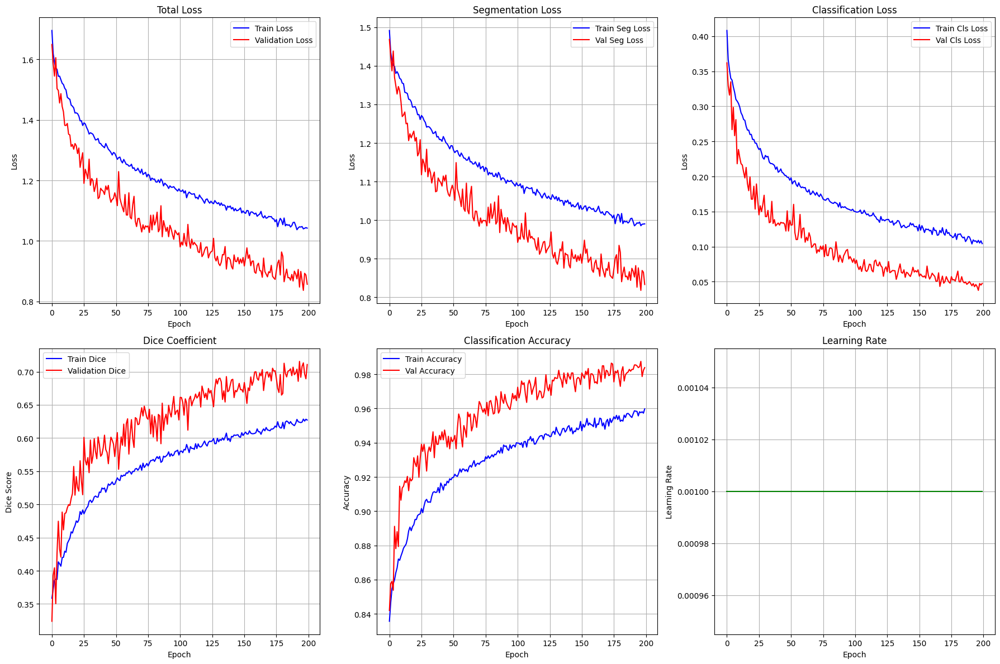


Training completed!
Best validation loss: 0.836528


Validation: 100%|██████████| 37/37 [00:03<00:00, 10.05it/s, Loss=1.1588, Dice=0.5658, Acc=0.9722]

loss: 0.9864447745116981, seg_loss: 0.950670380850096, cls_loss: 0.07154880013518236, dice: 0.6327752374313973, cls_acc: 0.9744744896888733


In [15]:
CONFIG = {
    'working_path': 'train',  
    'batch_size': 32,     
    'export_type': 'RGB',
    'input_channels': 3,  # 1 for NDVI, 3 for RGB, 4 for RGBN
    'num_classes': 6,
    'filters_base': 16,
    'dropout_rate': 0.1,
    'learning_rate': 0.001,
    'num_epochs': 200,
    'seg_weight': 1.0,
    'cls_weight': 0.5,
    'pos_weight': 2.0,
    'augmentation': True,
    'num_workers': 16
}

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(1)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(1).total_memory / 1024**3:.1f} GB")

# Create datasets
print("Creating datasets...")
train_dataloader, val_dataloader, test_dataloader = create_pytorch_datasets(
    working_path=CONFIG['working_path'],
    batch_size=CONFIG['batch_size'],
    export_type=CONFIG['export_type'],
    augmentation=CONFIG['augmentation'],
    test_size=0.20,  # 20%
    val_size=0.05    # 5%
)

print(f"Training samples: {len(train_dataloader.dataset)}")
print(f"Validation samples: {len(val_dataloader.dataset)}")
print(f"Training batches: {len(train_dataloader)}")
print(f"Validation batches: {len(val_dataloader)}")

# Create model
print("Creating model...")
model_rgb = OptimizedMultiTaskUNet512(
    input_channels=CONFIG['input_channels'],
    num_classes=CONFIG['num_classes'],
    filters_base=CONFIG['filters_base'],
    dropout_rate=CONFIG['dropout_rate']
)

num_gpus = torch.cuda.device_count()
# if num_gpus > 1:
#     print(f"Wrapping model with DataParallel across {num_gpus} GPUs.")
#     model_rgb = nn.DataParallel(model_rgb)



# model_rgb.to(device)
# Create trainer

trainer_rgb = ModelTrainer(
    model=model_rgb,
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    device=device,
    learning_rate=CONFIG['learning_rate'],
    seg_weight=CONFIG['seg_weight'],
    cls_weight=CONFIG['cls_weight'],
    pos_weight=CONFIG['pos_weight'],
    model_name="rgb_512"
)

history = trainer_rgb.train(CONFIG['num_epochs'])
trainer_rgb.val_dataloader = test_dataloader
test_loss, test_seg_loss, test_cls_loss, test_dice, test_cls_acc = trainer_rgb.validate_epoch()
print(f'loss: {test_loss}, seg_loss: {test_seg_loss}, cls_loss: {test_cls_loss}, dice: {test_dice}, cls_acc: {test_cls_acc}')

## RGBN inputs with shape (512, 512, 4)

Using device: cuda
GPU: NVIDIA RTX A5000
GPU Memory: 23.5 GB
Creating datasets...
Split 'train': 4369 samples (Total: 5824, Train: 4369, Val: 291, Test: 1164)
Split 'val': 291 samples (Total: 5824, Train: 4369, Val: 291, Test: 1164)
Split 'test': 1164 samples (Total: 5824, Train: 4369, Val: 291, Test: 1164)
Training samples: 4369
Validation samples: 291
Training batches: 273
Validation batches: 19
Creating model...
Starting training for 200 epochs...
Device: cuda
Model parameters: 9,565,831

Epoch 1/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.61it/s, Loss=1.1870, Dice=0.5232, Acc=0.8889]


New best model! Validation loss: 1.571945
Train Loss: 1.653180 | Val Loss: 1.571945
Train Dice: 0.3443 | Val Dice: 0.4095
Train Acc: 0.8378 | Val Acc: 0.8642
Learning Rate: 0.00100000

Epoch 2/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.94it/s, Loss=1.0953, Dice=0.8631, Acc=0.8889]


New best model! Validation loss: 1.528921
Train Loss: 1.583544 | Val Loss: 1.528921
Train Dice: 0.3829 | Val Dice: 0.4076
Train Acc: 0.8508 | Val Acc: 0.8708
Learning Rate: 0.00100000

Epoch 3/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.67it/s, Loss=0.8556, Dice=0.8496, Acc=1.0000]


Train Loss: 1.561892 | Val Loss: 1.548942
Train Dice: 0.3962 | Val Dice: 0.3368
Train Acc: 0.8574 | Val Acc: 0.8788
Learning Rate: 0.00100000

Epoch 4/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.65it/s, Loss=1.0073, Dice=0.6461, Acc=1.0000]


New best model! Validation loss: 1.521633
Train Loss: 1.539540 | Val Loss: 1.521633
Train Dice: 0.4139 | Val Dice: 0.4378
Train Acc: 0.8601 | Val Acc: 0.8904
Learning Rate: 0.00100000

Epoch 5/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.62it/s, Loss=0.9193, Dice=0.7015, Acc=1.0000]


New best model! Validation loss: 1.468616
Train Loss: 1.525536 | Val Loss: 1.468616
Train Dice: 0.4229 | Val Dice: 0.4358
Train Acc: 0.8646 | Val Acc: 0.9052
Learning Rate: 0.00100000

Epoch 6/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.75it/s, Loss=0.7952, Dice=0.8513, Acc=0.8889]


Train Loss: 1.514245 | Val Loss: 1.512634
Train Dice: 0.4254 | Val Dice: 0.3986
Train Acc: 0.8668 | Val Acc: 0.8911
Learning Rate: 0.00100000

Epoch 7/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:02<00:00,  9.46it/s, Loss=0.9524, Dice=0.8185, Acc=0.8889]


New best model! Validation loss: 1.414335
Train Loss: 1.500767 | Val Loss: 1.414335
Train Dice: 0.4386 | Val Dice: 0.4859
Train Acc: 0.8702 | Val Acc: 0.9015
Learning Rate: 0.00100000

Epoch 8/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.66it/s, Loss=0.7450, Dice=0.8652, Acc=1.0000]


New best model! Validation loss: 1.384434
Train Loss: 1.469823 | Val Loss: 1.384434
Train Dice: 0.4573 | Val Dice: 0.5185
Train Acc: 0.8757 | Val Acc: 0.9150
Learning Rate: 0.00100000

Epoch 9/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:02<00:00,  9.50it/s, Loss=0.8451, Dice=0.8878, Acc=1.0000]


Train Loss: 1.468362 | Val Loss: 1.413570
Train Dice: 0.4533 | Val Dice: 0.4826
Train Acc: 0.8795 | Val Acc: 0.9161
Learning Rate: 0.00100000

Epoch 10/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.12it/s, Loss=0.8777, Dice=0.8074, Acc=1.0000]


Train Loss: 1.455757 | Val Loss: 1.411259
Train Dice: 0.4634 | Val Dice: 0.4767
Train Acc: 0.8805 | Val Acc: 0.9156
Learning Rate: 0.00100000
Checkpoint saved at epoch 10

Epoch 11/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.77it/s, Loss=0.5812, Dice=0.8793, Acc=1.0000]


Train Loss: 1.436737 | Val Loss: 1.398692
Train Dice: 0.4681 | Val Dice: 0.4668
Train Acc: 0.8853 | Val Acc: 0.9084
Learning Rate: 0.00100000

Epoch 12/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.71it/s, Loss=0.8713, Dice=0.6888, Acc=1.0000]


Train Loss: 1.421653 | Val Loss: 1.392195
Train Dice: 0.4776 | Val Dice: 0.4703
Train Acc: 0.8857 | Val Acc: 0.9172
Learning Rate: 0.00100000

Epoch 13/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.33it/s, Loss=0.6587, Dice=0.8649, Acc=1.0000]


New best model! Validation loss: 1.324709
Train Loss: 1.423873 | Val Loss: 1.324709
Train Dice: 0.4752 | Val Dice: 0.5216
Train Acc: 0.8876 | Val Acc: 0.9200
Learning Rate: 0.00100000

Epoch 14/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.40it/s, Loss=0.4960, Dice=0.9288, Acc=1.0000]


Train Loss: 1.405007 | Val Loss: 1.330141
Train Dice: 0.4831 | Val Dice: 0.4989
Train Acc: 0.8921 | Val Acc: 0.9167
Learning Rate: 0.00100000

Epoch 15/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.82it/s, Loss=0.6421, Dice=0.8671, Acc=1.0000]


New best model! Validation loss: 1.307088
Train Loss: 1.397607 | Val Loss: 1.307088
Train Dice: 0.4882 | Val Dice: 0.5235
Train Acc: 0.8928 | Val Acc: 0.9194
Learning Rate: 0.00100000

Epoch 16/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.87it/s, Loss=0.5923, Dice=0.8258, Acc=1.0000]


Train Loss: 1.391073 | Val Loss: 1.435859
Train Dice: 0.4894 | Val Dice: 0.4679
Train Acc: 0.8945 | Val Acc: 0.9117
Learning Rate: 0.00100000

Epoch 17/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.23it/s, Loss=0.6887, Dice=0.8169, Acc=1.0000]


New best model! Validation loss: 1.293232
Train Loss: 1.378522 | Val Loss: 1.293232
Train Dice: 0.4973 | Val Dice: 0.5229
Train Acc: 0.8985 | Val Acc: 0.9227
Learning Rate: 0.00100000

Epoch 18/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.75it/s, Loss=0.4827, Dice=0.9225, Acc=1.0000]


Train Loss: 1.367776 | Val Loss: 1.374524
Train Dice: 0.5020 | Val Dice: 0.4835
Train Acc: 0.8968 | Val Acc: 0.9128
Learning Rate: 0.00100000

Epoch 19/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.83it/s, Loss=0.4577, Dice=0.9155, Acc=1.0000]


New best model! Validation loss: 1.260885
Train Loss: 1.362243 | Val Loss: 1.260885
Train Dice: 0.5041 | Val Dice: 0.5383
Train Acc: 0.8998 | Val Acc: 0.9304
Learning Rate: 0.00100000

Epoch 20/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.83it/s, Loss=0.5538, Dice=0.8230, Acc=1.0000]


Train Loss: 1.352568 | Val Loss: 1.264050
Train Dice: 0.5099 | Val Dice: 0.5328
Train Acc: 0.9000 | Val Acc: 0.9304
Learning Rate: 0.00100000
Checkpoint saved at epoch 20

Epoch 21/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.84it/s, Loss=0.3767, Dice=0.8642, Acc=1.0000]


Train Loss: 1.349221 | Val Loss: 1.376223
Train Dice: 0.5059 | Val Dice: 0.4764
Train Acc: 0.9022 | Val Acc: 0.9260
Learning Rate: 0.00100000

Epoch 22/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.74it/s, Loss=0.3328, Dice=0.9158, Acc=1.0000]


New best model! Validation loss: 1.242728
Train Loss: 1.334047 | Val Loss: 1.242728
Train Dice: 0.5153 | Val Dice: 0.5393
Train Acc: 0.9043 | Val Acc: 0.9353
Learning Rate: 0.00100000

Epoch 23/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.54it/s, Loss=0.3689, Dice=0.9241, Acc=1.0000]


New best model! Validation loss: 1.240187
Train Loss: 1.327876 | Val Loss: 1.240187
Train Dice: 0.5147 | Val Dice: 0.5719
Train Acc: 0.9085 | Val Acc: 0.9364
Learning Rate: 0.00100000

Epoch 24/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.63it/s, Loss=0.3463, Dice=0.9238, Acc=1.0000]


New best model! Validation loss: 1.204835
Train Loss: 1.344645 | Val Loss: 1.204835
Train Dice: 0.5086 | Val Dice: 0.5619
Train Acc: 0.9042 | Val Acc: 0.9359
Learning Rate: 0.00100000

Epoch 25/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.08it/s, Loss=0.3644, Dice=0.9296, Acc=1.0000]


Train Loss: 1.311211 | Val Loss: 1.214488
Train Dice: 0.5264 | Val Dice: 0.5684
Train Acc: 0.9045 | Val Acc: 0.9348
Learning Rate: 0.00100000

Epoch 26/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.82it/s, Loss=0.4756, Dice=0.8986, Acc=1.0000]


Train Loss: 1.317517 | Val Loss: 1.249144
Train Dice: 0.5220 | Val Dice: 0.5505
Train Acc: 0.9091 | Val Acc: 0.9391
Learning Rate: 0.00100000

Epoch 27/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.01it/s, Loss=0.2261, Dice=0.9407, Acc=1.0000]


Train Loss: 1.302298 | Val Loss: 1.207894
Train Dice: 0.5295 | Val Dice: 0.5594
Train Acc: 0.9103 | Val Acc: 0.9424
Learning Rate: 0.00100000

Epoch 28/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.89it/s, Loss=0.3391, Dice=0.9365, Acc=1.0000]


New best model! Validation loss: 1.167401
Train Loss: 1.299699 | Val Loss: 1.167401
Train Dice: 0.5286 | Val Dice: 0.5837
Train Acc: 0.9102 | Val Acc: 0.9435
Learning Rate: 0.00100000

Epoch 29/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.76it/s, Loss=0.3324, Dice=0.9353, Acc=1.0000]


New best model! Validation loss: 1.143095
Train Loss: 1.291735 | Val Loss: 1.143095
Train Dice: 0.5313 | Val Dice: 0.5974
Train Acc: 0.9127 | Val Acc: 0.9463
Learning Rate: 0.00100000

Epoch 30/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.78it/s, Loss=0.3884, Dice=0.9292, Acc=1.0000]


Train Loss: 1.290173 | Val Loss: 1.189354
Train Dice: 0.5337 | Val Dice: 0.5714
Train Acc: 0.9122 | Val Acc: 0.9468
Learning Rate: 0.00100000
Checkpoint saved at epoch 30

Epoch 31/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.00it/s, Loss=0.2430, Dice=0.9373, Acc=1.0000]


Train Loss: 1.289482 | Val Loss: 1.165438
Train Dice: 0.5296 | Val Dice: 0.5941
Train Acc: 0.9132 | Val Acc: 0.9441
Learning Rate: 0.00100000

Epoch 32/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.34it/s, Loss=0.2734, Dice=0.9413, Acc=1.0000]


Train Loss: 1.281611 | Val Loss: 1.192452
Train Dice: 0.5383 | Val Dice: 0.5725
Train Acc: 0.9131 | Val Acc: 0.9402
Learning Rate: 0.00100000

Epoch 33/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.41it/s, Loss=0.3650, Dice=0.9374, Acc=1.0000]


Train Loss: 1.270693 | Val Loss: 1.206287
Train Dice: 0.5436 | Val Dice: 0.5813
Train Acc: 0.9172 | Val Acc: 0.9485
Learning Rate: 0.00100000

Epoch 34/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.81it/s, Loss=0.2857, Dice=0.9535, Acc=1.0000]


Train Loss: 1.256378 | Val Loss: 1.177556
Train Dice: 0.5470 | Val Dice: 0.5946
Train Acc: 0.9199 | Val Acc: 0.9397
Learning Rate: 0.00100000

Epoch 35/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.53it/s, Loss=0.2895, Dice=0.9328, Acc=1.0000]


New best model! Validation loss: 1.141757
Train Loss: 1.266659 | Val Loss: 1.141757
Train Dice: 0.5436 | Val Dice: 0.5944
Train Acc: 0.9169 | Val Acc: 0.9435
Learning Rate: 0.00100000

Epoch 36/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.47it/s, Loss=0.3538, Dice=0.9169, Acc=1.0000]


Train Loss: 1.264516 | Val Loss: 1.173428
Train Dice: 0.5430 | Val Dice: 0.5723
Train Acc: 0.9174 | Val Acc: 0.9490
Learning Rate: 0.00100000

Epoch 37/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.63it/s, Loss=0.3238, Dice=0.9480, Acc=1.0000]


New best model! Validation loss: 1.129748
Train Loss: 1.258005 | Val Loss: 1.129748
Train Dice: 0.5461 | Val Dice: 0.6100
Train Acc: 0.9186 | Val Acc: 0.9424
Learning Rate: 0.00100000

Epoch 38/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.19it/s, Loss=0.2842, Dice=0.9342, Acc=1.0000]


New best model! Validation loss: 1.115273
Train Loss: 1.236964 | Val Loss: 1.115273
Train Dice: 0.5554 | Val Dice: 0.6153
Train Acc: 0.9222 | Val Acc: 0.9556
Learning Rate: 0.00100000

Epoch 39/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.49it/s, Loss=0.4041, Dice=0.9124, Acc=1.0000]


Train Loss: 1.243404 | Val Loss: 1.132504
Train Dice: 0.5496 | Val Dice: 0.5984
Train Acc: 0.9199 | Val Acc: 0.9518
Learning Rate: 0.00100000

Epoch 40/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.85it/s, Loss=0.3281, Dice=0.9148, Acc=1.0000]


Train Loss: 1.225534 | Val Loss: 1.166916
Train Dice: 0.5605 | Val Dice: 0.5799
Train Acc: 0.9217 | Val Acc: 0.9523
Learning Rate: 0.00100000
Checkpoint saved at epoch 40

Epoch 41/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.72it/s, Loss=0.2363, Dice=0.9512, Acc=1.0000]


Train Loss: 1.231816 | Val Loss: 1.123796
Train Dice: 0.5553 | Val Dice: 0.6048
Train Acc: 0.9203 | Val Acc: 0.9501
Learning Rate: 0.00100000

Epoch 42/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.80it/s, Loss=0.2966, Dice=0.9378, Acc=1.0000]


New best model! Validation loss: 1.101602
Train Loss: 1.235616 | Val Loss: 1.101602
Train Dice: 0.5562 | Val Dice: 0.6108
Train Acc: 0.9219 | Val Acc: 0.9529
Learning Rate: 0.00100000

Epoch 43/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.85it/s, Loss=0.3005, Dice=0.9463, Acc=1.0000]


Train Loss: 1.229038 | Val Loss: 1.148261
Train Dice: 0.5567 | Val Dice: 0.5973
Train Acc: 0.9241 | Val Acc: 0.9539
Learning Rate: 0.00100000

Epoch 44/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.20it/s, Loss=0.1935, Dice=0.9524, Acc=1.0000]


Train Loss: 1.215044 | Val Loss: 1.115612
Train Dice: 0.5638 | Val Dice: 0.6006
Train Acc: 0.9254 | Val Acc: 0.9578
Learning Rate: 0.00100000

Epoch 45/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.79it/s, Loss=0.2434, Dice=0.9400, Acc=1.0000]


Train Loss: 1.212302 | Val Loss: 1.122489
Train Dice: 0.5663 | Val Dice: 0.6017
Train Acc: 0.9241 | Val Acc: 0.9463
Learning Rate: 0.00100000

Epoch 46/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.66it/s, Loss=0.2132, Dice=0.9447, Acc=1.0000]


Train Loss: 1.209324 | Val Loss: 1.138587
Train Dice: 0.5660 | Val Dice: 0.6108
Train Acc: 0.9240 | Val Acc: 0.9490
Learning Rate: 0.00100000

Epoch 47/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.22it/s, Loss=0.2407, Dice=0.9392, Acc=1.0000]


Train Loss: 1.208621 | Val Loss: 1.115012
Train Dice: 0.5673 | Val Dice: 0.5964
Train Acc: 0.9255 | Val Acc: 0.9523
Learning Rate: 0.00100000

Epoch 48/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.45it/s, Loss=0.2568, Dice=0.9527, Acc=1.0000]


New best model! Validation loss: 1.079414
Train Loss: 1.208466 | Val Loss: 1.079414
Train Dice: 0.5636 | Val Dice: 0.6241
Train Acc: 0.9253 | Val Acc: 0.9539
Learning Rate: 0.00100000

Epoch 49/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.69it/s, Loss=0.2496, Dice=0.9465, Acc=1.0000]


Train Loss: 1.202493 | Val Loss: 1.111465
Train Dice: 0.5639 | Val Dice: 0.6019
Train Acc: 0.9279 | Val Acc: 0.9496
Learning Rate: 0.00100000

Epoch 50/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.68it/s, Loss=0.2029, Dice=0.9478, Acc=1.0000]


Train Loss: 1.198577 | Val Loss: 1.091642
Train Dice: 0.5707 | Val Dice: 0.6177
Train Acc: 0.9256 | Val Acc: 0.9512
Learning Rate: 0.00100000
Checkpoint saved at epoch 50

Epoch 51/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.99it/s, Loss=0.2058, Dice=0.9471, Acc=1.0000]


New best model! Validation loss: 1.043174
Train Loss: 1.200612 | Val Loss: 1.043174
Train Dice: 0.5702 | Val Dice: 0.6380
Train Acc: 0.9281 | Val Acc: 0.9441
Learning Rate: 0.00100000

Epoch 52/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.58it/s, Loss=0.2307, Dice=0.9538, Acc=1.0000]


Train Loss: 1.179177 | Val Loss: 1.058912
Train Dice: 0.5795 | Val Dice: 0.6307
Train Acc: 0.9305 | Val Acc: 0.9638
Learning Rate: 0.00100000

Epoch 53/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.31it/s, Loss=0.2407, Dice=0.9522, Acc=1.0000]


Train Loss: 1.179307 | Val Loss: 1.078645
Train Dice: 0.5789 | Val Dice: 0.6177
Train Acc: 0.9325 | Val Acc: 0.9518
Learning Rate: 0.00100000

Epoch 54/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.02it/s, Loss=0.2384, Dice=0.9587, Acc=1.0000]


Train Loss: 1.200293 | Val Loss: 1.058711
Train Dice: 0.5685 | Val Dice: 0.6278
Train Acc: 0.9284 | Val Acc: 0.9583
Learning Rate: 0.00100000

Epoch 55/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.42it/s, Loss=0.2112, Dice=0.9469, Acc=1.0000]


Train Loss: 1.180458 | Val Loss: 1.097324
Train Dice: 0.5747 | Val Dice: 0.6162
Train Acc: 0.9310 | Val Acc: 0.9572
Learning Rate: 0.00100000

Epoch 56/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.92it/s, Loss=0.2418, Dice=0.9432, Acc=1.0000]


New best model! Validation loss: 1.026549
Train Loss: 1.179432 | Val Loss: 1.026549
Train Dice: 0.5761 | Val Dice: 0.6342
Train Acc: 0.9309 | Val Acc: 0.9627
Learning Rate: 0.00100000

Epoch 57/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.98it/s, Loss=0.2365, Dice=0.9552, Acc=1.0000]


Train Loss: 1.175706 | Val Loss: 1.057775
Train Dice: 0.5797 | Val Dice: 0.6266
Train Acc: 0.9323 | Val Acc: 0.9616
Learning Rate: 0.00100000

Epoch 58/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.34it/s, Loss=0.2355, Dice=0.9540, Acc=1.0000]


Train Loss: 1.173595 | Val Loss: 1.091429
Train Dice: 0.5782 | Val Dice: 0.6069
Train Acc: 0.9324 | Val Acc: 0.9572
Learning Rate: 0.00100000

Epoch 59/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.80it/s, Loss=0.1801, Dice=0.9563, Acc=1.0000]


Train Loss: 1.172180 | Val Loss: 1.065722
Train Dice: 0.5806 | Val Dice: 0.6280
Train Acc: 0.9318 | Val Acc: 0.9583
Learning Rate: 0.00100000

Epoch 60/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.68it/s, Loss=0.2020, Dice=0.9585, Acc=1.0000]


Train Loss: 1.155661 | Val Loss: 1.047291
Train Dice: 0.5901 | Val Dice: 0.6317
Train Acc: 0.9346 | Val Acc: 0.9572
Learning Rate: 0.00100000
Checkpoint saved at epoch 60

Epoch 61/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.28it/s, Loss=0.1906, Dice=0.9506, Acc=1.0000]


Train Loss: 1.166568 | Val Loss: 1.051312
Train Dice: 0.5823 | Val Dice: 0.6229
Train Acc: 0.9341 | Val Acc: 0.9622
Learning Rate: 0.00100000

Epoch 62/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.36it/s, Loss=0.1927, Dice=0.9556, Acc=1.0000]


New best model! Validation loss: 1.022325
Train Loss: 1.151382 | Val Loss: 1.022325
Train Dice: 0.5893 | Val Dice: 0.6367
Train Acc: 0.9346 | Val Acc: 0.9627
Learning Rate: 0.00100000

Epoch 63/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.44it/s, Loss=0.1797, Dice=0.9602, Acc=1.0000]


New best model! Validation loss: 0.995708
Train Loss: 1.151043 | Val Loss: 0.995708
Train Dice: 0.5887 | Val Dice: 0.6490
Train Acc: 0.9356 | Val Acc: 0.9671
Learning Rate: 0.00100000

Epoch 64/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.11it/s, Loss=0.4160, Dice=0.9347, Acc=1.0000]


Train Loss: 1.156681 | Val Loss: 1.129075
Train Dice: 0.5846 | Val Dice: 0.6060
Train Acc: 0.9365 | Val Acc: 0.9655
Learning Rate: 0.00100000

Epoch 65/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.83it/s, Loss=0.2945, Dice=0.9559, Acc=1.0000]


Train Loss: 1.141577 | Val Loss: 1.053602
Train Dice: 0.5950 | Val Dice: 0.6325
Train Acc: 0.9348 | Val Acc: 0.9605
Learning Rate: 0.00100000

Epoch 66/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.75it/s, Loss=0.1632, Dice=0.9593, Acc=1.0000]


Train Loss: 1.149249 | Val Loss: 1.022193
Train Dice: 0.5841 | Val Dice: 0.6374
Train Acc: 0.9368 | Val Acc: 0.9698
Learning Rate: 0.00100000

Epoch 67/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.09it/s, Loss=0.1798, Dice=0.9591, Acc=1.0000]


Train Loss: 1.148452 | Val Loss: 1.020615
Train Dice: 0.5909 | Val Dice: 0.6398
Train Acc: 0.9360 | Val Acc: 0.9715
Learning Rate: 0.00100000

Epoch 68/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.85it/s, Loss=0.2877, Dice=0.9537, Acc=1.0000]


Train Loss: 1.141823 | Val Loss: 1.055146
Train Dice: 0.5905 | Val Dice: 0.6287
Train Acc: 0.9377 | Val Acc: 0.9655
Learning Rate: 0.00100000

Epoch 69/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.23it/s, Loss=0.2927, Dice=0.9570, Acc=1.0000]


Train Loss: 1.144094 | Val Loss: 1.026676
Train Dice: 0.5897 | Val Dice: 0.6419
Train Acc: 0.9368 | Val Acc: 0.9693
Learning Rate: 0.00100000

Epoch 70/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.92it/s, Loss=0.3193, Dice=0.9268, Acc=1.0000]


Train Loss: 1.155563 | Val Loss: 1.087850
Train Dice: 0.5862 | Val Dice: 0.6028
Train Acc: 0.9369 | Val Acc: 0.9638
Learning Rate: 0.00100000
Checkpoint saved at epoch 70

Epoch 71/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.86it/s, Loss=0.2222, Dice=0.9619, Acc=1.0000]


Train Loss: 1.122662 | Val Loss: 1.025220
Train Dice: 0.5955 | Val Dice: 0.6323
Train Acc: 0.9395 | Val Acc: 0.9688
Learning Rate: 0.00100000

Epoch 72/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.69it/s, Loss=0.1504, Dice=0.9602, Acc=1.0000]


Train Loss: 1.135039 | Val Loss: 1.042903
Train Dice: 0.5923 | Val Dice: 0.6332
Train Acc: 0.9403 | Val Acc: 0.9622
Learning Rate: 0.00100000

Epoch 73/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.37it/s, Loss=0.1691, Dice=0.9584, Acc=1.0000]


Train Loss: 1.131333 | Val Loss: 1.012179
Train Dice: 0.5939 | Val Dice: 0.6354
Train Acc: 0.9382 | Val Acc: 0.9655
Learning Rate: 0.00100000

Epoch 74/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.13it/s, Loss=0.1576, Dice=0.9561, Acc=1.0000]


New best model! Validation loss: 0.962883
Train Loss: 1.139578 | Val Loss: 0.962883
Train Dice: 0.5899 | Val Dice: 0.6611
Train Acc: 0.9363 | Val Acc: 0.9671
Learning Rate: 0.00100000

Epoch 75/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.53it/s, Loss=0.1563, Dice=0.9601, Acc=1.0000]


Train Loss: 1.132031 | Val Loss: 0.994955
Train Dice: 0.5959 | Val Dice: 0.6419
Train Acc: 0.9405 | Val Acc: 0.9616
Learning Rate: 0.00100000

Epoch 76/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.82it/s, Loss=0.1582, Dice=0.9570, Acc=1.0000]


Train Loss: 1.116847 | Val Loss: 0.989594
Train Dice: 0.6021 | Val Dice: 0.6503
Train Acc: 0.9372 | Val Acc: 0.9731
Learning Rate: 0.00100000

Epoch 77/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.90it/s, Loss=0.1986, Dice=0.9524, Acc=1.0000]


Train Loss: 1.121683 | Val Loss: 0.988645
Train Dice: 0.5970 | Val Dice: 0.6516
Train Acc: 0.9394 | Val Acc: 0.9698
Learning Rate: 0.00100000

Epoch 78/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.83it/s, Loss=0.1315, Dice=0.9593, Acc=1.0000]


New best model! Validation loss: 0.947515
Train Loss: 1.113391 | Val Loss: 0.947515
Train Dice: 0.5993 | Val Dice: 0.6683
Train Acc: 0.9406 | Val Acc: 0.9731
Learning Rate: 0.00100000

Epoch 79/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.09it/s, Loss=0.1655, Dice=0.9532, Acc=1.0000]


Train Loss: 1.114169 | Val Loss: 0.988002
Train Dice: 0.6009 | Val Dice: 0.6600
Train Acc: 0.9412 | Val Acc: 0.9715
Learning Rate: 0.00100000

Epoch 80/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.80it/s, Loss=0.1603, Dice=0.9543, Acc=1.0000]


Train Loss: 1.110551 | Val Loss: 0.984940
Train Dice: 0.6036 | Val Dice: 0.6527
Train Acc: 0.9438 | Val Acc: 0.9698
Learning Rate: 0.00100000
Checkpoint saved at epoch 80

Epoch 81/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.97it/s, Loss=0.1921, Dice=0.9572, Acc=1.0000]


Train Loss: 1.103067 | Val Loss: 0.956800
Train Dice: 0.6077 | Val Dice: 0.6632
Train Acc: 0.9412 | Val Acc: 0.9677
Learning Rate: 0.00100000

Epoch 82/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.52it/s, Loss=0.3316, Dice=0.9079, Acc=1.0000]


Train Loss: 1.111814 | Val Loss: 1.032023
Train Dice: 0.6018 | Val Dice: 0.6393
Train Acc: 0.9443 | Val Acc: 0.9677
Learning Rate: 0.00100000

Epoch 83/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.89it/s, Loss=0.2634, Dice=0.9344, Acc=1.0000]


Train Loss: 1.092173 | Val Loss: 0.988778
Train Dice: 0.6102 | Val Dice: 0.6482
Train Acc: 0.9437 | Val Acc: 0.9720
Learning Rate: 0.00100000

Epoch 84/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.88it/s, Loss=0.2059, Dice=0.9611, Acc=1.0000]


Train Loss: 1.105366 | Val Loss: 1.041243
Train Dice: 0.6061 | Val Dice: 0.6320
Train Acc: 0.9429 | Val Acc: 0.9655
Learning Rate: 0.00100000

Epoch 85/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.65it/s, Loss=0.1958, Dice=0.9585, Acc=1.0000]


Train Loss: 1.102136 | Val Loss: 1.002056
Train Dice: 0.6062 | Val Dice: 0.6399
Train Acc: 0.9431 | Val Acc: 0.9627
Learning Rate: 0.00100000

Epoch 86/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.44it/s, Loss=0.1697, Dice=0.9615, Acc=1.0000]


Train Loss: 1.101519 | Val Loss: 0.957711
Train Dice: 0.6040 | Val Dice: 0.6561
Train Acc: 0.9460 | Val Acc: 0.9627
Learning Rate: 0.00100000

Epoch 87/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.29it/s, Loss=0.2720, Dice=0.9391, Acc=1.0000]


Train Loss: 1.086254 | Val Loss: 1.039076
Train Dice: 0.6135 | Val Dice: 0.6235
Train Acc: 0.9439 | Val Acc: 0.9677
Learning Rate: 0.00100000

Epoch 88/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.81it/s, Loss=0.1648, Dice=0.9608, Acc=1.0000]


New best model! Validation loss: 0.922672
Train Loss: 1.105236 | Val Loss: 0.922672
Train Dice: 0.6036 | Val Dice: 0.6704
Train Acc: 0.9468 | Val Acc: 0.9742
Learning Rate: 0.00100000

Epoch 89/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.83it/s, Loss=0.1824, Dice=0.9507, Acc=1.0000]


Train Loss: 1.089769 | Val Loss: 0.970984
Train Dice: 0.6096 | Val Dice: 0.6483
Train Acc: 0.9468 | Val Acc: 0.9775
Learning Rate: 0.00100000

Epoch 90/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.96it/s, Loss=0.1801, Dice=0.9595, Acc=1.0000]


Train Loss: 1.107354 | Val Loss: 0.965961
Train Dice: 0.6034 | Val Dice: 0.6604
Train Acc: 0.9407 | Val Acc: 0.9704
Learning Rate: 0.00100000
Checkpoint saved at epoch 90

Epoch 91/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.12it/s, Loss=0.1761, Dice=0.9568, Acc=1.0000]


Train Loss: 1.079513 | Val Loss: 0.954461
Train Dice: 0.6161 | Val Dice: 0.6567
Train Acc: 0.9446 | Val Acc: 0.9726
Learning Rate: 0.00100000

Epoch 92/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.38it/s, Loss=0.1763, Dice=0.9600, Acc=1.0000]


Train Loss: 1.090308 | Val Loss: 0.936700
Train Dice: 0.6117 | Val Dice: 0.6729
Train Acc: 0.9459 | Val Acc: 0.9753
Learning Rate: 0.00100000

Epoch 93/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.90it/s, Loss=0.1520, Dice=0.9595, Acc=1.0000]


Train Loss: 1.072565 | Val Loss: 0.935384
Train Dice: 0.6200 | Val Dice: 0.6620
Train Acc: 0.9446 | Val Acc: 0.9737
Learning Rate: 0.00100000

Epoch 94/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.28it/s, Loss=0.1438, Dice=0.9610, Acc=1.0000]


Train Loss: 1.085489 | Val Loss: 0.950327
Train Dice: 0.6112 | Val Dice: 0.6654
Train Acc: 0.9459 | Val Acc: 0.9704
Learning Rate: 0.00100000

Epoch 95/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.05it/s, Loss=0.1517, Dice=0.9590, Acc=1.0000]


New best model! Validation loss: 0.920093
Train Loss: 1.085251 | Val Loss: 0.920093
Train Dice: 0.6117 | Val Dice: 0.6732
Train Acc: 0.9426 | Val Acc: 0.9770
Learning Rate: 0.00100000

Epoch 96/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.86it/s, Loss=0.2173, Dice=0.9584, Acc=1.0000]


Train Loss: 1.082836 | Val Loss: 0.927549
Train Dice: 0.6129 | Val Dice: 0.6740
Train Acc: 0.9474 | Val Acc: 0.9715
Learning Rate: 0.00100000

Epoch 97/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.74it/s, Loss=0.2296, Dice=0.9548, Acc=1.0000]


Train Loss: 1.082981 | Val Loss: 0.974555
Train Dice: 0.6151 | Val Dice: 0.6612
Train Acc: 0.9455 | Val Acc: 0.9770
Learning Rate: 0.00100000

Epoch 98/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.68it/s, Loss=0.1481, Dice=0.9595, Acc=1.0000]


New best model! Validation loss: 0.907737
Train Loss: 1.066503 | Val Loss: 0.907737
Train Dice: 0.6190 | Val Dice: 0.6763
Train Acc: 0.9488 | Val Acc: 0.9764
Learning Rate: 0.00100000

Epoch 99/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.26it/s, Loss=0.1726, Dice=0.9581, Acc=1.0000]


Train Loss: 1.072703 | Val Loss: 0.951452
Train Dice: 0.6172 | Val Dice: 0.6649
Train Acc: 0.9480 | Val Acc: 0.9715
Learning Rate: 0.00100000

Epoch 100/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.22it/s, Loss=0.1756, Dice=0.9565, Acc=1.0000]


Train Loss: 1.068384 | Val Loss: 0.947750
Train Dice: 0.6182 | Val Dice: 0.6662
Train Acc: 0.9449 | Val Acc: 0.9786
Learning Rate: 0.00100000
Checkpoint saved at epoch 100

Epoch 101/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.92it/s, Loss=0.1507, Dice=0.9588, Acc=1.0000]


Train Loss: 1.077683 | Val Loss: 0.990533
Train Dice: 0.6131 | Val Dice: 0.6535
Train Acc: 0.9452 | Val Acc: 0.9775
Learning Rate: 0.00100000

Epoch 102/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.80it/s, Loss=0.1435, Dice=0.9560, Acc=1.0000]


Train Loss: 1.050082 | Val Loss: 0.933410
Train Dice: 0.6267 | Val Dice: 0.6727
Train Acc: 0.9482 | Val Acc: 0.9759
Learning Rate: 0.00100000

Epoch 103/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.43it/s, Loss=0.1347, Dice=0.9609, Acc=1.0000]


Train Loss: 1.060810 | Val Loss: 0.907832
Train Dice: 0.6198 | Val Dice: 0.6835
Train Acc: 0.9494 | Val Acc: 0.9775
Learning Rate: 0.00100000

Epoch 104/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.88it/s, Loss=0.1287, Dice=0.9578, Acc=1.0000]


Train Loss: 1.067332 | Val Loss: 0.917916
Train Dice: 0.6166 | Val Dice: 0.6783
Train Acc: 0.9485 | Val Acc: 0.9808
Learning Rate: 0.00100000

Epoch 105/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.90it/s, Loss=0.1415, Dice=0.9624, Acc=1.0000]


Train Loss: 1.056637 | Val Loss: 0.928858
Train Dice: 0.6246 | Val Dice: 0.6701
Train Acc: 0.9468 | Val Acc: 0.9698
Learning Rate: 0.00100000

Epoch 106/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.35it/s, Loss=0.1717, Dice=0.9586, Acc=1.0000]


Train Loss: 1.067742 | Val Loss: 0.930420
Train Dice: 0.6175 | Val Dice: 0.6686
Train Acc: 0.9502 | Val Acc: 0.9704
Learning Rate: 0.00100000

Epoch 107/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.34it/s, Loss=0.2123, Dice=0.9609, Acc=1.0000]


Train Loss: 1.049074 | Val Loss: 0.937397
Train Dice: 0.6239 | Val Dice: 0.6666
Train Acc: 0.9535 | Val Acc: 0.9764
Learning Rate: 0.00100000

Epoch 108/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.71it/s, Loss=0.1990, Dice=0.9609, Acc=1.0000]


Train Loss: 1.053741 | Val Loss: 0.937445
Train Dice: 0.6240 | Val Dice: 0.6687
Train Acc: 0.9455 | Val Acc: 0.9775
Learning Rate: 0.00100000

Epoch 109/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.53it/s, Loss=0.1536, Dice=0.9595, Acc=1.0000]


Train Loss: 1.047662 | Val Loss: 0.938901
Train Dice: 0.6277 | Val Dice: 0.6678
Train Acc: 0.9481 | Val Acc: 0.9759
Learning Rate: 0.00100000

Epoch 110/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.80it/s, Loss=0.1763, Dice=0.9595, Acc=1.0000]


Train Loss: 1.055735 | Val Loss: 0.911596
Train Dice: 0.6210 | Val Dice: 0.6770
Train Acc: 0.9521 | Val Acc: 0.9786
Learning Rate: 0.00100000
Checkpoint saved at epoch 110

Epoch 111/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.28it/s, Loss=0.1388, Dice=0.9552, Acc=1.0000]


New best model! Validation loss: 0.897347
Train Loss: 1.047146 | Val Loss: 0.897347
Train Dice: 0.6266 | Val Dice: 0.6789
Train Acc: 0.9504 | Val Acc: 0.9792
Learning Rate: 0.00100000

Epoch 112/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.76it/s, Loss=0.1513, Dice=0.9610, Acc=1.0000]


Train Loss: 1.037597 | Val Loss: 0.898496
Train Dice: 0.6318 | Val Dice: 0.6847
Train Acc: 0.9509 | Val Acc: 0.9797
Learning Rate: 0.00100000

Epoch 113/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.90it/s, Loss=0.1411, Dice=0.9629, Acc=1.0000]


Train Loss: 1.029484 | Val Loss: 0.899494
Train Dice: 0.6335 | Val Dice: 0.6808
Train Acc: 0.9508 | Val Acc: 0.9797
Learning Rate: 0.00100000

Epoch 114/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.74it/s, Loss=0.1403, Dice=0.9626, Acc=1.0000]


New best model! Validation loss: 0.887250
Train Loss: 1.038347 | Val Loss: 0.887250
Train Dice: 0.6283 | Val Dice: 0.6884
Train Acc: 0.9497 | Val Acc: 0.9792
Learning Rate: 0.00100000

Epoch 115/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.81it/s, Loss=0.1249, Dice=0.9630, Acc=1.0000]


New best model! Validation loss: 0.875034
Train Loss: 1.032222 | Val Loss: 0.875034
Train Dice: 0.6309 | Val Dice: 0.6940
Train Acc: 0.9526 | Val Acc: 0.9786
Learning Rate: 0.00100000

Epoch 116/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.77it/s, Loss=0.1359, Dice=0.9622, Acc=1.0000]


Train Loss: 1.036008 | Val Loss: 0.882871
Train Dice: 0.6301 | Val Dice: 0.6919
Train Acc: 0.9530 | Val Acc: 0.9775
Learning Rate: 0.00100000

Epoch 117/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.65it/s, Loss=0.1783, Dice=0.9627, Acc=1.0000]


Train Loss: 1.030657 | Val Loss: 0.901866
Train Dice: 0.6322 | Val Dice: 0.6822
Train Acc: 0.9509 | Val Acc: 0.9781
Learning Rate: 0.00100000

Epoch 118/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.71it/s, Loss=0.2982, Dice=0.9583, Acc=1.0000]


Train Loss: 1.030453 | Val Loss: 0.906823
Train Dice: 0.6323 | Val Dice: 0.6890
Train Acc: 0.9507 | Val Acc: 0.9764
Learning Rate: 0.00100000

Epoch 119/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.90it/s, Loss=0.2159, Dice=0.9582, Acc=1.0000]


Train Loss: 1.026911 | Val Loss: 0.941466
Train Dice: 0.6347 | Val Dice: 0.6596
Train Acc: 0.9551 | Val Acc: 0.9715
Learning Rate: 0.00100000

Epoch 120/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.28it/s, Loss=0.1579, Dice=0.9568, Acc=1.0000]


Train Loss: 1.027874 | Val Loss: 0.927002
Train Dice: 0.6293 | Val Dice: 0.6651
Train Acc: 0.9539 | Val Acc: 0.9764
Learning Rate: 0.00100000
Checkpoint saved at epoch 120

Epoch 121/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.80it/s, Loss=0.1757, Dice=0.9627, Acc=1.0000]


Train Loss: 1.037514 | Val Loss: 0.879224
Train Dice: 0.6294 | Val Dice: 0.6942
Train Acc: 0.9536 | Val Acc: 0.9786
Learning Rate: 0.00100000

Epoch 122/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.93it/s, Loss=0.2040, Dice=0.9629, Acc=1.0000]


Train Loss: 1.024168 | Val Loss: 0.875492
Train Dice: 0.6334 | Val Dice: 0.6865
Train Acc: 0.9530 | Val Acc: 0.9797
Learning Rate: 0.00100000

Epoch 123/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.75it/s, Loss=0.1966, Dice=0.9616, Acc=1.0000]


Train Loss: 1.030516 | Val Loss: 0.881294
Train Dice: 0.6320 | Val Dice: 0.6944
Train Acc: 0.9563 | Val Acc: 0.9792
Learning Rate: 0.00100000

Epoch 124/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.46it/s, Loss=0.1660, Dice=0.9603, Acc=1.0000]


Train Loss: 1.017241 | Val Loss: 0.878446
Train Dice: 0.6370 | Val Dice: 0.6861
Train Acc: 0.9551 | Val Acc: 0.9825
Learning Rate: 0.00100000

Epoch 125/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.65it/s, Loss=0.1515, Dice=0.9601, Acc=1.0000]


New best model! Validation loss: 0.873070
Train Loss: 1.013771 | Val Loss: 0.873070
Train Dice: 0.6368 | Val Dice: 0.6904
Train Acc: 0.9559 | Val Acc: 0.9808
Learning Rate: 0.00100000

Epoch 126/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.92it/s, Loss=0.1748, Dice=0.9595, Acc=1.0000]


New best model! Validation loss: 0.851947
Train Loss: 1.016234 | Val Loss: 0.851947
Train Dice: 0.6403 | Val Dice: 0.7076
Train Acc: 0.9559 | Val Acc: 0.9825
Learning Rate: 0.00100000

Epoch 127/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.79it/s, Loss=0.1751, Dice=0.9590, Acc=1.0000]


Train Loss: 1.011063 | Val Loss: 0.852676
Train Dice: 0.6418 | Val Dice: 0.6937
Train Acc: 0.9536 | Val Acc: 0.9852
Learning Rate: 0.00100000

Epoch 128/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.78it/s, Loss=0.1759, Dice=0.9579, Acc=1.0000]


Train Loss: 1.020216 | Val Loss: 0.860979
Train Dice: 0.6378 | Val Dice: 0.6910
Train Acc: 0.9566 | Val Acc: 0.9846
Learning Rate: 0.00100000

Epoch 129/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.39it/s, Loss=0.1679, Dice=0.9589, Acc=1.0000]


Train Loss: 1.012191 | Val Loss: 0.864317
Train Dice: 0.6382 | Val Dice: 0.7007
Train Acc: 0.9564 | Val Acc: 0.9836
Learning Rate: 0.00100000

Epoch 130/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.82it/s, Loss=0.2183, Dice=0.9658, Acc=1.0000]


Train Loss: 1.003316 | Val Loss: 0.875882
Train Dice: 0.6422 | Val Dice: 0.6991
Train Acc: 0.9571 | Val Acc: 0.9830
Learning Rate: 0.00100000
Checkpoint saved at epoch 130

Epoch 131/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.63it/s, Loss=0.1576, Dice=0.9578, Acc=1.0000]


Train Loss: 1.007411 | Val Loss: 0.868618
Train Dice: 0.6421 | Val Dice: 0.6930
Train Acc: 0.9550 | Val Acc: 0.9830
Learning Rate: 0.00100000

Epoch 132/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.83it/s, Loss=0.1285, Dice=0.9584, Acc=1.0000]


New best model! Validation loss: 0.835831
Train Loss: 1.012635 | Val Loss: 0.835831
Train Dice: 0.6371 | Val Dice: 0.7060
Train Acc: 0.9560 | Val Acc: 0.9792
Learning Rate: 0.00100000

Epoch 133/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.94it/s, Loss=0.1986, Dice=0.9566, Acc=1.0000]


Train Loss: 1.002346 | Val Loss: 0.851080
Train Dice: 0.6406 | Val Dice: 0.7076
Train Acc: 0.9572 | Val Acc: 0.9797
Learning Rate: 0.00100000

Epoch 134/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.00it/s, Loss=0.1349, Dice=0.9585, Acc=1.0000]


Train Loss: 1.009680 | Val Loss: 0.843162
Train Dice: 0.6368 | Val Dice: 0.7046
Train Acc: 0.9570 | Val Acc: 0.9825
Learning Rate: 0.00100000

Epoch 135/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.76it/s, Loss=0.1325, Dice=0.9579, Acc=1.0000]


New best model! Validation loss: 0.824870
Train Loss: 1.006857 | Val Loss: 0.824870
Train Dice: 0.6426 | Val Dice: 0.7138
Train Acc: 0.9563 | Val Acc: 0.9846
Learning Rate: 0.00100000

Epoch 136/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.91it/s, Loss=0.1472, Dice=0.9620, Acc=1.0000]


Train Loss: 0.989604 | Val Loss: 0.853020
Train Dice: 0.6463 | Val Dice: 0.6999
Train Acc: 0.9594 | Val Acc: 0.9825
Learning Rate: 0.00100000

Epoch 137/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.53it/s, Loss=0.1354, Dice=0.9600, Acc=1.0000]


Train Loss: 0.994867 | Val Loss: 0.828917
Train Dice: 0.6463 | Val Dice: 0.7066
Train Acc: 0.9594 | Val Acc: 0.9852
Learning Rate: 0.00100000

Epoch 138/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.03it/s, Loss=0.1922, Dice=0.9577, Acc=1.0000]


Train Loss: 0.986552 | Val Loss: 0.861654
Train Dice: 0.6478 | Val Dice: 0.6967
Train Acc: 0.9609 | Val Acc: 0.9868
Learning Rate: 0.00100000

Epoch 139/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.81it/s, Loss=0.1476, Dice=0.9603, Acc=1.0000]


New best model! Validation loss: 0.811531
Train Loss: 0.997948 | Val Loss: 0.811531
Train Dice: 0.6456 | Val Dice: 0.7187
Train Acc: 0.9543 | Val Acc: 0.9868
Learning Rate: 0.00100000

Epoch 140/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.15it/s, Loss=0.1268, Dice=0.9592, Acc=1.0000]


Train Loss: 0.990905 | Val Loss: 0.817874
Train Dice: 0.6469 | Val Dice: 0.7096
Train Acc: 0.9597 | Val Acc: 0.9874
Learning Rate: 0.00100000
Checkpoint saved at epoch 140

Epoch 141/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.67it/s, Loss=0.1467, Dice=0.9586, Acc=1.0000]


Train Loss: 0.990768 | Val Loss: 0.845889
Train Dice: 0.6468 | Val Dice: 0.6980
Train Acc: 0.9583 | Val Acc: 0.9863
Learning Rate: 0.00100000

Epoch 142/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.87it/s, Loss=0.1628, Dice=0.9598, Acc=1.0000]


Train Loss: 0.996702 | Val Loss: 0.840838
Train Dice: 0.6454 | Val Dice: 0.7043
Train Acc: 0.9554 | Val Acc: 0.9836
Learning Rate: 0.00100000

Epoch 143/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.87it/s, Loss=0.1156, Dice=0.9600, Acc=1.0000]


Train Loss: 0.984620 | Val Loss: 0.814331
Train Dice: 0.6486 | Val Dice: 0.7143
Train Acc: 0.9603 | Val Acc: 0.9841
Learning Rate: 0.00100000

Epoch 144/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.77it/s, Loss=0.1914, Dice=0.9540, Acc=1.0000]


Train Loss: 0.980926 | Val Loss: 0.838462
Train Dice: 0.6487 | Val Dice: 0.7073
Train Acc: 0.9610 | Val Acc: 0.9825
Learning Rate: 0.00100000

Epoch 145/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.80it/s, Loss=0.1565, Dice=0.9580, Acc=1.0000]


New best model! Validation loss: 0.804091
Train Loss: 0.978498 | Val Loss: 0.804091
Train Dice: 0.6516 | Val Dice: 0.7228
Train Acc: 0.9615 | Val Acc: 0.9808
Learning Rate: 0.00100000

Epoch 146/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.85it/s, Loss=0.1399, Dice=0.9608, Acc=1.0000]


Train Loss: 0.973218 | Val Loss: 0.838031
Train Dice: 0.6522 | Val Dice: 0.7022
Train Acc: 0.9600 | Val Acc: 0.9803
Learning Rate: 0.00100000

Epoch 147/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.78it/s, Loss=0.1777, Dice=0.9602, Acc=1.0000]


Train Loss: 0.971994 | Val Loss: 0.822111
Train Dice: 0.6538 | Val Dice: 0.7101
Train Acc: 0.9594 | Val Acc: 0.9836
Learning Rate: 0.00100000

Epoch 148/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.70it/s, Loss=0.1339, Dice=0.9596, Acc=1.0000]


Train Loss: 0.976223 | Val Loss: 0.838048
Train Dice: 0.6539 | Val Dice: 0.7103
Train Acc: 0.9594 | Val Acc: 0.9819
Learning Rate: 0.00100000

Epoch 149/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.29it/s, Loss=0.1348, Dice=0.9586, Acc=1.0000]


Train Loss: 0.974386 | Val Loss: 0.819066
Train Dice: 0.6540 | Val Dice: 0.7120
Train Acc: 0.9596 | Val Acc: 0.9825
Learning Rate: 0.00100000

Epoch 150/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.66it/s, Loss=0.1322, Dice=0.9567, Acc=1.0000]


Train Loss: 0.987637 | Val Loss: 0.840322
Train Dice: 0.6460 | Val Dice: 0.7017
Train Acc: 0.9602 | Val Acc: 0.9846
Learning Rate: 0.00100000
Checkpoint saved at epoch 150

Epoch 151/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.69it/s, Loss=0.1252, Dice=0.9585, Acc=1.0000]


Train Loss: 0.986839 | Val Loss: 0.807806
Train Dice: 0.6478 | Val Dice: 0.7152
Train Acc: 0.9602 | Val Acc: 0.9868
Learning Rate: 0.00100000

Epoch 152/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.70it/s, Loss=0.1238, Dice=0.9605, Acc=1.0000]


Train Loss: 0.953956 | Val Loss: 0.810495
Train Dice: 0.6599 | Val Dice: 0.7140
Train Acc: 0.9608 | Val Acc: 0.9846
Learning Rate: 0.00100000

Epoch 153/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.66it/s, Loss=0.1175, Dice=0.9631, Acc=1.0000]


Train Loss: 0.970066 | Val Loss: 0.807620
Train Dice: 0.6561 | Val Dice: 0.7155
Train Acc: 0.9606 | Val Acc: 0.9868
Learning Rate: 0.00100000

Epoch 154/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.67it/s, Loss=0.1435, Dice=0.9572, Acc=1.0000]


Train Loss: 0.956652 | Val Loss: 0.832690
Train Dice: 0.6616 | Val Dice: 0.7128
Train Acc: 0.9611 | Val Acc: 0.9836
Learning Rate: 0.00100000

Epoch 155/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.69it/s, Loss=0.1936, Dice=0.9498, Acc=1.0000]


Train Loss: 0.966759 | Val Loss: 0.837807
Train Dice: 0.6559 | Val Dice: 0.7060
Train Acc: 0.9605 | Val Acc: 0.9797
Learning Rate: 0.00100000

Epoch 156/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.52it/s, Loss=0.1633, Dice=0.9586, Acc=1.0000]


Train Loss: 0.964880 | Val Loss: 0.852798
Train Dice: 0.6556 | Val Dice: 0.6982
Train Acc: 0.9603 | Val Acc: 0.9852
Learning Rate: 0.00100000

Epoch 157/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.69it/s, Loss=0.1626, Dice=0.9529, Acc=1.0000]


Train Loss: 0.957616 | Val Loss: 0.835292
Train Dice: 0.6601 | Val Dice: 0.7042
Train Acc: 0.9611 | Val Acc: 0.9841
Learning Rate: 0.00100000

Epoch 158/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.85it/s, Loss=0.1422, Dice=0.9602, Acc=1.0000]


New best model! Validation loss: 0.787607
Train Loss: 0.954743 | Val Loss: 0.787607
Train Dice: 0.6591 | Val Dice: 0.7277
Train Acc: 0.9609 | Val Acc: 0.9830
Learning Rate: 0.00100000

Epoch 159/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.01it/s, Loss=0.1428, Dice=0.9514, Acc=1.0000]


Train Loss: 0.959159 | Val Loss: 0.829385
Train Dice: 0.6606 | Val Dice: 0.7073
Train Acc: 0.9618 | Val Acc: 0.9868
Learning Rate: 0.00100000

Epoch 160/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.67it/s, Loss=0.1927, Dice=0.9591, Acc=1.0000]


Train Loss: 0.971616 | Val Loss: 0.806745
Train Dice: 0.6521 | Val Dice: 0.7214
Train Acc: 0.9595 | Val Acc: 0.9846
Learning Rate: 0.00100000
Checkpoint saved at epoch 160

Epoch 161/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.77it/s, Loss=0.1875, Dice=0.9603, Acc=1.0000]


Train Loss: 0.951317 | Val Loss: 0.829731
Train Dice: 0.6605 | Val Dice: 0.7103
Train Acc: 0.9615 | Val Acc: 0.9852
Learning Rate: 0.00100000

Epoch 162/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.74it/s, Loss=0.1636, Dice=0.9552, Acc=1.0000]


Train Loss: 0.962097 | Val Loss: 0.812080
Train Dice: 0.6556 | Val Dice: 0.7150
Train Acc: 0.9602 | Val Acc: 0.9852
Learning Rate: 0.00100000

Epoch 163/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.87it/s, Loss=0.1643, Dice=0.9601, Acc=1.0000]


Train Loss: 0.957955 | Val Loss: 0.814402
Train Dice: 0.6584 | Val Dice: 0.7234
Train Acc: 0.9630 | Val Acc: 0.9830
Learning Rate: 0.00100000

Epoch 164/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.46it/s, Loss=0.1377, Dice=0.9521, Acc=1.0000]


Train Loss: 0.956632 | Val Loss: 0.789285
Train Dice: 0.6577 | Val Dice: 0.7209
Train Acc: 0.9616 | Val Acc: 0.9901
Learning Rate: 0.00100000

Epoch 165/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.84it/s, Loss=0.1752, Dice=0.9623, Acc=1.0000]


Train Loss: 0.949609 | Val Loss: 0.831836
Train Dice: 0.6603 | Val Dice: 0.7068
Train Acc: 0.9605 | Val Acc: 0.9857
Learning Rate: 0.00100000

Epoch 166/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.31it/s, Loss=0.1480, Dice=0.9594, Acc=1.0000]


New best model! Validation loss: 0.777475
Train Loss: 0.946715 | Val Loss: 0.777475
Train Dice: 0.6638 | Val Dice: 0.7272
Train Acc: 0.9605 | Val Acc: 0.9841
Learning Rate: 0.00100000

Epoch 167/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.73it/s, Loss=0.1505, Dice=0.9600, Acc=1.0000]


Train Loss: 0.945375 | Val Loss: 0.820752
Train Dice: 0.6653 | Val Dice: 0.7093
Train Acc: 0.9635 | Val Acc: 0.9841
Learning Rate: 0.00100000

Epoch 168/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.19it/s, Loss=0.1470, Dice=0.9525, Acc=1.0000]


Train Loss: 0.952775 | Val Loss: 0.780844
Train Dice: 0.6605 | Val Dice: 0.7312
Train Acc: 0.9645 | Val Acc: 0.9819
Learning Rate: 0.00100000

Epoch 169/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.23it/s, Loss=0.1723, Dice=0.9500, Acc=1.0000]


Train Loss: 0.929411 | Val Loss: 0.804092
Train Dice: 0.6689 | Val Dice: 0.7235
Train Acc: 0.9647 | Val Acc: 0.9879
Learning Rate: 0.00100000

Epoch 170/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.54it/s, Loss=0.1312, Dice=0.9627, Acc=1.0000]


Train Loss: 0.944800 | Val Loss: 0.788453
Train Dice: 0.6616 | Val Dice: 0.7250
Train Acc: 0.9640 | Val Acc: 0.9846
Learning Rate: 0.00100000
Checkpoint saved at epoch 170

Epoch 171/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.77it/s, Loss=0.1340, Dice=0.9598, Acc=1.0000]


Train Loss: 0.941702 | Val Loss: 0.835985
Train Dice: 0.6646 | Val Dice: 0.7097
Train Acc: 0.9630 | Val Acc: 0.9792
Learning Rate: 0.00100000

Epoch 172/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.39it/s, Loss=0.1425, Dice=0.9565, Acc=1.0000]


Train Loss: 0.936603 | Val Loss: 0.797501
Train Dice: 0.6650 | Val Dice: 0.7289
Train Acc: 0.9639 | Val Acc: 0.9863
Learning Rate: 0.00100000

Epoch 173/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.23it/s, Loss=0.1793, Dice=0.9588, Acc=1.0000]


Train Loss: 0.939984 | Val Loss: 0.795529
Train Dice: 0.6627 | Val Dice: 0.7236
Train Acc: 0.9633 | Val Acc: 0.9879
Learning Rate: 0.00100000

Epoch 174/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.81it/s, Loss=0.1645, Dice=0.9585, Acc=1.0000]


Train Loss: 0.937238 | Val Loss: 0.805498
Train Dice: 0.6661 | Val Dice: 0.7161
Train Acc: 0.9617 | Val Acc: 0.9868
Learning Rate: 0.00100000

Epoch 175/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.66it/s, Loss=0.1195, Dice=0.9618, Acc=1.0000]


Train Loss: 0.938550 | Val Loss: 0.786046
Train Dice: 0.6650 | Val Dice: 0.7223
Train Acc: 0.9628 | Val Acc: 0.9874
Learning Rate: 0.00100000

Epoch 176/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.81it/s, Loss=0.1238, Dice=0.9632, Acc=1.0000]


Train Loss: 0.942633 | Val Loss: 0.781561
Train Dice: 0.6630 | Val Dice: 0.7283
Train Acc: 0.9647 | Val Acc: 0.9830
Learning Rate: 0.00100000

Epoch 177/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.20it/s, Loss=0.1354, Dice=0.9534, Acc=1.0000]


New best model! Validation loss: 0.769143
Train Loss: 0.925047 | Val Loss: 0.769143
Train Dice: 0.6693 | Val Dice: 0.7327
Train Acc: 0.9643 | Val Acc: 0.9868
Learning Rate: 0.00100000

Epoch 178/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.40it/s, Loss=0.2464, Dice=0.9348, Acc=1.0000]


Train Loss: 0.934280 | Val Loss: 0.821627
Train Dice: 0.6679 | Val Dice: 0.7093
Train Acc: 0.9649 | Val Acc: 0.9857
Learning Rate: 0.00100000

Epoch 179/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.69it/s, Loss=0.1355, Dice=0.9585, Acc=1.0000]


Train Loss: 0.920319 | Val Loss: 0.803078
Train Dice: 0.6705 | Val Dice: 0.7157
Train Acc: 0.9647 | Val Acc: 0.9852
Learning Rate: 0.00100000

Epoch 180/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:02<00:00,  9.42it/s, Loss=0.1402, Dice=0.9554, Acc=1.0000]


New best model! Validation loss: 0.757553
Train Loss: 0.923484 | Val Loss: 0.757553
Train Dice: 0.6693 | Val Dice: 0.7348
Train Acc: 0.9655 | Val Acc: 0.9885
Learning Rate: 0.00100000
Checkpoint saved at epoch 180

Epoch 181/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.38it/s, Loss=0.1457, Dice=0.9623, Acc=1.0000]


Train Loss: 0.924635 | Val Loss: 0.800954
Train Dice: 0.6709 | Val Dice: 0.7193
Train Acc: 0.9659 | Val Acc: 0.9879
Learning Rate: 0.00100000

Epoch 182/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.85it/s, Loss=0.1654, Dice=0.9600, Acc=1.0000]


Train Loss: 0.931139 | Val Loss: 0.780214
Train Dice: 0.6669 | Val Dice: 0.7345
Train Acc: 0.9637 | Val Acc: 0.9841
Learning Rate: 0.00100000

Epoch 183/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.71it/s, Loss=0.1292, Dice=0.9611, Acc=1.0000]


Train Loss: 0.921708 | Val Loss: 0.798276
Train Dice: 0.6707 | Val Dice: 0.7255
Train Acc: 0.9665 | Val Acc: 0.9857
Learning Rate: 0.00100000

Epoch 184/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.57it/s, Loss=0.1131, Dice=0.9621, Acc=1.0000]


New best model! Validation loss: 0.751212
Train Loss: 0.923584 | Val Loss: 0.751212
Train Dice: 0.6676 | Val Dice: 0.7387
Train Acc: 0.9654 | Val Acc: 0.9857
Learning Rate: 0.00100000

Epoch 185/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.78it/s, Loss=0.1280, Dice=0.9615, Acc=1.0000]


Train Loss: 0.911590 | Val Loss: 0.794579
Train Dice: 0.6770 | Val Dice: 0.7163
Train Acc: 0.9654 | Val Acc: 0.9868
Learning Rate: 0.00100000

Epoch 186/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.21it/s, Loss=0.1272, Dice=0.9598, Acc=1.0000]


Train Loss: 0.929636 | Val Loss: 0.803086
Train Dice: 0.6678 | Val Dice: 0.7146
Train Acc: 0.9665 | Val Acc: 0.9863
Learning Rate: 0.00100000

Epoch 187/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.71it/s, Loss=0.1727, Dice=0.9620, Acc=1.0000]


Train Loss: 0.914272 | Val Loss: 0.797277
Train Dice: 0.6740 | Val Dice: 0.7189
Train Acc: 0.9687 | Val Acc: 0.9885
Learning Rate: 0.00100000

Epoch 188/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.72it/s, Loss=0.1275, Dice=0.9555, Acc=1.0000]


New best model! Validation loss: 0.744457
Train Loss: 0.918106 | Val Loss: 0.744457
Train Dice: 0.6723 | Val Dice: 0.7410
Train Acc: 0.9646 | Val Acc: 0.9879
Learning Rate: 0.00100000

Epoch 189/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.99it/s, Loss=0.1846, Dice=0.9617, Acc=1.0000]


Train Loss: 0.914854 | Val Loss: 0.790729
Train Dice: 0.6726 | Val Dice: 0.7239
Train Acc: 0.9660 | Val Acc: 0.9868
Learning Rate: 0.00100000

Epoch 190/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.66it/s, Loss=0.1195, Dice=0.9623, Acc=1.0000]


Train Loss: 0.906716 | Val Loss: 0.750840
Train Dice: 0.6728 | Val Dice: 0.7360
Train Acc: 0.9690 | Val Acc: 0.9879
Learning Rate: 0.00100000
Checkpoint saved at epoch 190

Epoch 191/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.96it/s, Loss=0.1364, Dice=0.9604, Acc=1.0000]


Train Loss: 0.917853 | Val Loss: 0.778868
Train Dice: 0.6727 | Val Dice: 0.7290
Train Acc: 0.9663 | Val Acc: 0.9863
Learning Rate: 0.00100000

Epoch 192/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.51it/s, Loss=0.1393, Dice=0.9593, Acc=1.0000]


Train Loss: 0.908422 | Val Loss: 0.749688
Train Dice: 0.6751 | Val Dice: 0.7381
Train Acc: 0.9680 | Val Acc: 0.9857
Learning Rate: 0.00100000

Epoch 193/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.69it/s, Loss=0.1443, Dice=0.9585, Acc=1.0000]


Train Loss: 0.905270 | Val Loss: 0.771183
Train Dice: 0.6778 | Val Dice: 0.7331
Train Acc: 0.9660 | Val Acc: 0.9863
Learning Rate: 0.00100000

Epoch 194/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.85it/s, Loss=0.1372, Dice=0.9609, Acc=1.0000]


Train Loss: 0.913556 | Val Loss: 0.822354
Train Dice: 0.6766 | Val Dice: 0.7119
Train Acc: 0.9672 | Val Acc: 0.9874
Learning Rate: 0.00100000

Epoch 195/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.83it/s, Loss=0.1296, Dice=0.9617, Acc=1.0000]


New best model! Validation loss: 0.730548
Train Loss: 0.910255 | Val Loss: 0.730548
Train Dice: 0.6743 | Val Dice: 0.7451
Train Acc: 0.9676 | Val Acc: 0.9863
Learning Rate: 0.00100000

Epoch 196/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.26it/s, Loss=0.1272, Dice=0.9614, Acc=1.0000]


Train Loss: 0.906111 | Val Loss: 0.752150
Train Dice: 0.6761 | Val Dice: 0.7352
Train Acc: 0.9657 | Val Acc: 0.9901
Learning Rate: 0.00100000

Epoch 197/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00, 10.11it/s, Loss=0.1783, Dice=0.9618, Acc=1.0000]


Train Loss: 0.903604 | Val Loss: 0.792489
Train Dice: 0.6774 | Val Dice: 0.7202
Train Acc: 0.9672 | Val Acc: 0.9885
Learning Rate: 0.00100000

Epoch 198/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.83it/s, Loss=0.1400, Dice=0.9623, Acc=1.0000]


Train Loss: 0.897944 | Val Loss: 0.744539
Train Dice: 0.6812 | Val Dice: 0.7396
Train Acc: 0.9675 | Val Acc: 0.9879
Learning Rate: 0.00100000

Epoch 199/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.86it/s, Loss=0.1206, Dice=0.9591, Acc=1.0000]


Train Loss: 0.903220 | Val Loss: 0.733240
Train Dice: 0.6786 | Val Dice: 0.7468
Train Acc: 0.9671 | Val Acc: 0.9874
Learning Rate: 0.00100000

Epoch 200/200
--------------------------------------------------


Validation: 100%|██████████| 19/19 [00:01<00:00,  9.81it/s, Loss=0.1963, Dice=0.9479, Acc=1.0000]


Train Loss: 0.889819 | Val Loss: 0.779981
Train Dice: 0.6845 | Val Dice: 0.7268
Train Acc: 0.9681 | Val Acc: 0.9863
Learning Rate: 0.00100000
Checkpoint saved at epoch 200


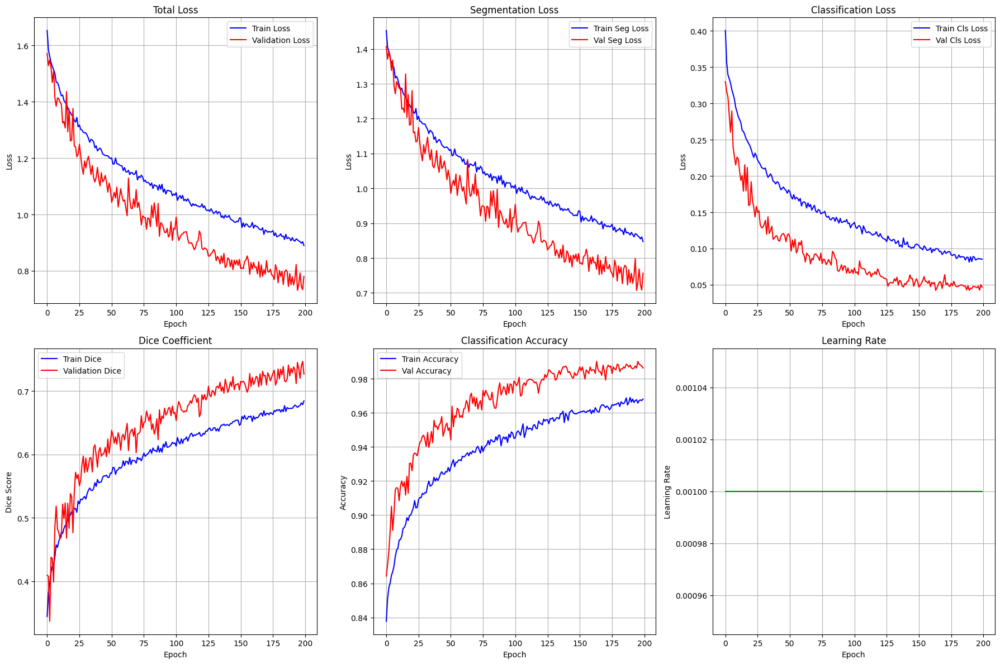


Training completed!
Best validation loss: 0.730548


Validation: 100%|██████████| 73/73 [00:06<00:00, 11.78it/s, Loss=1.1758, Dice=0.6446, Acc=0.9444]

loss: 0.8818854542627727, seg_loss: 0.852392946612345, cls_loss: 0.05898502132255737, dice: 0.6763263842830919, cls_acc: 0.979689893657214


In [16]:
CONFIG = {
    'working_path': 'train',  
    'batch_size': 16,     
    'export_type': 'RGBN',
    'input_channels': 4,  # 1 for NDVI, 3 for RGB, 4 for RGBN
    'num_classes': 6,
    'filters_base': 32,
    'dropout_rate': 0.15,
    'learning_rate': 0.001,
    'num_epochs': 200,
    'seg_weight': 1.0,
    'cls_weight': 0.5,
    'pos_weight': 2.0,
    'augmentation': True,
    'num_workers': 4
}

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(1)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(1).total_memory / 1024**3:.1f} GB")

# Create datasets
print("Creating datasets...")
train_dataloader, val_dataloader, test_dataloader = create_pytorch_datasets(
    working_path=CONFIG['working_path'],
    batch_size=CONFIG['batch_size'],
    export_type=CONFIG['export_type'],
    augmentation=CONFIG['augmentation'],
    test_size=0.20,  # 20%
    val_size=0.05    # 5%
)

print(f"Training samples: {len(train_dataloader.dataset)}")
print(f"Validation samples: {len(val_dataloader.dataset)}")
print(f"Training batches: {len(train_dataloader)}")
print(f"Validation batches: {len(val_dataloader)}")

# Create model
print("Creating model...")
model_rgbn = OptimizedMultiTaskUNet512(
    input_channels=CONFIG['input_channels'],
    num_classes=CONFIG['num_classes'],
    filters_base=CONFIG['filters_base'],
    dropout_rate=CONFIG['dropout_rate']
)

# model_rgbn = model_rgbn.load_state_dict(torch.load("results/rgbn_multitask.pth"))


# model_rgbn = torch.load("results/rgbn_multitask.pth")


num_gpus = torch.cuda.device_count()
model_rgbn = model_rgbn.to(device)

# # Then wrap with DataParallel
# if num_gpus > 1:
#     print(f"Using DataParallel with {num_gpus} GPUs")
#     model_rgbn = nn.DataParallel(model_rgbn)


# model_rgb.to(device)
# Create trainer

trainer_rgbn = ModelTrainer(
    model=model_rgbn,
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    device=device,
    learning_rate=CONFIG['learning_rate'],
    seg_weight=CONFIG['seg_weight'],
    cls_weight=CONFIG['cls_weight'],
    pos_weight=CONFIG['pos_weight'],
    model_name="rgbn_512"
)


history = trainer_rgbn.train(CONFIG['num_epochs'])
trainer_rgbn.val_dataloader = test_dataloader
test_loss, test_seg_loss, test_cls_loss, test_dice, test_cls_acc = trainer_rgbn.validate_epoch()
print(f'loss: {test_loss}, seg_loss: {test_seg_loss}, cls_loss: {test_cls_loss}, dice: {test_dice}, cls_acc: {test_cls_acc}')

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

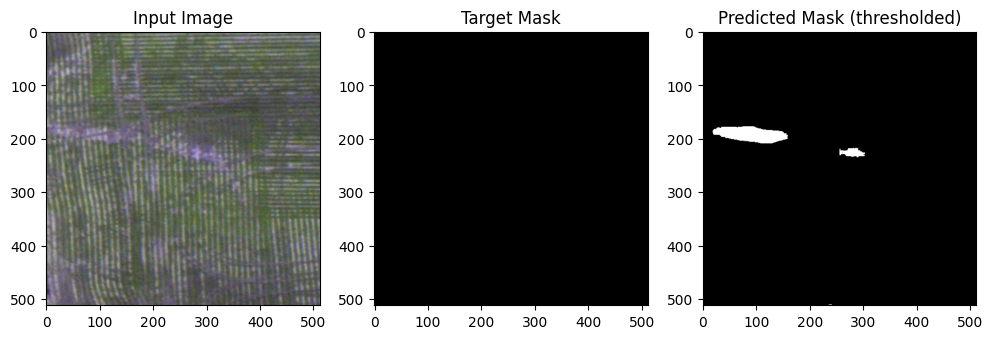

Validation:   1%|▏         | 1/73 [00:14<17:34, 14.64s/it]

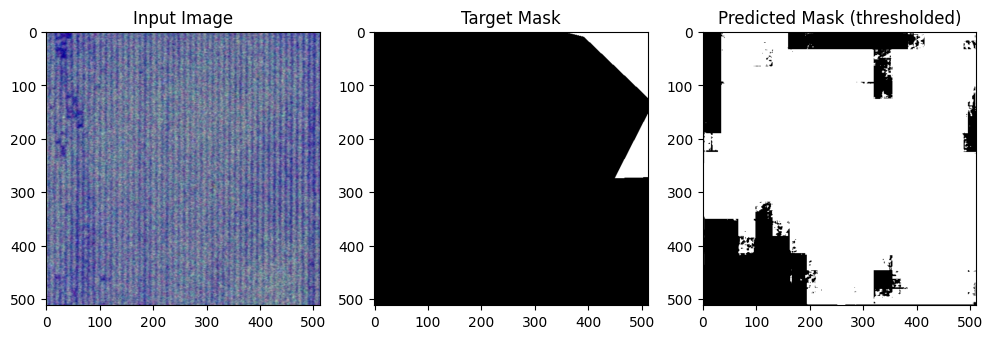

Validation:   3%|▎         | 2/73 [00:28<17:06, 14.46s/it]

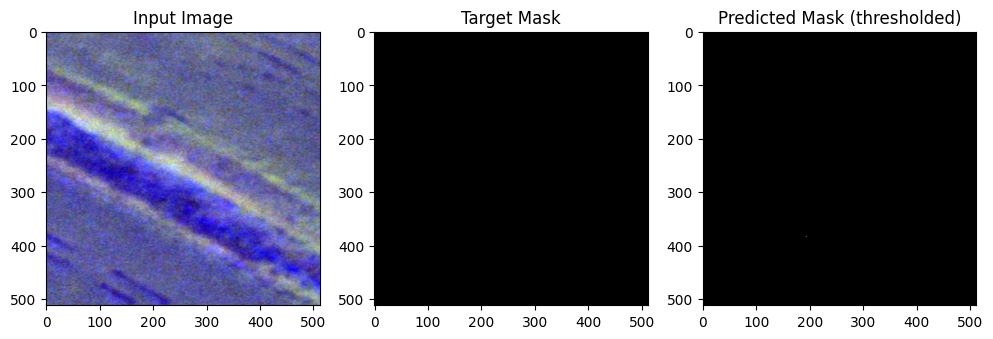

Validation:   4%|▍         | 3/73 [00:43<16:48, 14.41s/it]

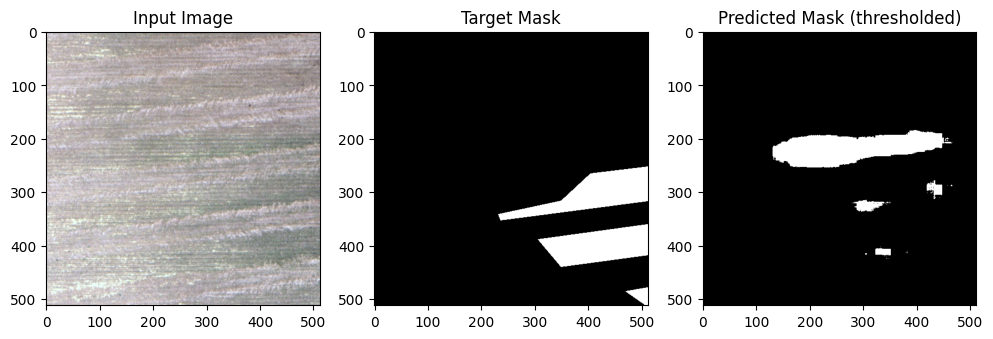

Validation:   5%|▌         | 4/73 [00:57<16:30, 14.36s/it]

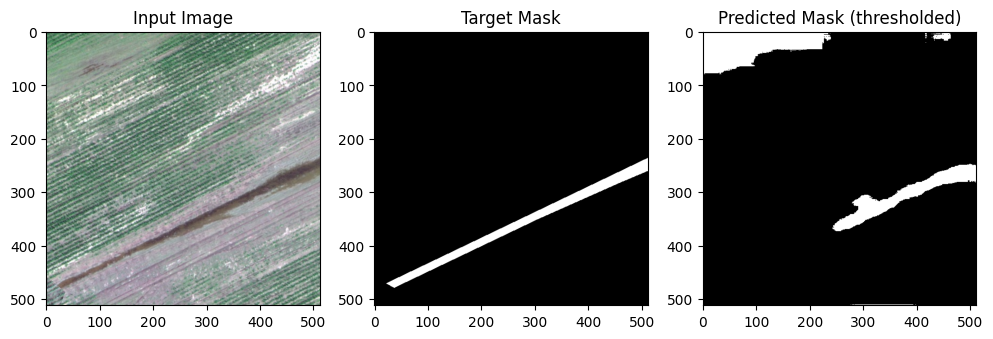

Validation:   7%|▋         | 5/73 [01:11<16:08, 14.24s/it]

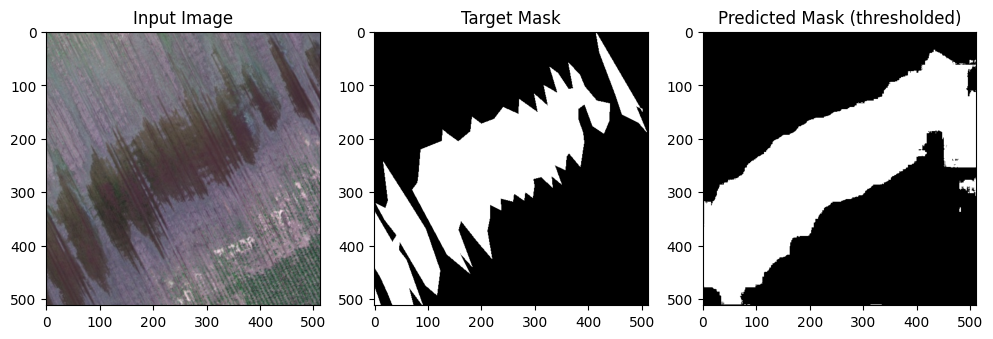

Validation:   8%|▊         | 6/73 [01:25<15:52, 14.21s/it]

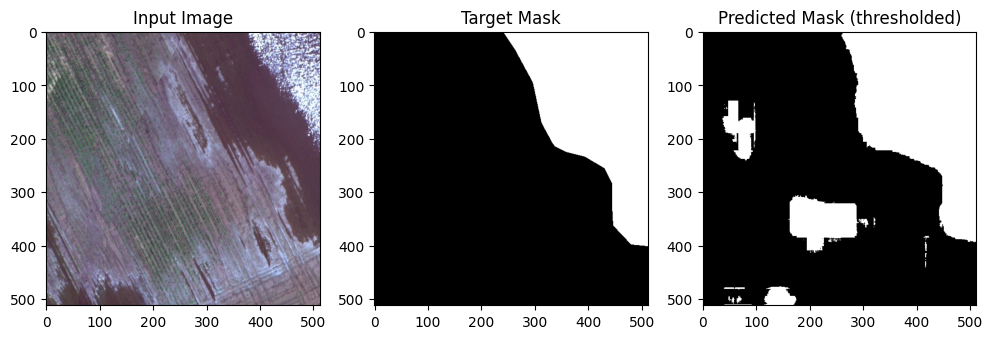

Validation:  10%|▉         | 7/73 [01:40<15:41, 14.27s/it]

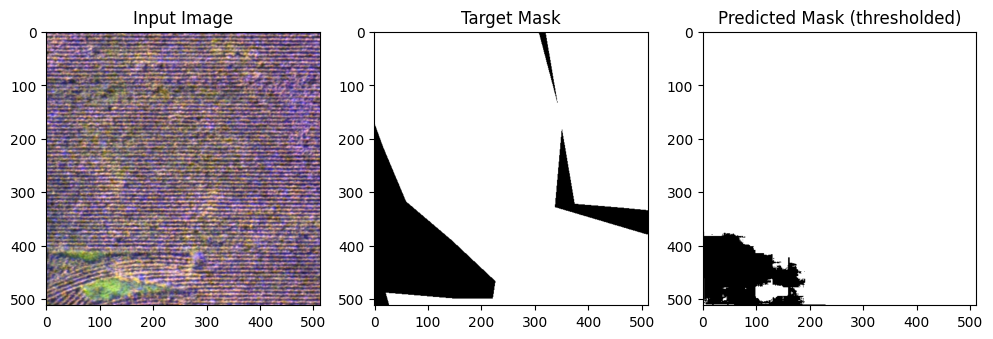

Validation:  11%|█         | 8/73 [01:54<15:35, 14.40s/it]

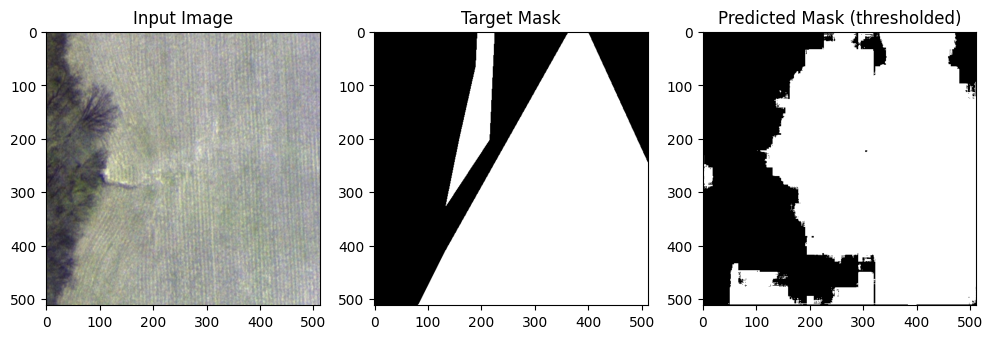

Validation:  12%|█▏        | 9/73 [02:09<15:19, 14.36s/it]

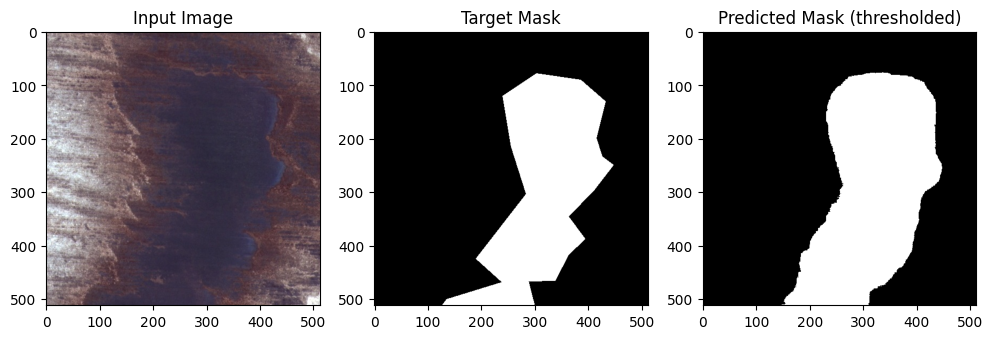

Validation:  14%|█▎        | 10/73 [02:23<15:03, 14.35s/it]

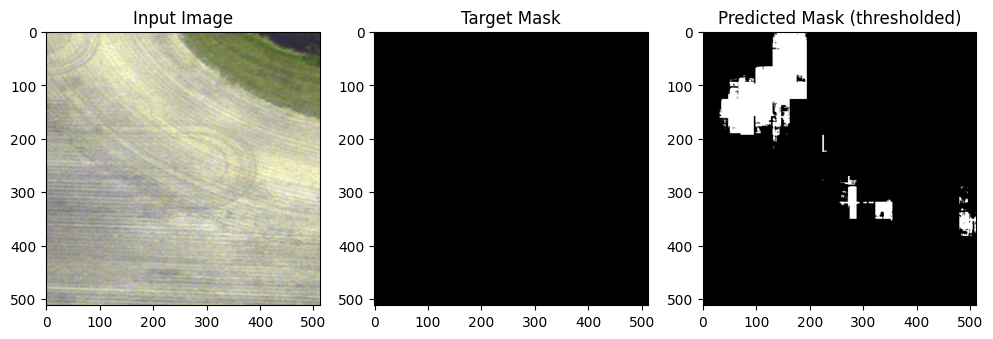

Validation:  15%|█▌        | 11/73 [02:37<14:49, 14.35s/it]

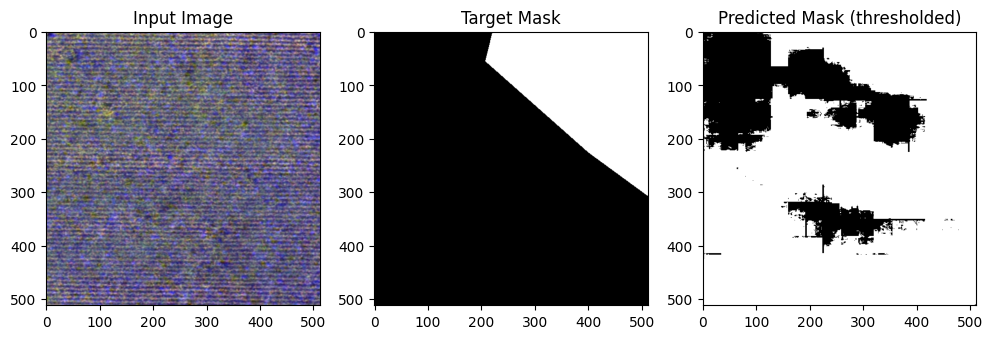

Validation:  16%|█▋        | 12/73 [02:52<14:32, 14.31s/it]

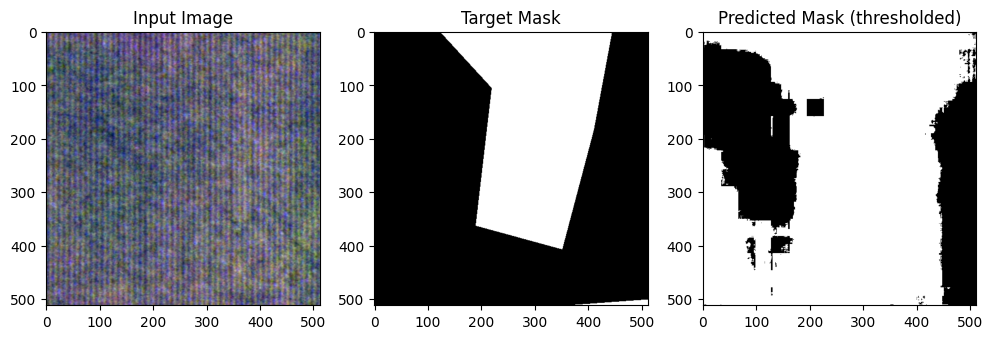

Validation:  18%|█▊        | 13/73 [03:06<14:21, 14.36s/it]

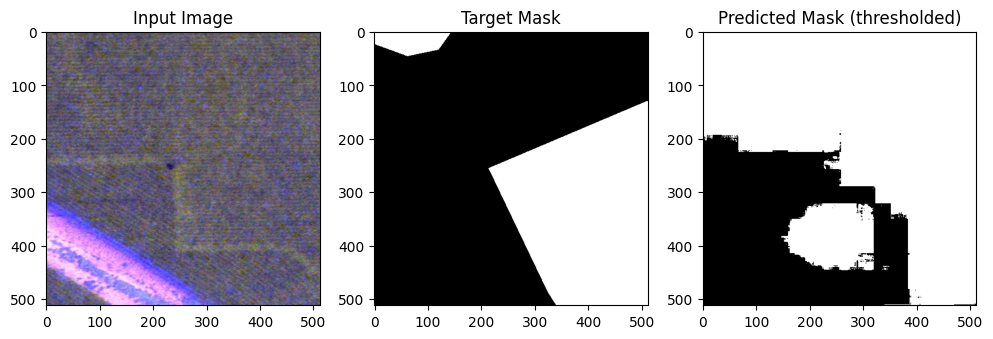

Validation:  19%|█▉        | 14/73 [03:20<14:09, 14.40s/it]

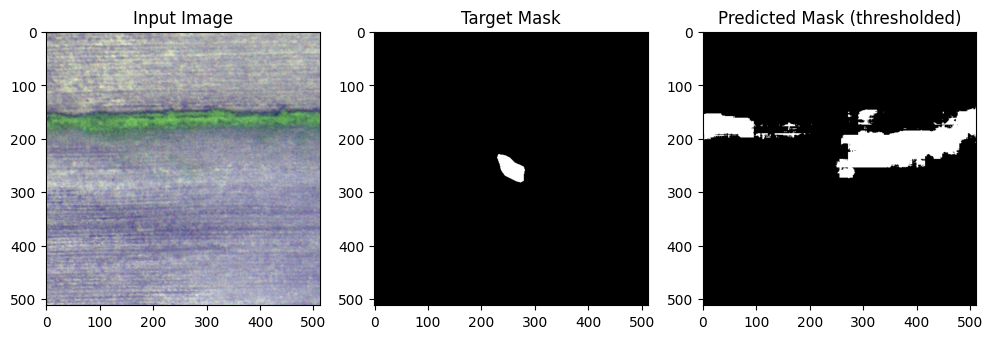

Validation:  21%|██        | 15/73 [03:35<14:01, 14.50s/it]

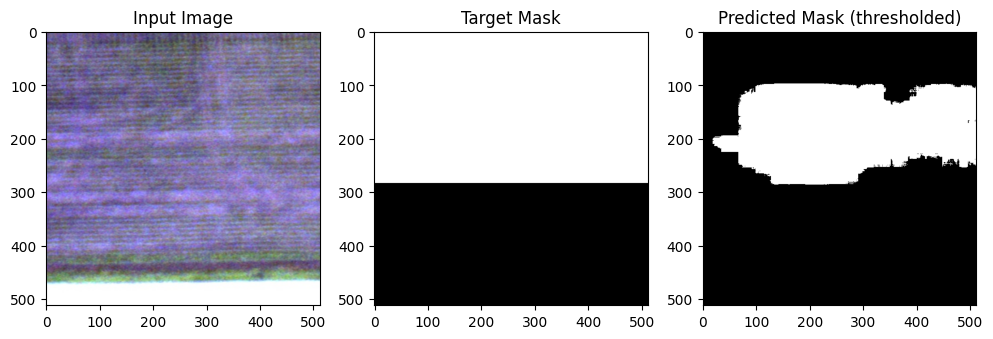

Validation:  22%|██▏       | 16/73 [03:50<13:47, 14.52s/it]

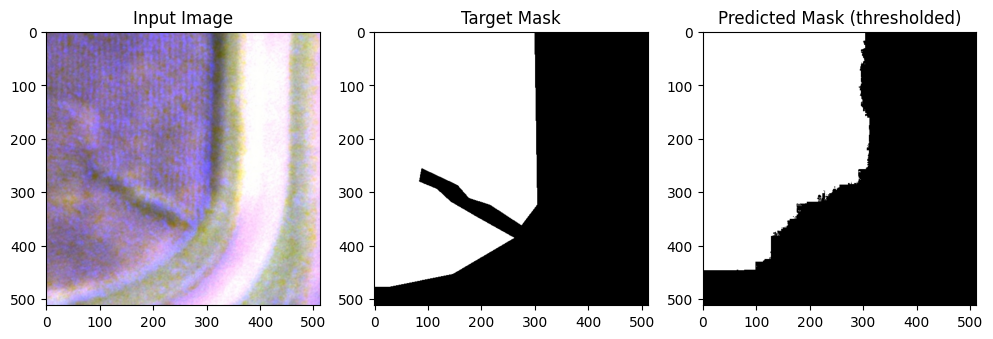

Validation:  23%|██▎       | 17/73 [04:04<13:33, 14.53s/it]

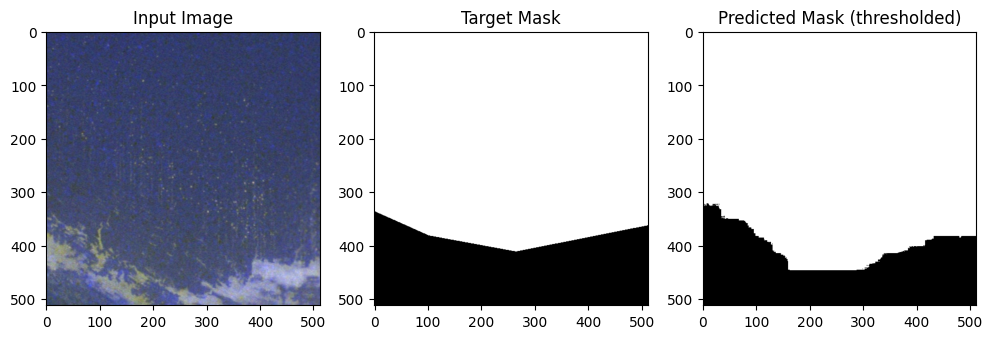

Validation:  25%|██▍       | 18/73 [04:19<13:17, 14.51s/it]

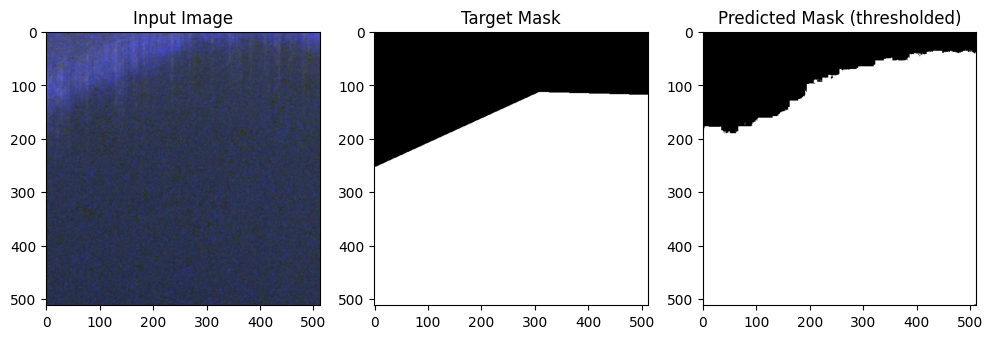

Validation:  26%|██▌       | 19/73 [04:34<13:07, 14.59s/it]

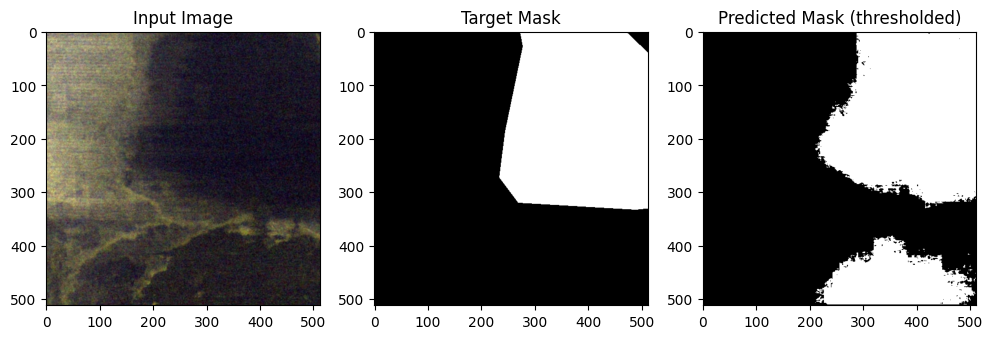

Validation:  27%|██▋       | 20/73 [04:48<12:46, 14.47s/it]

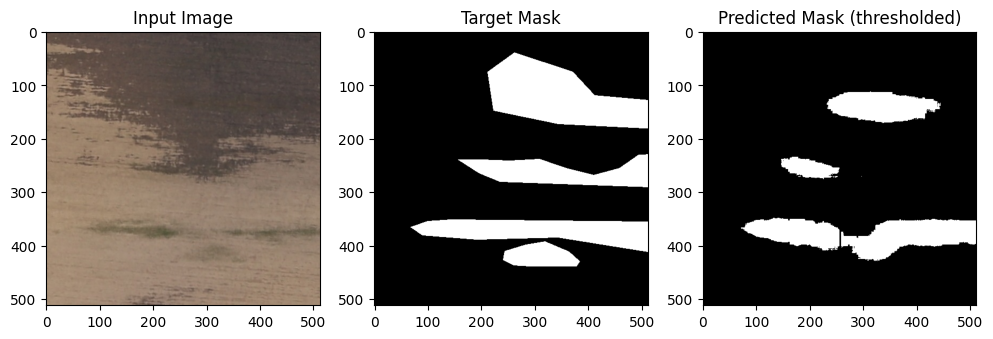

Validation:  29%|██▉       | 21/73 [05:02<12:30, 14.44s/it]

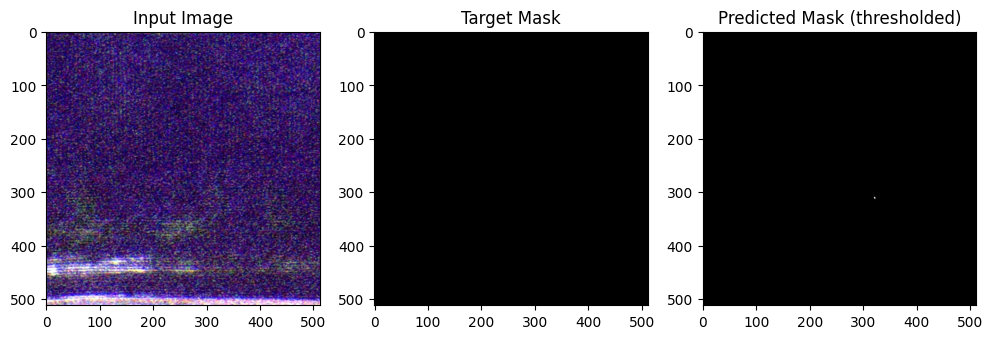

Validation:  30%|███       | 22/73 [05:16<12:12, 14.36s/it]

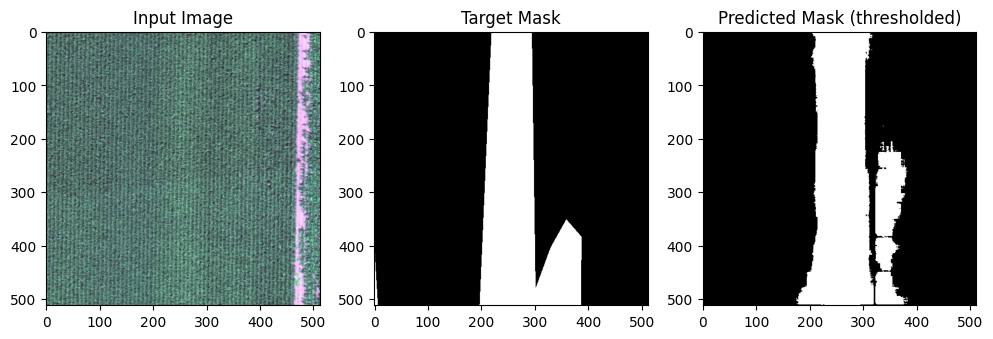

Validation:  32%|███▏      | 23/73 [05:30<11:54, 14.30s/it]

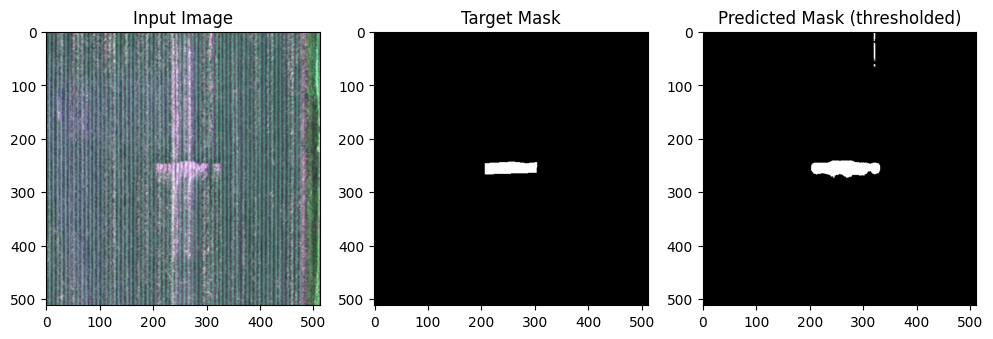

Validation:  33%|███▎      | 24/73 [05:45<11:37, 14.24s/it]

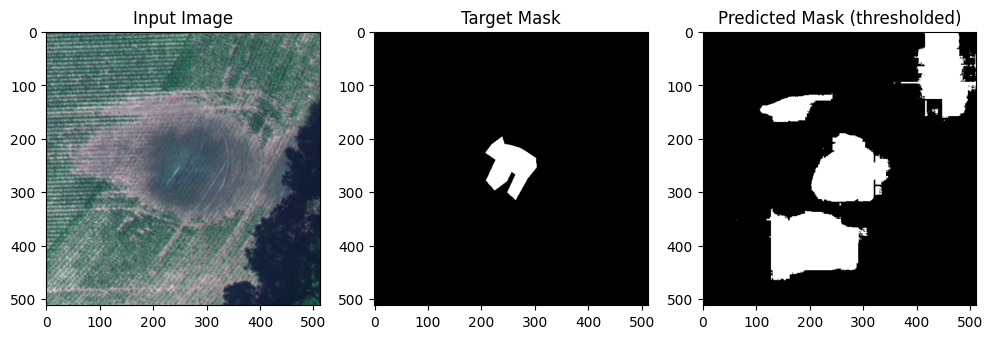

Validation:  34%|███▍      | 25/73 [05:59<11:33, 14.45s/it]

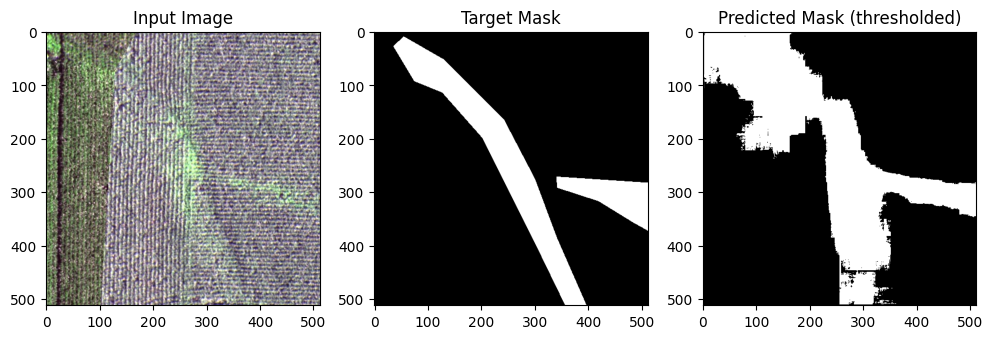

Validation:  36%|███▌      | 26/73 [06:14<11:14, 14.35s/it]

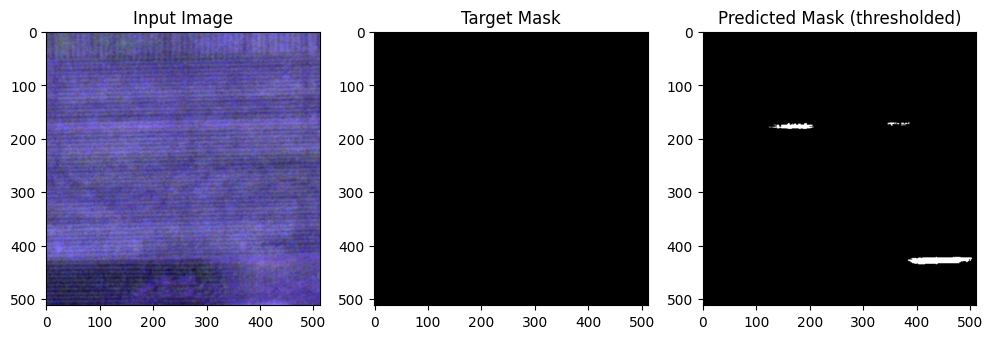

Validation:  37%|███▋      | 27/73 [06:28<10:55, 14.24s/it]

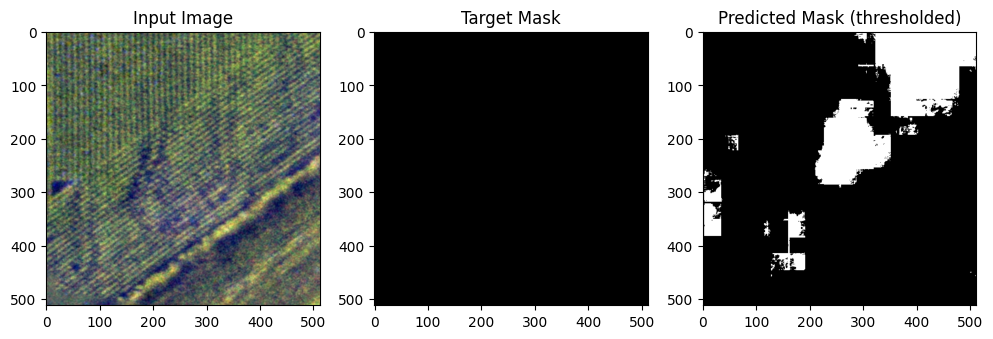

Validation:  38%|███▊      | 28/73 [06:42<10:41, 14.26s/it]

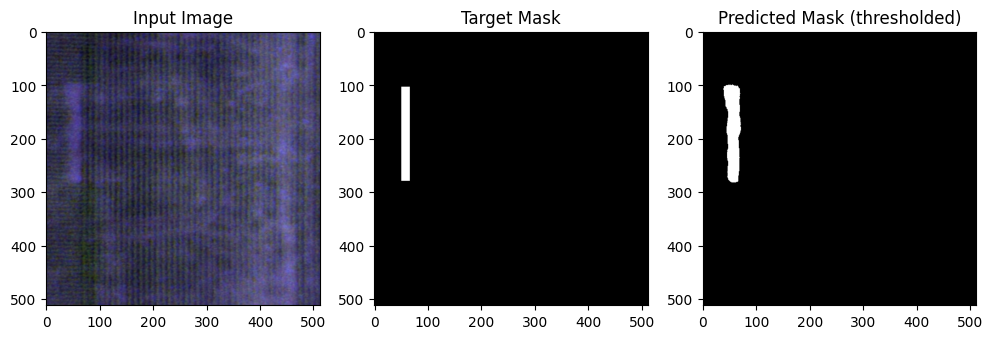

Validation:  40%|███▉      | 29/73 [06:56<10:24, 14.19s/it]

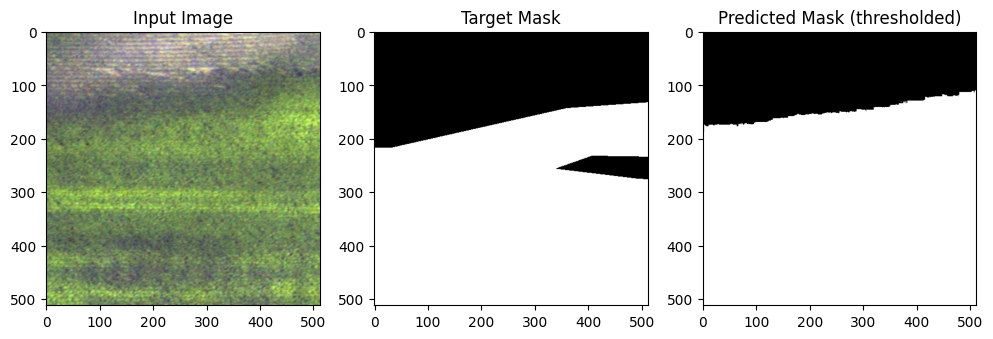

Validation:  41%|████      | 30/73 [07:10<10:07, 14.12s/it]

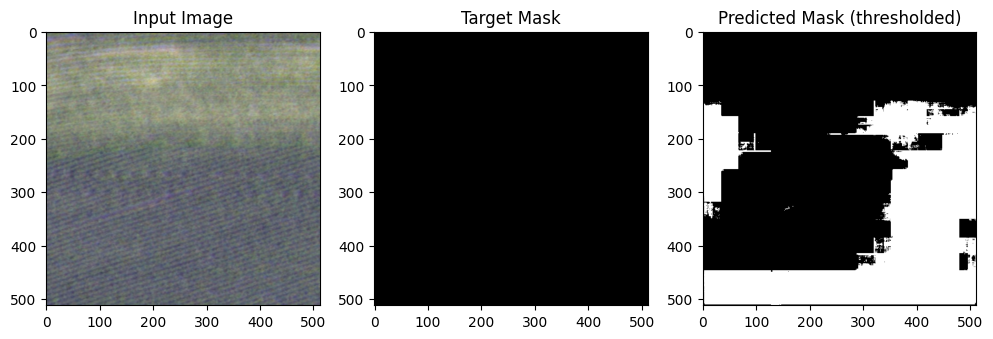

Validation:  42%|████▏     | 31/73 [07:24<09:49, 14.02s/it]

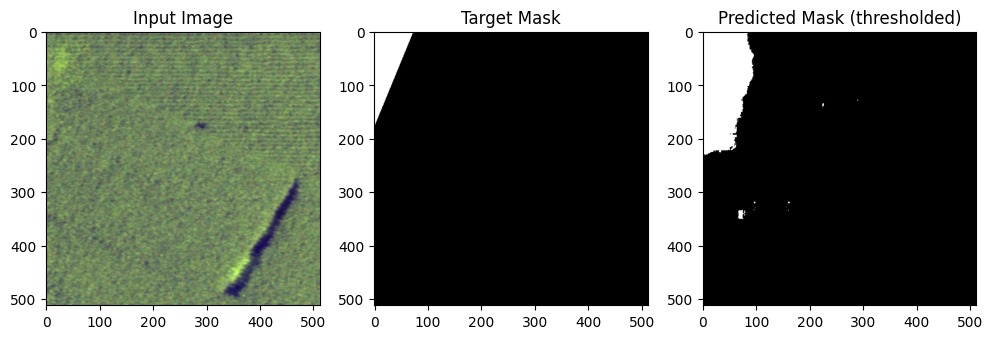

Validation:  44%|████▍     | 32/73 [07:38<09:33, 14.00s/it]

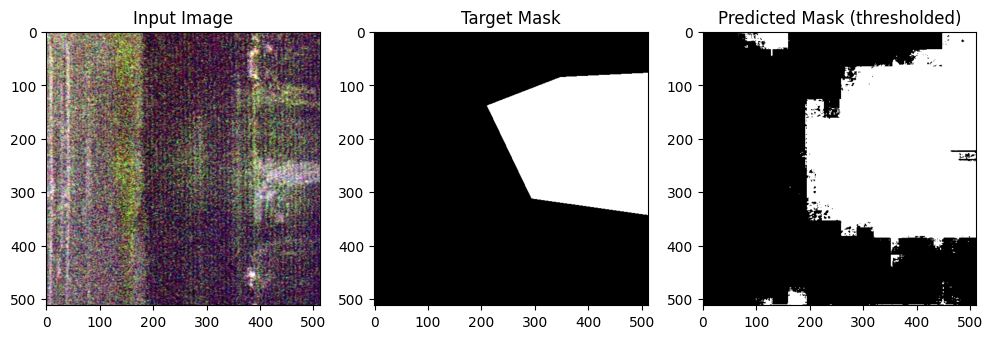

Validation:  45%|████▌     | 33/73 [07:51<09:16, 13.91s/it]

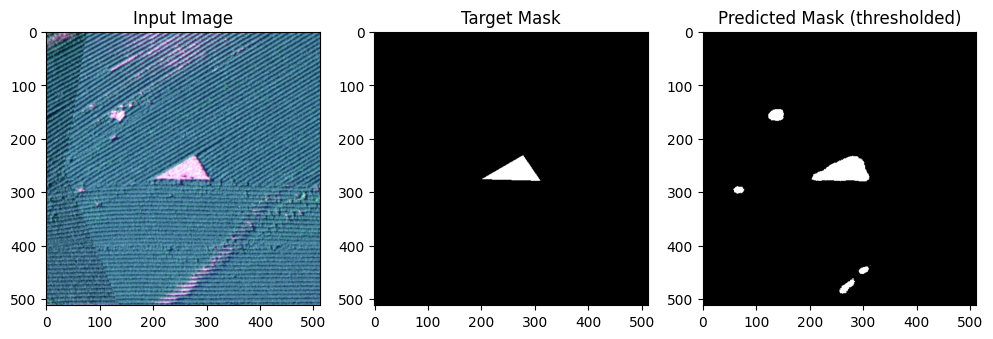

Validation:  47%|████▋     | 34/73 [08:05<09:02, 13.90s/it]

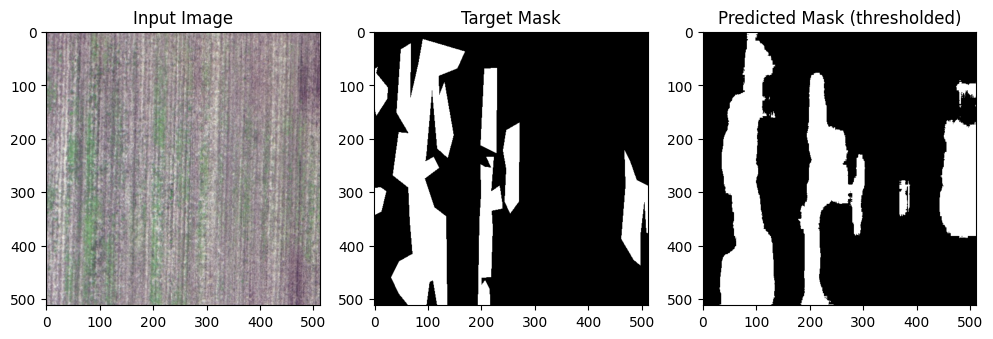

Validation:  48%|████▊     | 35/73 [08:19<08:48, 13.91s/it]

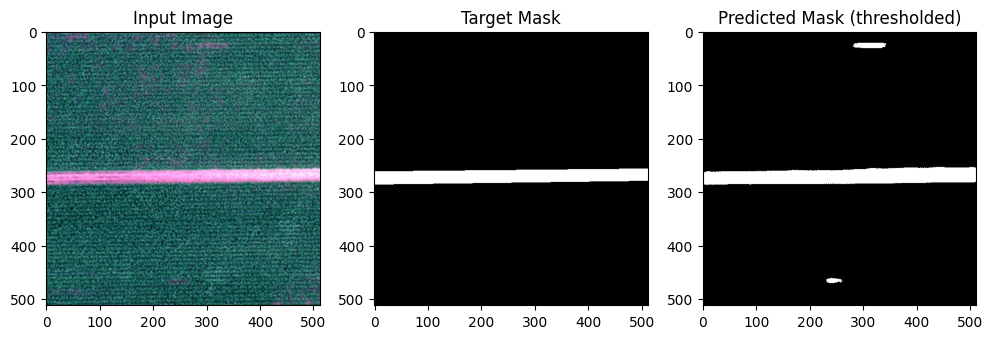

Validation:  49%|████▉     | 36/73 [08:33<08:37, 13.98s/it]

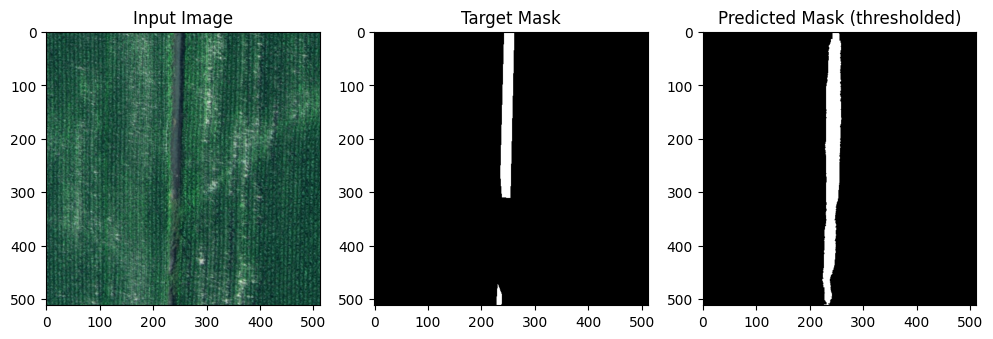

Validation:  51%|█████     | 37/73 [08:47<08:22, 13.95s/it]

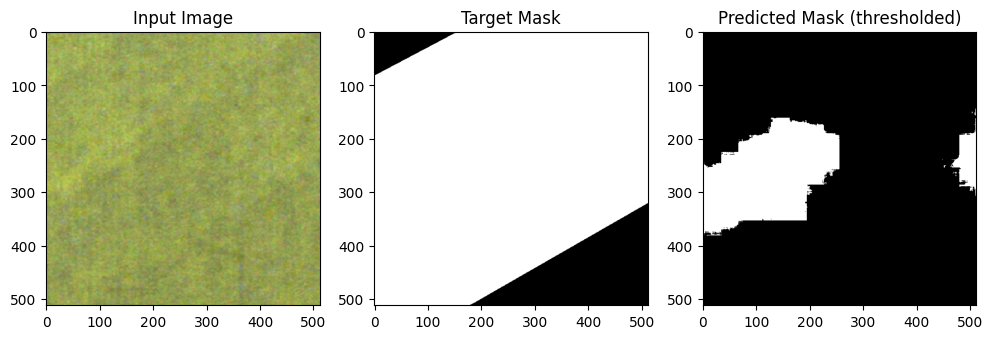

Validation:  52%|█████▏    | 38/73 [09:01<08:05, 13.88s/it]

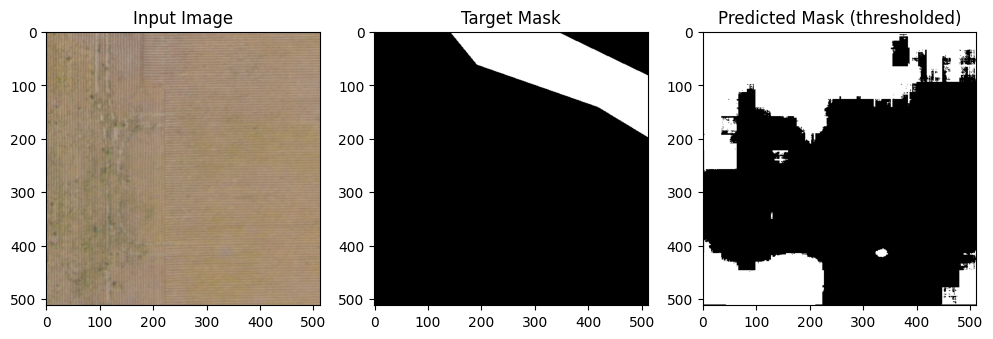

Validation:  53%|█████▎    | 39/73 [09:15<07:53, 13.92s/it]

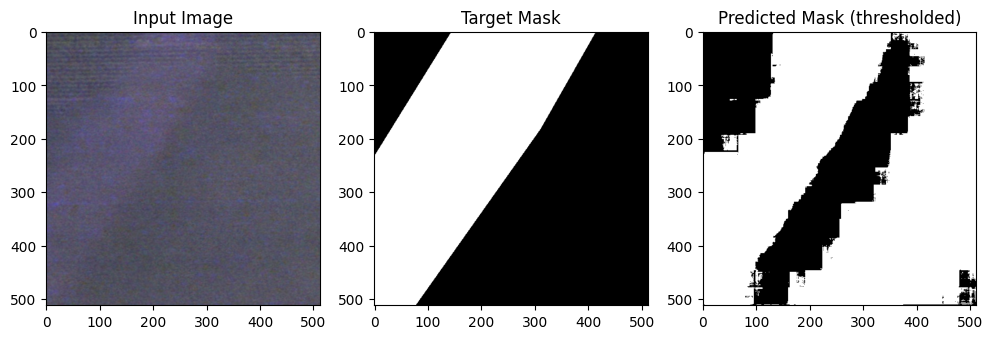

Validation:  55%|█████▍    | 40/73 [09:29<07:40, 13.95s/it]

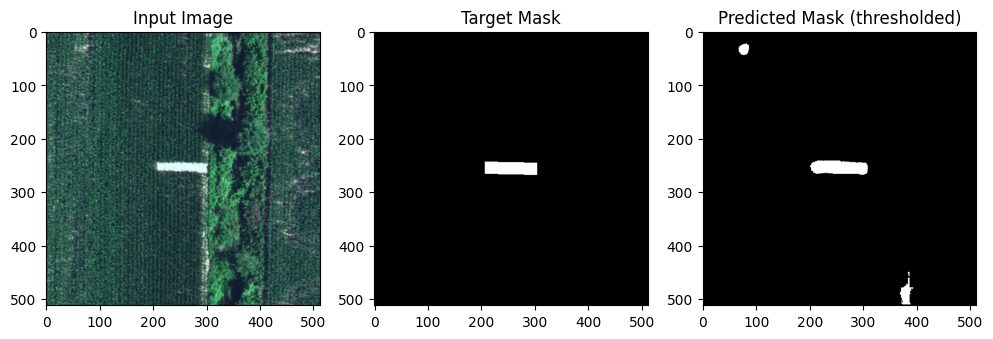

Validation:  56%|█████▌    | 41/73 [09:43<07:27, 13.97s/it]

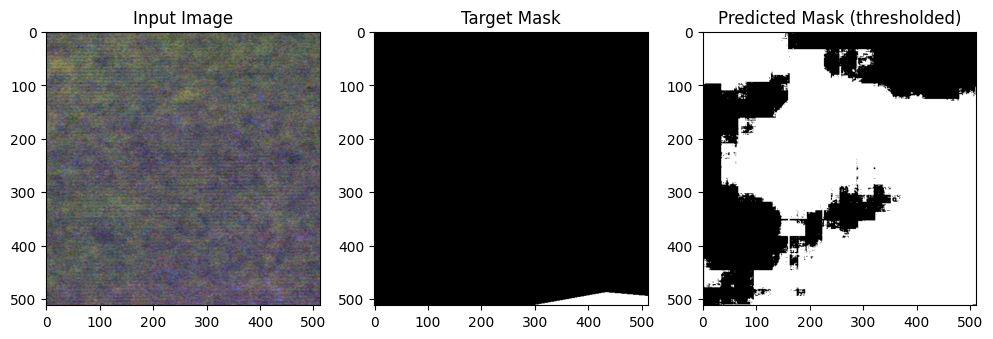

Validation:  58%|█████▊    | 42/73 [09:57<07:14, 14.03s/it]

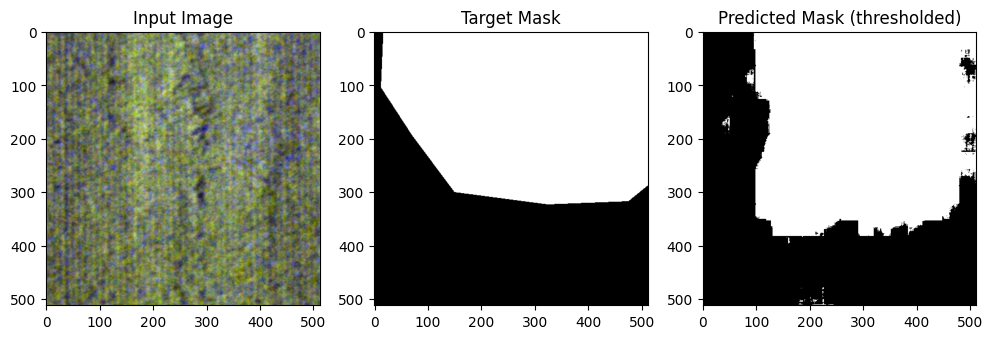

Validation:  59%|█████▉    | 43/73 [10:11<07:00, 14.03s/it]

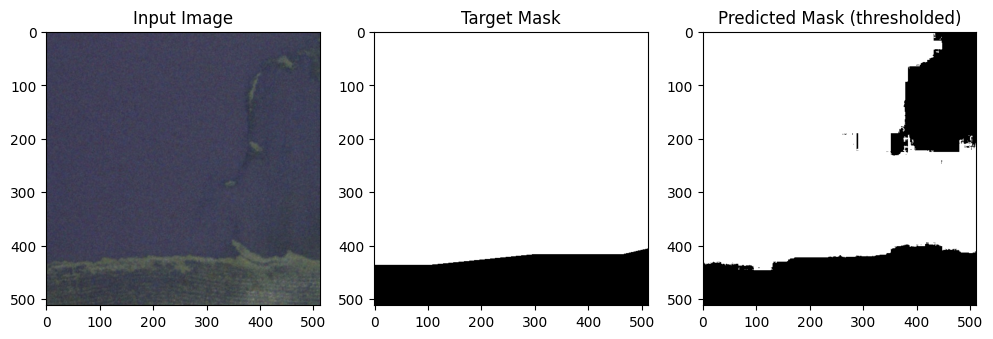

Validation:  60%|██████    | 44/73 [10:25<06:48, 14.10s/it]

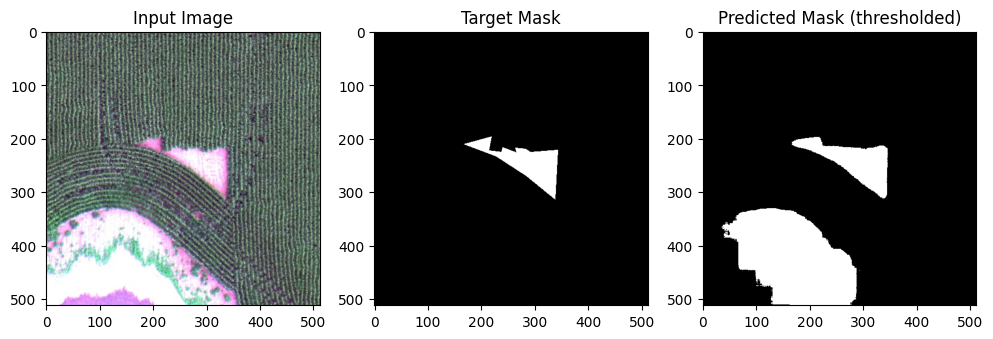

Validation:  62%|██████▏   | 45/73 [10:39<06:33, 14.06s/it]

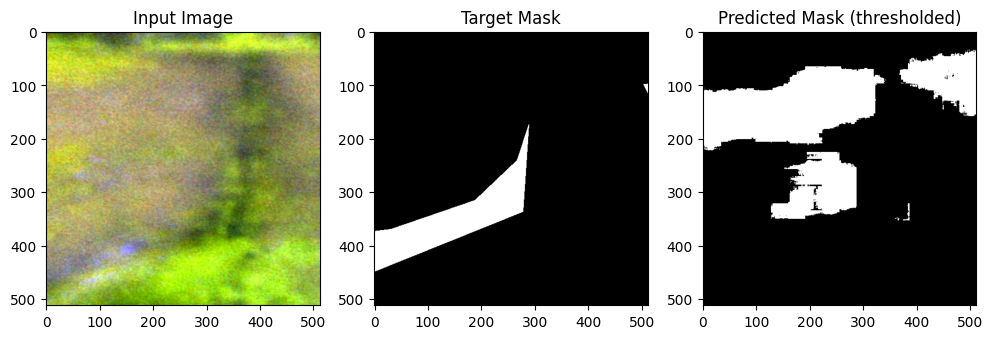

Validation:  63%|██████▎   | 46/73 [10:54<06:20, 14.10s/it]

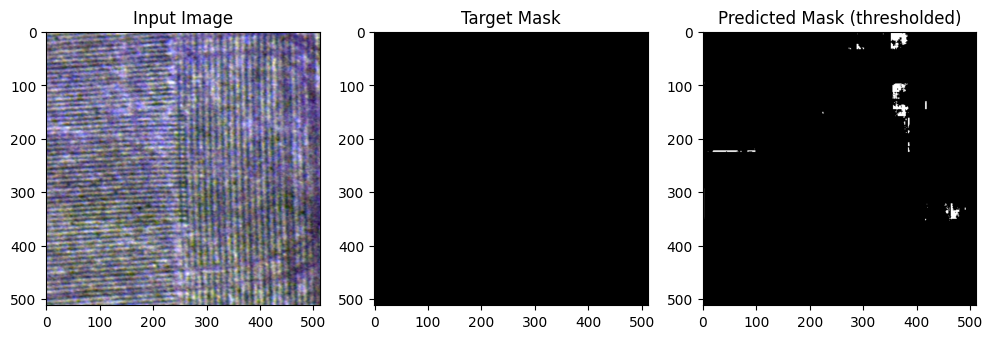

Validation:  64%|██████▍   | 47/73 [11:08<06:06, 14.10s/it]

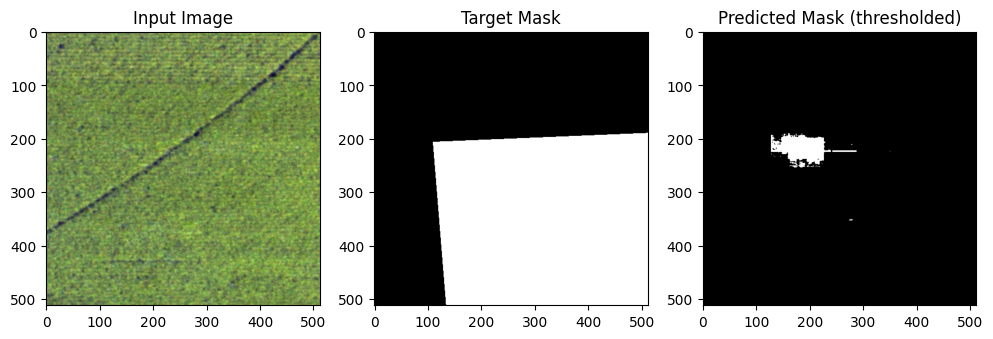

Validation:  66%|██████▌   | 48/73 [11:22<05:51, 14.07s/it]

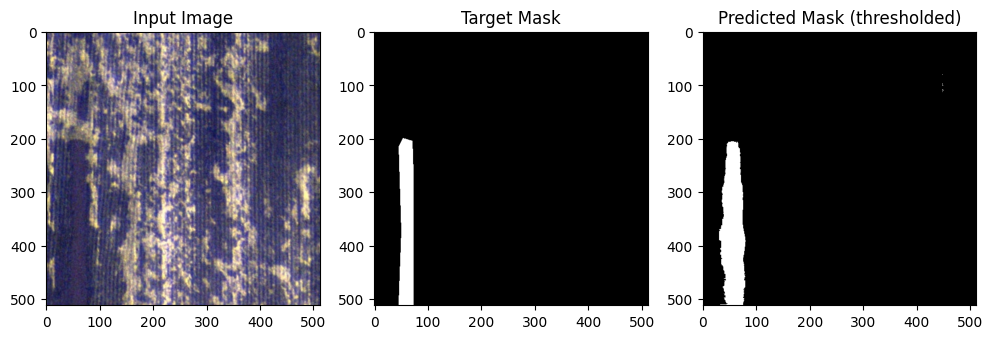

Validation:  67%|██████▋   | 49/73 [11:36<05:36, 14.02s/it]

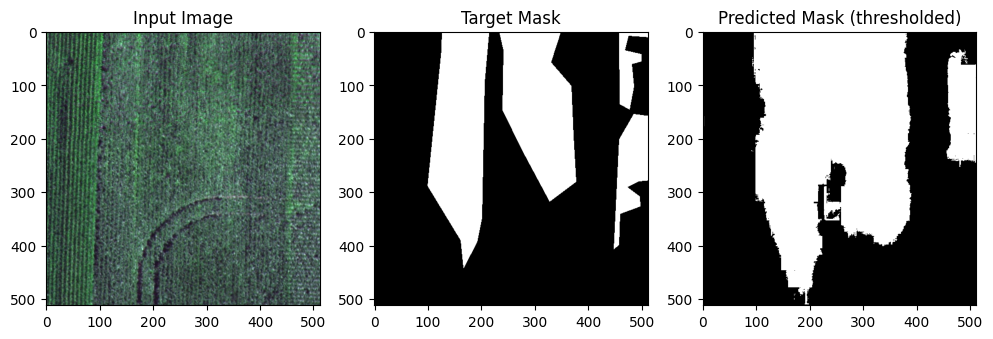

Validation:  68%|██████▊   | 50/73 [11:50<05:22, 14.01s/it]

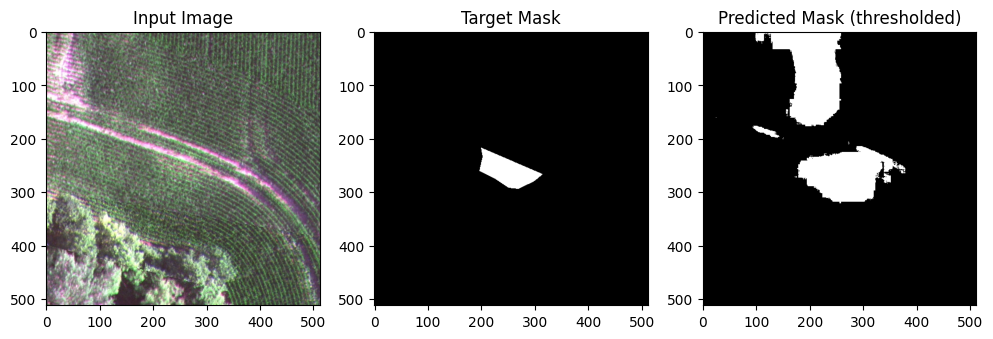

Validation:  70%|██████▉   | 51/73 [12:03<05:05, 13.89s/it]

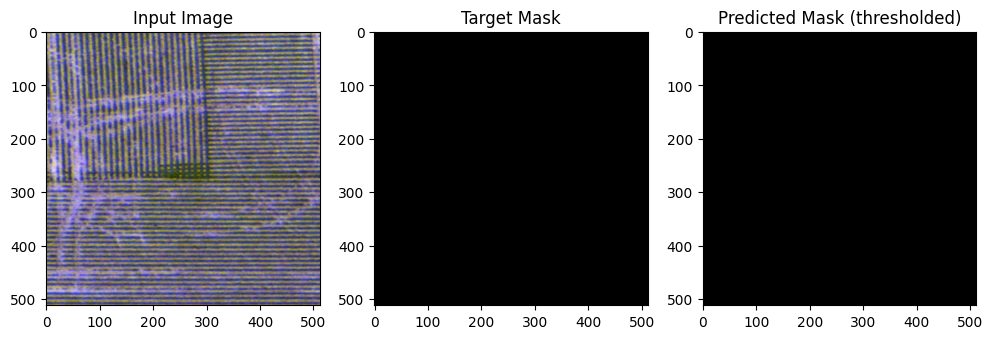

Validation:  71%|███████   | 52/73 [12:17<04:50, 13.83s/it]

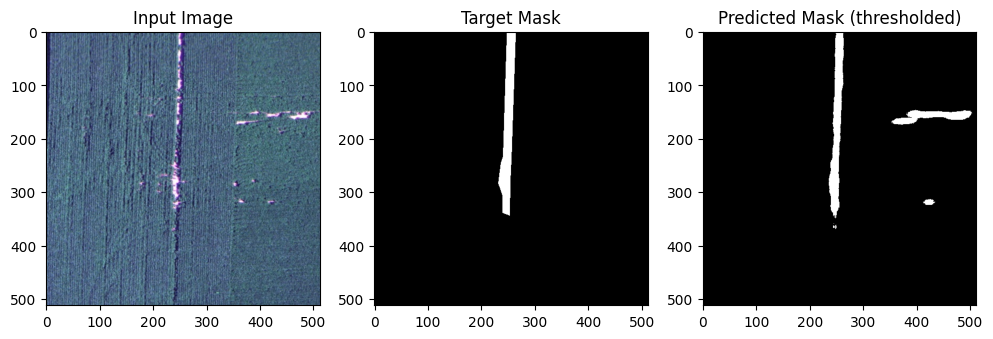

Validation:  73%|███████▎  | 53/73 [12:31<04:39, 13.97s/it]

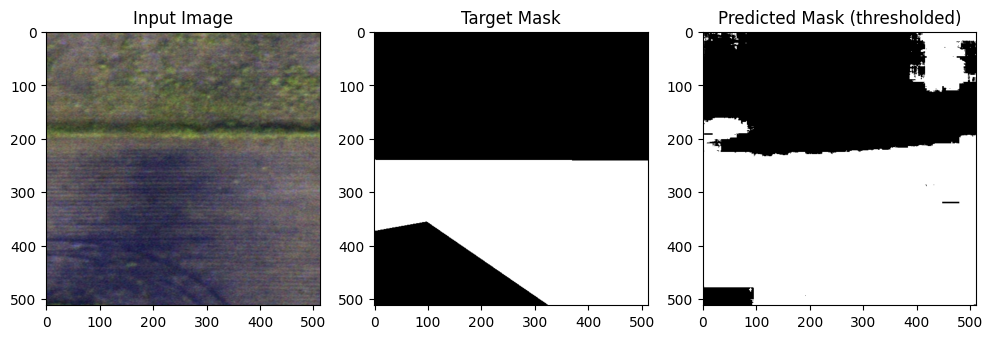

Validation:  74%|███████▍  | 54/73 [12:45<04:26, 14.02s/it]

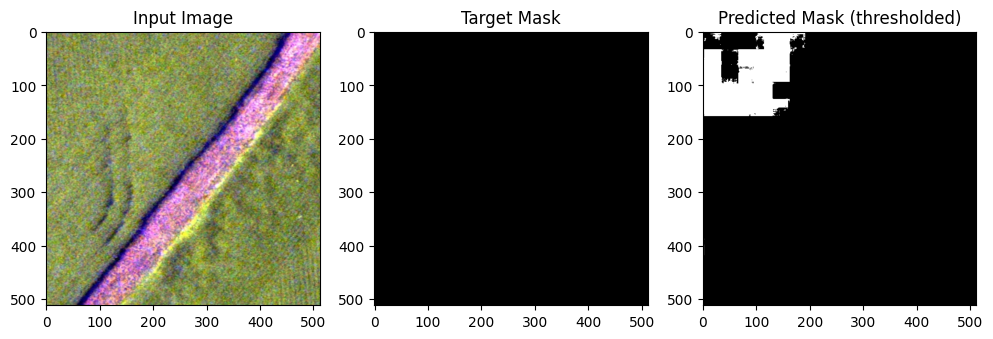

Validation:  75%|███████▌  | 55/73 [12:59<04:13, 14.07s/it]

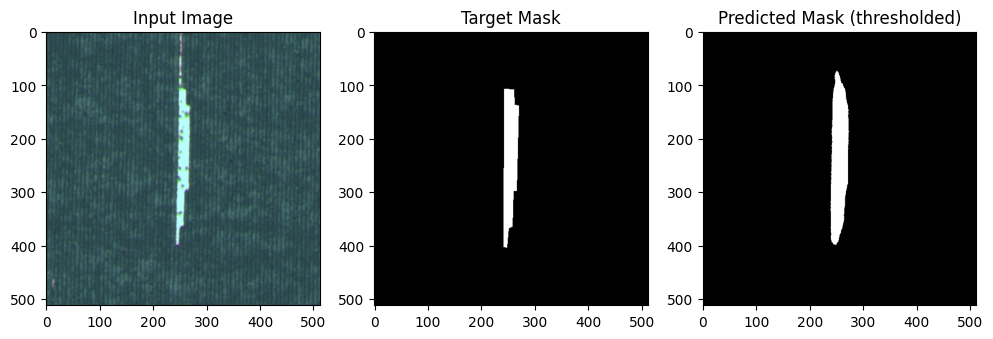

Validation:  77%|███████▋  | 56/73 [13:14<04:00, 14.17s/it]

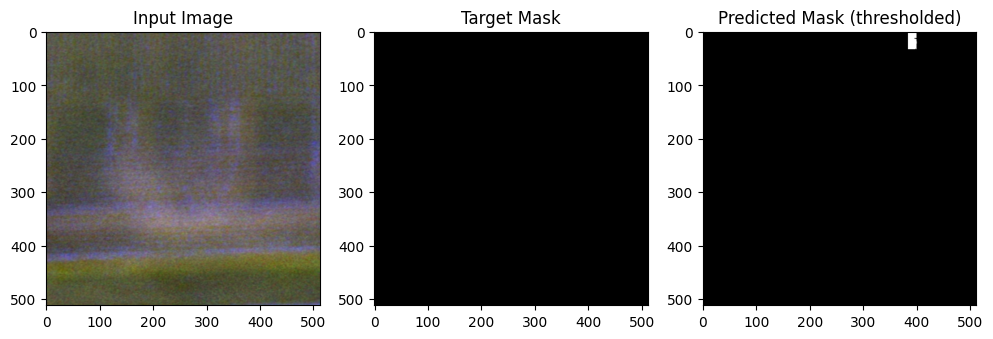

Validation:  78%|███████▊  | 57/73 [13:28<03:47, 14.21s/it]

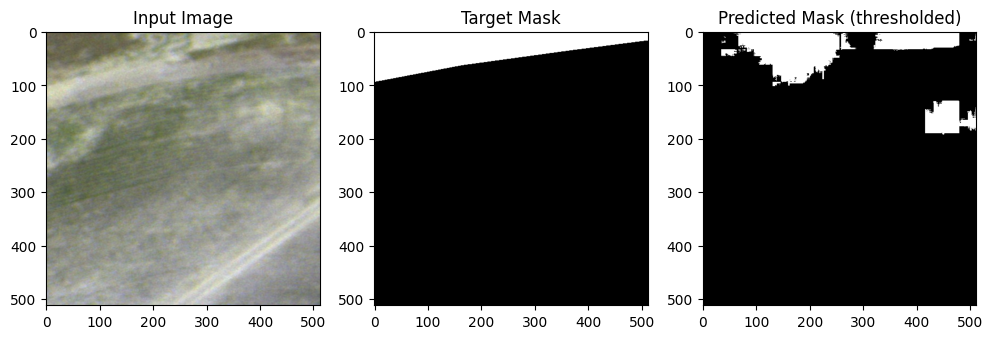

Validation:  79%|███████▉  | 58/73 [13:43<03:34, 14.28s/it]

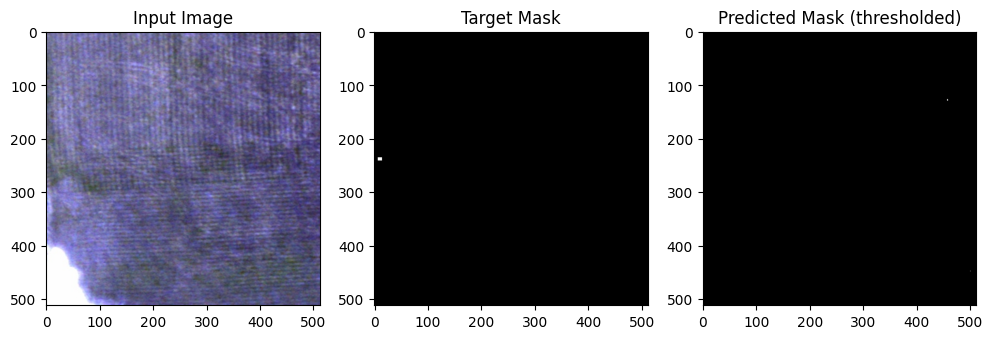

Validation:  81%|████████  | 59/73 [13:57<03:19, 14.24s/it]

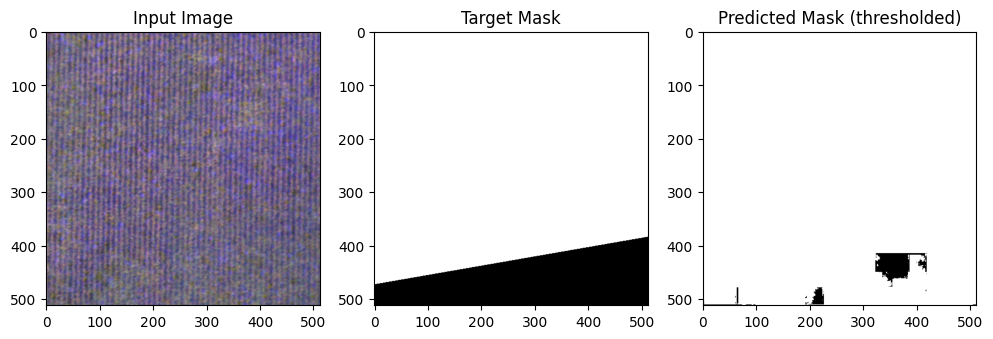

Validation:  82%|████████▏ | 60/73 [14:11<03:04, 14.22s/it]

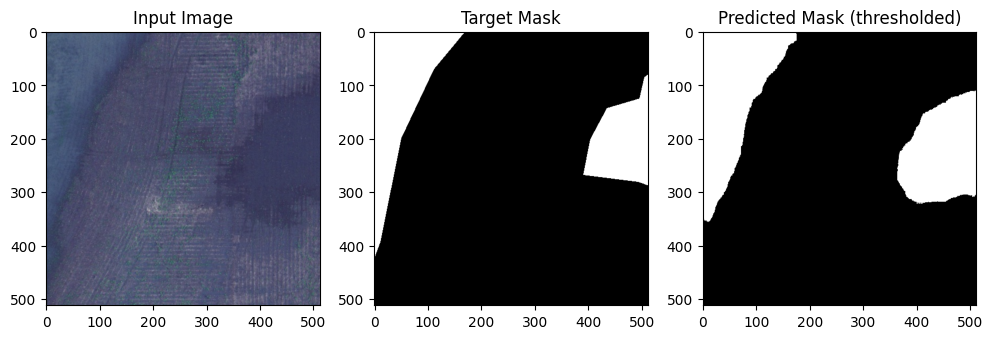

Validation:  84%|████████▎ | 61/73 [14:25<02:49, 14.16s/it]

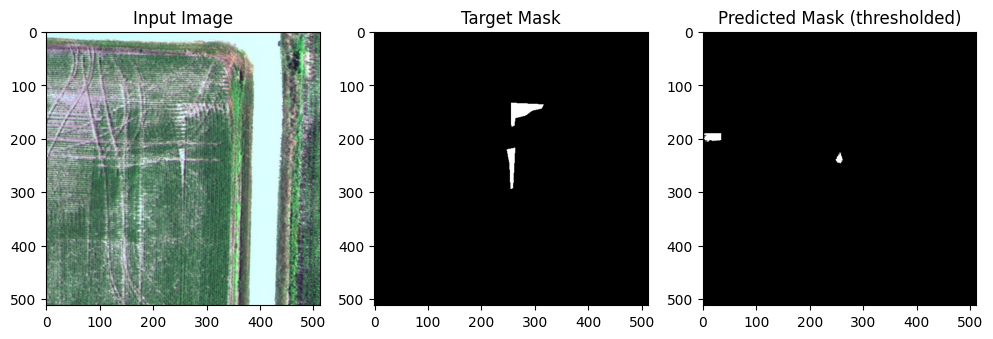

Validation:  85%|████████▍ | 62/73 [14:39<02:35, 14.10s/it]

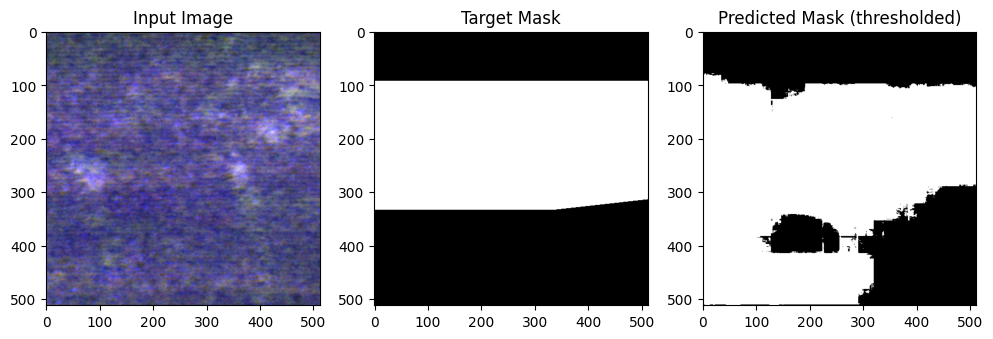

Validation:  86%|████████▋ | 63/73 [14:53<02:20, 14.03s/it]

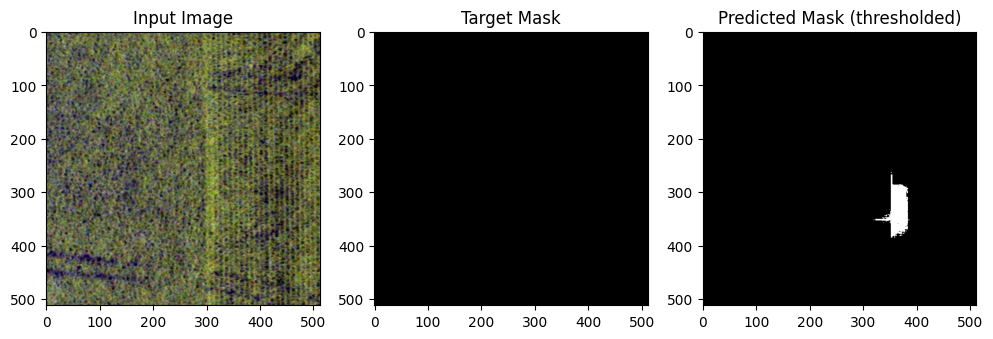

Validation:  88%|████████▊ | 64/73 [15:07<02:05, 13.98s/it]

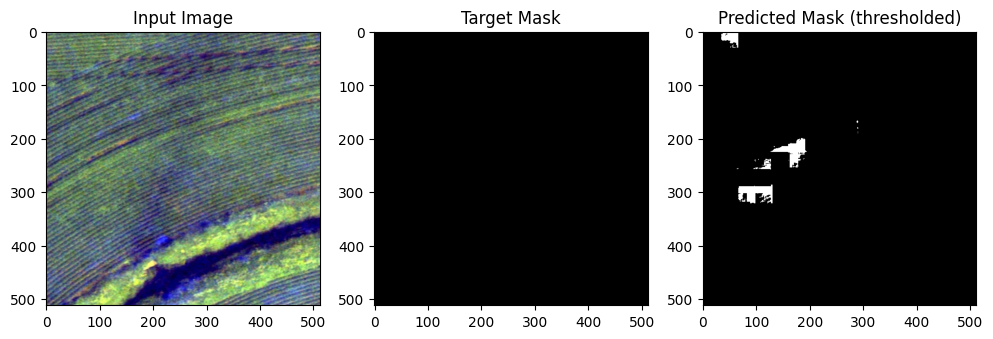

Validation:  89%|████████▉ | 65/73 [15:21<01:51, 13.97s/it]

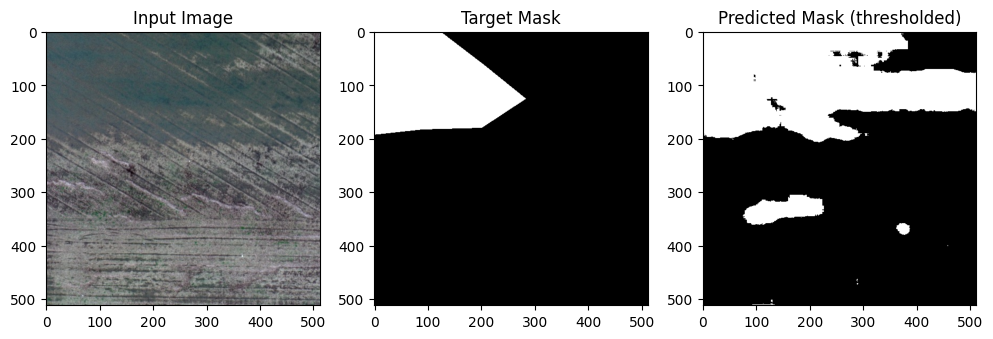

Validation:  90%|█████████ | 66/73 [15:35<01:38, 14.00s/it]

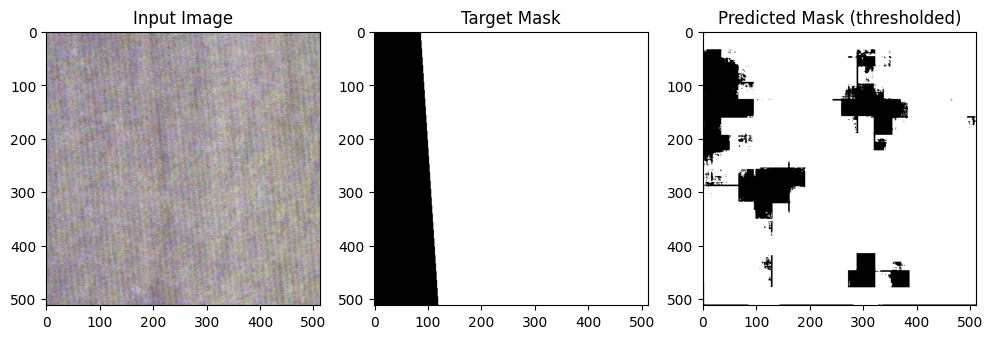

Validation:  92%|█████████▏| 67/73 [15:49<01:23, 14.00s/it]

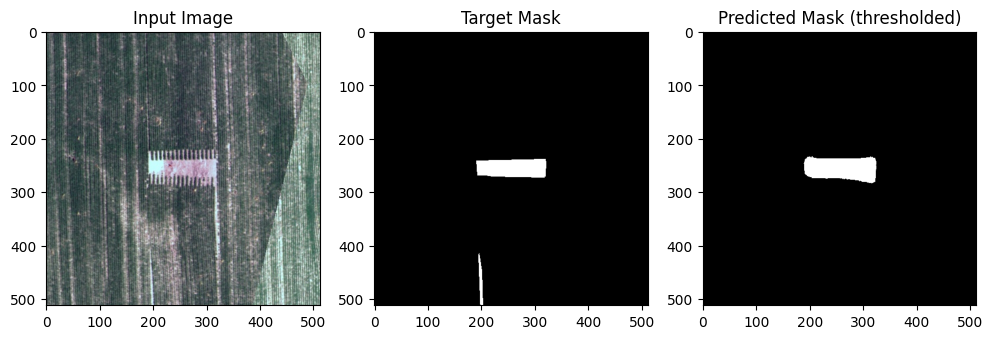

Validation:  93%|█████████▎| 68/73 [16:03<01:10, 14.15s/it]

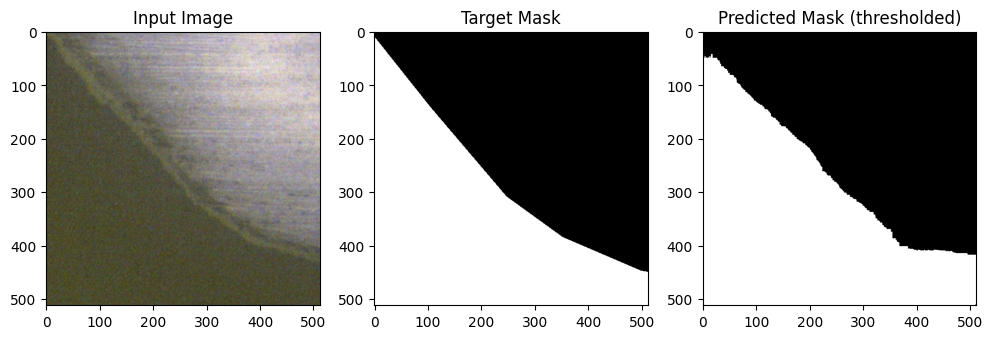

Validation:  95%|█████████▍| 69/73 [16:17<00:56, 14.15s/it]

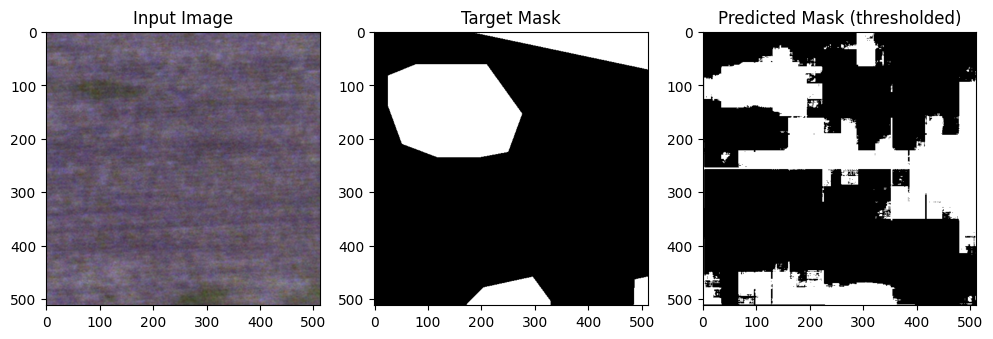

Validation:  96%|█████████▌| 70/73 [16:31<00:42, 14.10s/it]

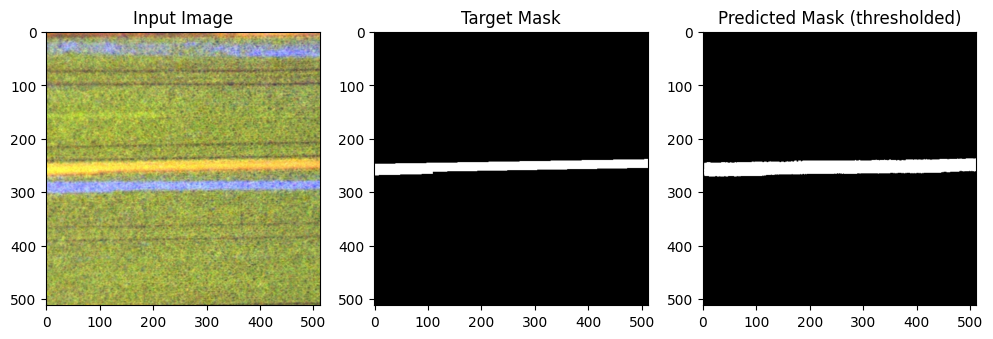

Validation:  97%|█████████▋| 71/73 [16:45<00:28, 14.11s/it]

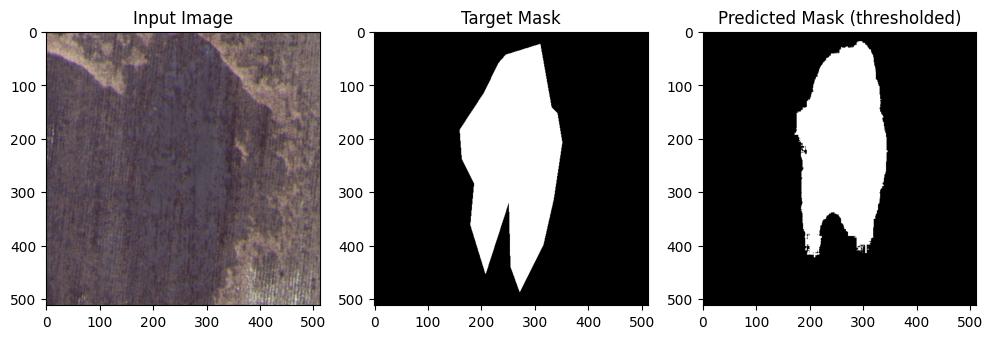

Validation:  99%|█████████▊| 72/73 [16:59<00:14, 14.08s/it]

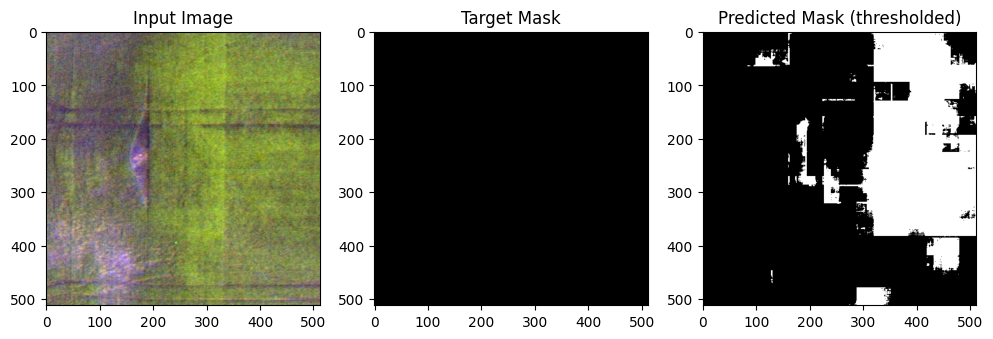

Validation: 100%|██████████| 73/73 [17:08<00:00, 14.09s/it]


In [17]:
import matplotlib.pyplot as plt
trainer_rgbn.model.to('cpu')  
trainer_rgbn.model.eval()     

pbar = tqdm(trainer_rgbn.val_dataloader, desc='Validation')
for inputs, targets in pbar:
    inputs = inputs.cpu()
    targets = {k: v.cpu() for k, v in targets.items()}  

    with torch.no_grad():  # disable gradient for inference
        outputs = trainer_rgbn.model(inputs)

    
    seg_output = outputs['segmentation_output'][0][0]
    seg_mask = (seg_output > 0.5).float()  # threshold at 0.5

    # Plotting
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(inputs[0][0:3].permute(1, 2, 0).numpy())
    plt.title("Input Image")

    plt.subplot(1, 3, 2)
    plt.imshow(targets['segmentation_output'][0][0], cmap="gray")
    plt.title("Target Mask")

    plt.subplot(1, 3, 3)
    plt.imshow(seg_mask.numpy(), cmap="gray")
    plt.title("Predicted Mask (thresholded)")

    plt.show()

In [18]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import torch
import numpy as np
from tqdm import tqdm
from sklearn.metrics import precision_score, recall_score


trainer_rgbn.model.to('cpu')
trainer_rgbn.model.eval()

y_true = []
y_pred = []

pbar = tqdm(trainer_rgbn.val_dataloader, desc='Validation')
for inputs, targets in pbar:
    inputs = inputs.cpu()
    targets = {k: v.cpu() for k, v in targets.items()}

    with torch.no_grad():
        outputs = trainer_rgbn.model(inputs)

    # Collect classification predictions
    logits = outputs['classification_output']  # shape: [B, 6]
    preds = torch.argmax(logits, dim=1)        # shape: [B]
    labels = targets['classification_output']  # shape: [B]

    y_pred.extend(preds.tolist())
    y_true.extend(labels.tolist())


Validation: 100%|██████████| 73/73 [16:21<00:00, 13.45s/it]


In [19]:
y_true_ = np.array(y_true)
y_true_ = np.argmax(y_true_, axis=1)

y_pred_ = np.array(y_pred)

class_names = [
    'nutrient_deficiency',
    'drydown',
    'water',
    'weed_cluster',
    'planter_skip',
    'no relevant'
]

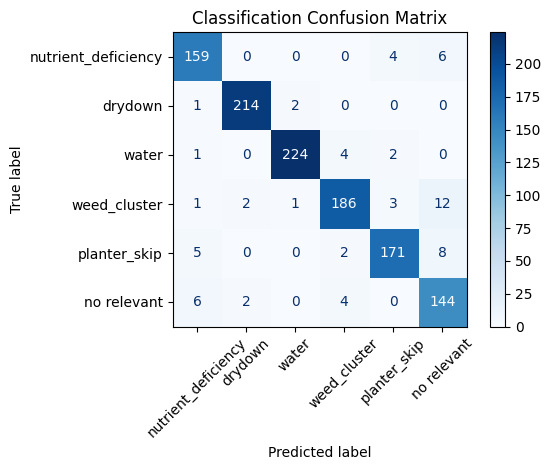

In [20]:
cm = confusion_matrix(y_true_, y_pred_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(xticks_rotation=45, cmap='Blues')
plt.title("Classification Confusion Matrix")
plt.tight_layout()
plt.show()

In [22]:
precision = precision_score(y_true_, y_pred_, average='macro')
recall = recall_score(y_true_, y_pred_, average='macro')

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

Precision: 0.9389
Recall: 0.9411
